# <h1 align='center'> <font color='royalblue'><font size=6>🚲🚴‍♂️YULU_Bikes - Business CaseStudy🚴‍♂️🚲</font> </font></h1>
<h1 align='center'><font color='royalblue'><font size=6>Hypothesis Testing</font> </font></h1>
<h2 align='right'>Analysed by : <font color='green'><b> KASI</b></font></h2>

<kbd>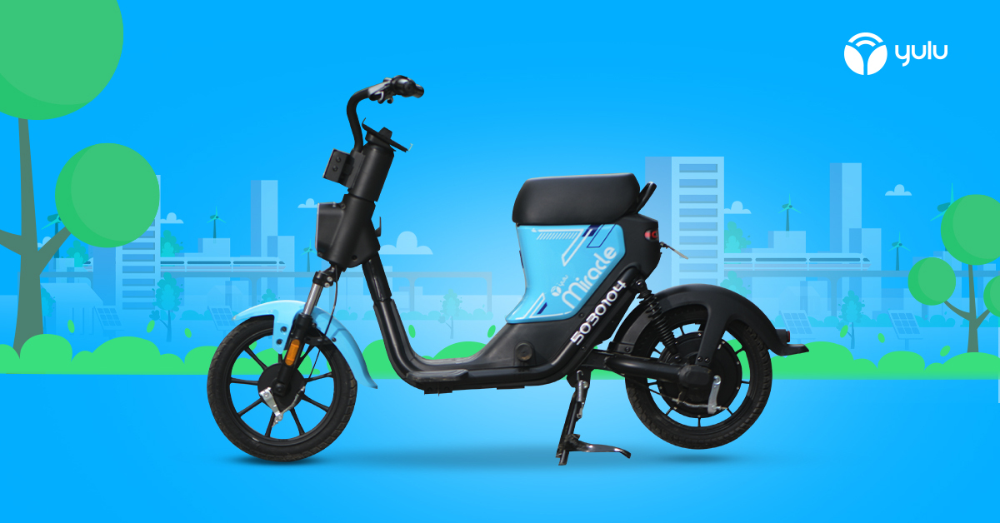</kbd>

## Introduction:

### 🚲Yulu: Zipping Through Indian Cities with Green Scooters

`Yulu`, India's pioneering micro-mobility service provider, has embarked on a mission to revolutionize daily commutes by offering unique, sustainable transportation solutions. However, recent revenue setbacks have prompted Yulu to seek the expertise of a consulting company to delve into the factors influencing the demand for their shared electric cycles, specifically in the Indian market. India's leading micromobility platform, transforming urban commutes. Founded in `2017`, Yulu isn't just about rides, it's about a sustainable future.

🌐 Website :	www.yulu.bike

**The Yulu Way:**

* **E-scooters and e-bikes:** Ditch cars, hail a Yulu! These dockless rides, accessed through a slick app, are scattered across Bengaluru, Mumbai, Delhi, and more.
* **Convenience reigns:** Find, unlock, and park your Yulu anywhere within designated zones. No docking dramas, just hop on and off!
* **Green warriors:** Every Yulu ride cuts traffic congestion and carbon emissions, breathing new life into city air.

**Impact beyond rides:**

* **Over 25,000 Yulu scoots and millions of happy riders:** More than just a fun ride, Yulu is a movement.
* **Boosting the local economy:** Yulu creates jobs, supports businesses, and revitalizes cityscapes.
* **Yulu Wynn:** Introducing India's first truly keyless electric scooter, offering personal e-mobility options.


**Yulu's not just a company; it's a vision:** 

A vision of urban streets buzzing with eco-friendly rides, a vision of cleaner air, and a vision of a future where getting around is effortless and green. So, next time you're in an Indian city, ditch the cab, skip the bus, and Yulu your way to a better future.

**In a nutshell:** 

    Yulu = Green Mobility. Indian cities = Grateful (and scooting!).

-----

### Why this case study?

- From Yulu's Perspective:
    
    - Strategic Expansion: Yulu's decision to enter the Indian market is a strategic move to expand its global footprint. Understanding the demand factors in this new market is essential to tailor their services and strategies accordingly.
    - Revenue Recovery: Yulu's recent revenue decline is a pressing concern. By analyzing the factors affecting demand for shared electric cycles in the Indian market, they can make informed adjustments to regain profitability. 
      
        
    

- From Learners' Perspective:  

    - Real-World Problem-Solving: It presents an opportunity to apply machine learning and data analysis techniques to address a real-world business problem.
    - Market Insights: Analyzing factors affecting demand in the Indian market equips learners with market research skills. This knowledge is transferable to various industries.
    - Consulting Skills: Learners can develop their ability to act as consultants, providing data-driven insights to organizations


------    


## Business Problem:

- Which variables are significant in predicting the demand for shared electric cycles in the Indian market ?
        
- How well those variables describe the electric cycle demands.


------
        
## 📃 Features of the dataset:

- Column Profiling:

| Feature | Description |
|:--------|:------------|
|datetime| datetime |  
|season| season (1: spring, 2: summer, 3: fall, 4: winter)|
|holiday| whether day is a holiday or not (extracted from http://dchr.dc.gov/page/holiday-schedule)|
|workingday| if day is neither weekend nor holiday is 1, otherwise is 0.|
|temp| temperature in Celsius|
|atemp| feeling temperature in Celsius|
|humidity| humidity|
|windspeed| wind speed|
|casual| count of casual users|
|registered| count of registered users|
|count - Total_riders| count of total rental bikes including both casual and registered|

- weather

|Category|Details|
|:------|:--------|
|1| Clear, Few clouds, partly cloudy, partly cloudy|
|2| Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist|
|3| Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds|
|4| Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog|
    
-----

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from scipy.stats import norm,zscore,boxcox,probplot
from statsmodels.stats import weightstats as stests
from statsmodels.stats.proportion import proportions_ztest
from scipy.stats import ttest_ind,ttest_rel,ttest_1samp,mannwhitneyu
from scipy.stats import chisquare,chi2,chi2_contingency
from scipy.stats import f_oneway,kruskal,shapiro,levene,kstest
from scipy.stats import pearsonr,spearmanr
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
import warnings
warnings.filterwarnings('ignore')

In [2]:
yulu_data = pd.read_csv('bike_sharing.csv')

In [3]:
yd = yulu_data.copy()
yd

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
0,2011-01-01 00:00:00,1,0,0,1,9.84,14.395,81,0.0000,3,13,16
1,2011-01-01 01:00:00,1,0,0,1,9.02,13.635,80,0.0000,8,32,40
2,2011-01-01 02:00:00,1,0,0,1,9.02,13.635,80,0.0000,5,27,32
3,2011-01-01 03:00:00,1,0,0,1,9.84,14.395,75,0.0000,3,10,13
4,2011-01-01 04:00:00,1,0,0,1,9.84,14.395,75,0.0000,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
10881,2012-12-19 19:00:00,4,0,1,1,15.58,19.695,50,26.0027,7,329,336
10882,2012-12-19 20:00:00,4,0,1,1,14.76,17.425,57,15.0013,10,231,241
10883,2012-12-19 21:00:00,4,0,1,1,13.94,15.910,61,15.0013,4,164,168
10884,2012-12-19 22:00:00,4,0,1,1,13.94,17.425,61,6.0032,12,117,129


### **Exploration of data :**

In [4]:
yd.rename(columns={'count':'total_riders'},inplace=True)

In [5]:
yd.shape

(10886, 12)

In [6]:
yd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   datetime      10886 non-null  object 
 1   season        10886 non-null  int64  
 2   holiday       10886 non-null  int64  
 3   workingday    10886 non-null  int64  
 4   weather       10886 non-null  int64  
 5   temp          10886 non-null  float64
 6   atemp         10886 non-null  float64
 7   humidity      10886 non-null  int64  
 8   windspeed     10886 non-null  float64
 9   casual        10886 non-null  int64  
 10  registered    10886 non-null  int64  
 11  total_riders  10886 non-null  int64  
dtypes: float64(3), int64(8), object(1)
memory usage: 1020.7+ KB


### 🏷️ Insights
***Observations :***

*  There are 10886 rows and 12 columns in the data.
*  There are no null values.
*  There are also no duplicate values.
*  The columns **"datetime"** have object datatype.
*  The columns **"season"**, **"holiday"**, **"workingday"**, **"weather"**, **"humidity"**, **"casual"**, **"registered"** and **"total_riders"** have int datatype.
*  The columns **"temp"**, **"atemp"**, and **"windspeed"** have float datatype.

**Data Type Conversion**
* The data type of datetime should be in datetime format.
* At the same time season, holiday, workingday, weather should in object format as they are categorical in nature

In [5]:
yd['datetime'] = pd.to_datetime(yd['datetime'])

In [8]:
yd['datetime'].dtype

dtype('<M8[ns]')

In [6]:
yd['year'] = yd['datetime'].dt.year
yd['month'] = yd['datetime'].dt.month
yd['hour'] = yd['datetime'].dt.hour
yd['month'] = yd['month'].replace({1: 'January',
                                   2: 'February',
                                   3: 'March',
                                   4: 'April',
                                   5: 'May',
                                   6: 'June',
                                   7: 'July',
                                   8: 'August',
                                   9: 'September',
                                   10: 'October',
                                   11: 'November',
                                   12: 'December'})

In [10]:
yd.skew(numeric_only = True)

season         -0.007076
holiday         5.660517
workingday     -0.776163
weather         1.243484
temp            0.003691
atemp          -0.102560
humidity       -0.086335
windspeed       0.588767
casual          2.495748
registered      1.524805
total_riders    1.242066
year           -0.007717
hour           -0.009125
dtype: float64

#### 🏷️Insights:

**Skewness Analysis of Variables**

* Symmetrical Majority:
    - The majority of the variables, including 'season' and 'temp', exhibit skewness values close to zero, suggesting relatively symmetrical distributions.  
    
    
>
    
* Positive Skewness Insights:
    - Variables such as 'holiday', 'weather', 'windspeed', 'casual', 'registered', and 'count' demonstrate positive skewness, pointing to a concentration of lower values and a right skewed in their distributions.  
    
>    
    

* Negative Skewness Observations:
    - In contrast, 'workingday', 'atemp', and 'humidity' exhibit negative skewness, implying a concentration of higher values and a left skewed in their distributions.


----
### 📝 Statistical Summary

In [11]:
yd.describe(include='all').T

,count,unique,top,freq,mean,min,25%,50%,75%,max,std
datetime,10886,NaN,NaN,NaN,2011-12-27 05:56:22.399411968,2011-01-01 00:00:00,2011-07-02 07:15:00,2012-01-01 20:30:00,2012-07-01 12:45:00,2012-12-19 23:00:00,NaN
season,10886.0,NaN,NaN,NaN,2.506614,1.0,2.0,3.0,4.0,4.0,1.116174
holiday,10886.0,NaN,NaN,NaN,0.028569,0.0,0.0,0.0,0.0,1.0,0.166599
workingday,10886.0,NaN,NaN,NaN,0.680875,0.0,0.0,1.0,1.0,1.0,0.466159
weather,10886.0,NaN,NaN,NaN,1.418427,1.0,1.0,1.0,2.0,4.0,0.633839
temp,10886.0,NaN,NaN,NaN,20.23086,0.82,13.94,20.5,26.24,41.0,7.79159
atemp,10886.0,NaN,NaN,NaN,23.655084,0.76,16.665,24.24,31.06,45.455,8.474601
humidity,10886.0,NaN,NaN,NaN,61.88646,0.0,47.0,62.0,77.0,100.0,19.245033
windspeed,10886.0,NaN,NaN,NaN,12.799395,0.0,7.0015,12.998,16.9979,56.9969,8.164537
casual,10886.0,NaN,NaN,NaN,36.021955,0.0,4.0,17.0,49.0,367.0,49.960477


### 📜📜**Duplicate Detection**

In [12]:
yd[yd.duplicated()]

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,total_riders,year,month,hour


### 🏷️ Insights

- The dataset does not contain any duplicates.
-----
### 🔸❓**Null Detection**

In [13]:
yd.isna().any()

datetime        False
season          False
holiday         False
workingday      False
weather         False
temp            False
atemp           False
humidity        False
windspeed       False
casual          False
registered      False
total_riders    False
year            False
month           False
hour            False
dtype: bool

In [14]:
yd.isna().sum()

datetime        0
season          0
holiday         0
workingday      0
weather         0
temp            0
atemp           0
humidity        0
windspeed       0
casual          0
registered      0
total_riders    0
year            0
month           0
hour            0
dtype: int64

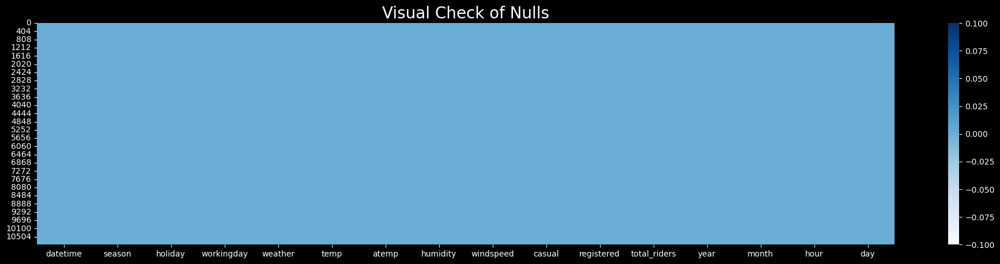

In [34]:
plt.figure(figsize=(24,5))
plt.style.use('dark_background')
sns.heatmap(yd.isnull(),cmap='Blues')
plt.title('Visual Check of Nulls',fontsize=20)
plt.show()

In [16]:
print(list(yd.columns))

['datetime', 'season', 'holiday', 'workingday', 'weather', 'temp', 'atemp', 'humidity', 'windspeed', 'casual', 'registered', 'total_riders', 'year', 'month', 'hour']


----
### **🕎 Changing the Datatype of Columns**

In [7]:
for _ in yd.columns[1:5]:
    yd[_] = yd[_].astype('category')
yd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   datetime      10886 non-null  datetime64[ns]
 1   season        10886 non-null  category      
 2   holiday       10886 non-null  category      
 3   workingday    10886 non-null  category      
 4   weather       10886 non-null  category      
 5   temp          10886 non-null  float64       
 6   atemp         10886 non-null  float64       
 7   humidity      10886 non-null  int64         
 8   windspeed     10886 non-null  float64       
 9   casual        10886 non-null  int64         
 10  registered    10886 non-null  int64         
 11  total_riders  10886 non-null  int64         
 12  year          10886 non-null  int32         
 13  month         10886 non-null  object        
 14  hour          10886 non-null  int32         
dtypes: category(4), datetime64[ns](1), f

In [18]:
yd.describe(include='category').T

,count,unique,top,freq
season,10886,4,4,2734
holiday,10886,2,0,10575
workingday,10886,2,1,7412
weather,10886,4,1,7192


### 🏷️ Insights

- The dataset does not contain any missing values.

-----

## 🕵️‍♂️**Exploratory Data Analysis**

### 🔰**Non-Graphical Analysis** 

In [8]:
yd['season']= yd['season'].map(str)
season_mapping = {'1':'spring', '2':'summer', '3':'fall', '4':'winter'}
yd["season"] = yd["season"].map(lambda x: season_mapping[x])


yd['holiday']= yd['holiday'].map(str)
holiday_mapping = {'0':'no', '1':'yes'}
yd["holiday"] = yd["holiday"].map(lambda x: holiday_mapping[x])

yd['workingday']= yd['workingday'].map(str)
working_day_mapping = {'0':'no', '1':'yes'}
yd["workingday"] = yd["workingday"].map(lambda x: working_day_mapping[x])

yd['weather']= yd['weather'].map(str)
weather_mapping = {'1':'clear', '2':'partly_cloudy', '3':'rain', '4':'heavy rain'}
yd["weather"] = yd["weather"].map(lambda x: weather_mapping[x])

In [20]:
yd.sample(7)

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,total_riders,year,month,hour
9995,2012-11-01 20:00:00,winter,no,yes,partly_cloudy,15.58,19.695,54,16.9979,16,280,296,2012,November,20
8567,2012-07-18 08:00:00,fall,no,yes,clear,31.98,37.120,62,7.0015,55,624,679,2012,July,8
9450,2012-09-17 03:00:00,fall,no,yes,clear,20.50,24.240,77,6.0032,0,7,7,2012,September,3
3692,2011-09-04 18:00:00,fall,no,no,clear,31.16,36.365,66,12.9980,187,169,356,2011,September,18
6141,2012-02-12 03:00:00,spring,no,no,partly_cloudy,4.10,2.275,46,46.0022,0,14,14,2012,February,3
2175,2011-05-17 13:00:00,summer,no,yes,partly_cloudy,22.96,26.515,88,22.0028,31,141,172,2011,May,13
6365,2012-03-02 11:00:00,spring,no,yes,clear,15.58,19.695,46,12.9980,40,154,194,2012,March,11


In [21]:
#checking the unique values for columns
for col in yd.columns:
    print()
    print('Total Unique Values in',col,'column are :-',yd[col].nunique())
    print('Unique Values in',col,'column are :-\n',yd[col].unique())
    print()
    print('-'*140)


Total Unique Values in datetime column are :- 10886
Unique Values in datetime column are :-
 <DatetimeArray>
['2011-01-01 00:00:00', '2011-01-01 01:00:00', '2011-01-01 02:00:00',
 '2011-01-01 03:00:00', '2011-01-01 04:00:00', '2011-01-01 05:00:00',
 '2011-01-01 06:00:00', '2011-01-01 07:00:00', '2011-01-01 08:00:00',
 '2011-01-01 09:00:00',
 ...
 '2012-12-19 14:00:00', '2012-12-19 15:00:00', '2012-12-19 16:00:00',
 '2012-12-19 17:00:00', '2012-12-19 18:00:00', '2012-12-19 19:00:00',
 '2012-12-19 20:00:00', '2012-12-19 21:00:00', '2012-12-19 22:00:00',
 '2012-12-19 23:00:00']
Length: 10886, dtype: datetime64[ns]

--------------------------------------------------------------------------------------------------------------------------------------------

Total Unique Values in season column are :- 4
Unique Values in season column are :-
 ['spring', 'summer', 'fall', 'winter']
Categories (4, object): ['spring', 'summer', 'fall', 'winter']

-------------------------------------------------

In [22]:
yd.columns

Index(['datetime', 'season', 'holiday', 'workingday', 'weather', 'temp',
       'atemp', 'humidity', 'windspeed', 'casual', 'registered',
       'total_riders', 'year', 'month', 'hour'],
      dtype='object')

In [15]:
for _ in yd.columns[5:]:
    if yd[_].dtype != 'category':
        print(f'Value_counts of the column {_} are :-{yd[_].value_counts().to_frame().reset_index()}')
        print()
        print('-'*140)
        print()

Value_counts of the column temp are :- 
     temp  count
0   14.76    467
1   26.24    453
2   28.70    427
3   13.94    413
4   18.86    406
5   22.14    403
6   25.42    403
7   16.40    400
8   22.96    395
9   27.06    394
10  24.60    390
11  12.30    385
12  21.32    362
13  17.22    356
14  13.12    356
15  29.52    353
16  10.66    332
17  18.04    328
18  20.50    327
19  30.34    299
20   9.84    294
21  15.58    255
22   9.02    248
23  31.16    242
24   8.20    229
25  27.88    224
26  23.78    203
27  32.80    202
28  11.48    181
29  19.68    170
30   6.56    146
31  33.62    130
32   5.74    107
33   7.38    106
34  31.98     98
35  34.44     80
36  35.26     76
37   4.92     60
38  36.90     46
39   4.10     44
40  37.72     34
41  36.08     23
42   3.28     11
43   0.82      7
44  38.54      7
45  39.36      6
46   2.46      5
47   1.64      2
48  41.00      1

-------------------------------------------------------------------------------------------------------------

#### 🔖What is the time period for which the data is given ?

In [24]:
yd.datetime.min()

Timestamp('2011-01-01 00:00:00')

In [25]:
yd.datetime.max()

Timestamp('2012-12-19 23:00:00')

In [26]:
yd.datetime.max() - yd.datetime.min()

Timedelta('718 days 23:00:00')

In [12]:
yd['day'] = yd['datetime'].dt.day_name()

In [28]:
yd.sample(6)

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,total_riders,year,month,hour,day
2061,2011-05-12 19:00:00,summer,no,yes,partly_cloudy,24.60,30.305,64,12.9980,59,305,364,2011,May,19,Thursday
4937,2011-11-18 19:00:00,winter,no,yes,clear,11.48,13.635,41,11.0014,7,183,190,2011,November,19,Friday
6387,2012-03-03 09:00:00,spring,no,no,rain,15.58,19.695,87,6.0032,7,87,94,2012,March,9,Saturday
4472,2011-10-18 09:00:00,winter,no,yes,partly_cloudy,21.32,25.000,77,6.0032,29,198,227,2011,October,9,Tuesday
1679,2011-04-15 21:00:00,summer,yes,no,partly_cloudy,16.40,20.455,76,19.9995,25,77,102,2011,April,21,Friday
1128,2011-03-11 16:00:00,spring,no,yes,partly_cloudy,13.94,15.150,49,19.9995,18,95,113,2011,March,16,Friday


In [13]:
for _ in yd.columns:
    if yd[_].dtype=='category':
        display(yd[_].value_counts().to_frame().reset_index())
        print()
        print('-'*137)
        print()

,season,count
0,winter,2734
1,fall,2733
2,summer,2733
3,spring,2686



-----------------------------------------------------------------------------------------------------------------------------------------



,holiday,count
0,no,10575
1,yes,311



-----------------------------------------------------------------------------------------------------------------------------------------



,workingday,count
0,yes,7412
1,no,3474



-----------------------------------------------------------------------------------------------------------------------------------------



,weather,count
0,clear,7192
1,partly_cloudy,2834
2,rain,859
3,heavy rain,1



-----------------------------------------------------------------------------------------------------------------------------------------



In [16]:
for _ in yd.columns:
    if yd[_].dtype=='category':
        print()
        display(np.round(yd[_].value_counts(normalize = True) * 100, 2).reset_index())
        print()
        print('-'*137)
        print()

,season,proportion
0,winter,25.11
1,fall,25.11
2,summer,25.11
3,spring,24.67



-----------------------------------------------------------------------------------------------------------------------------------------




,holiday,proportion
0,no,97.14
1,yes,2.86



-----------------------------------------------------------------------------------------------------------------------------------------




,workingday,proportion
0,yes,68.09
1,no,31.91



-----------------------------------------------------------------------------------------------------------------------------------------




,weather,proportion
0,clear,66.07
1,partly_cloudy,26.03
2,rain,7.89
3,heavy rain,0.01



-----------------------------------------------------------------------------------------------------------------------------------------



### 📊Visual analysis
📈**Univariate and Bivariate graphs**

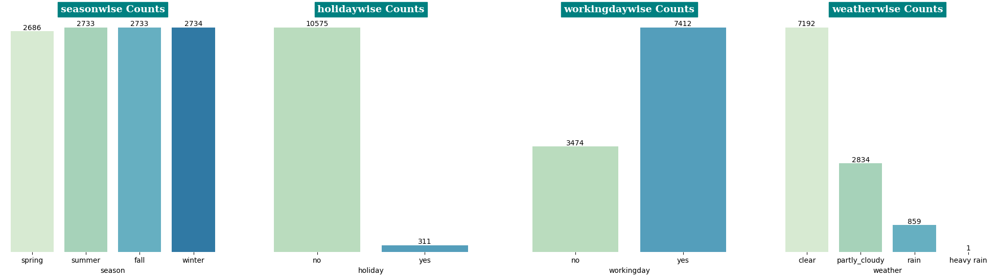

In [37]:
plt.figure(figsize=(25,6))
plt.style.use('default')
plt.style.use('seaborn-bright')

i=1
for _ in yd.columns:
    if yd[_].dtype=='category':
        plt.subplot(1,4,i)
        a=sns.countplot(data=yd, x=yd[_],palette='GnBu')
        plt.title(f'{_}wise Counts',fontsize=14,fontfamily='serif',fontweight='bold',backgroundcolor='teal',color='w')
        a.bar_label(a.containers[0], label_type='edge')
        sns.despine(left=True,bottom=True)
        plt.yticks([])
        plt.ylabel('')
        i+=1

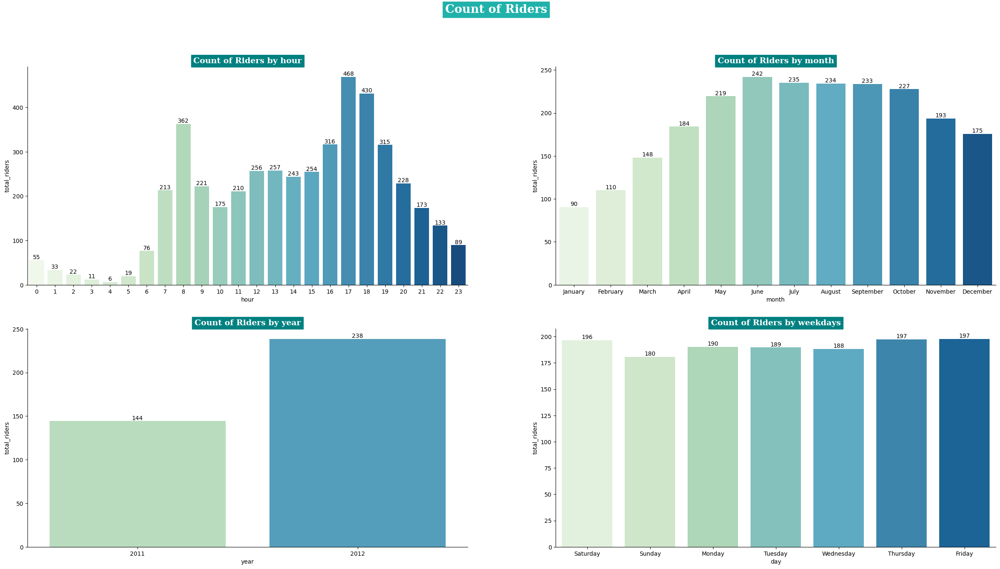

In [38]:
plt.figure(figsize=(30,15))
plt.suptitle('Count of Riders',fontsize=20,fontfamily='serif',fontweight='bold',backgroundcolor='lightseagreen',color='w')

plt.subplot(221)
b=sns.barplot(data=yd, x="hour", y="total_riders",palette='GnBu',ci=None)
b.bar_label(b.containers[0],fmt='%d') # %d-int 
plt.title('Count of Riders by hour',fontsize=14,fontfamily='serif',fontweight='bold',backgroundcolor='teal',color='w')

plt.subplot(222)
b=sns.barplot(data=yd, x="month", y="total_riders",palette='GnBu',ci=None)
b.bar_label(b.containers[0], label_type='edge',fmt='%d')
plt.title('Count of Riders by month',fontsize=14,fontfamily='serif',fontweight='bold',backgroundcolor='teal',color='w')

plt.subplot(223)
b=sns.barplot(data=yd, x="year", y="total_riders",palette='GnBu',ci=None)
b.bar_label(b.containers[0], label_type='edge',fmt='%d')
plt.title('Count of Riders by year',fontsize=14,fontfamily='serif',fontweight='bold',backgroundcolor='teal',color='w')

plt.subplot(224)
b=sns.barplot(data=yd, x="day", y="total_riders",palette='GnBu',ci=None)
b.bar_label(b.containers[0], label_type='edge',fmt='%d')
plt.title('Count of Riders by weekdays',fontsize=14,fontfamily='serif',fontweight='bold',backgroundcolor='teal',color='w')
sns.despine()

plt.show()

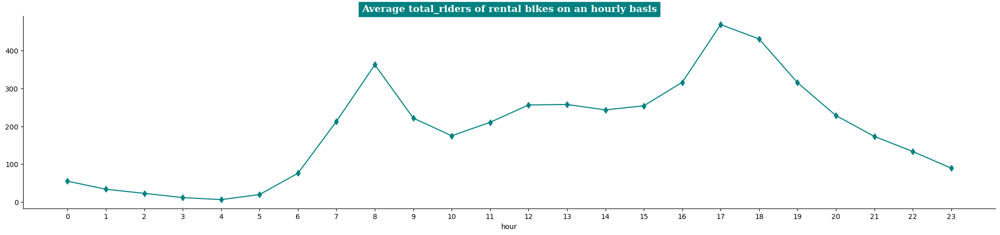

In [112]:
plt.figure(figsize = (25,5))
plt.title("Average total_riders of rental bikes on an hourly basis"
          ,fontsize=14,fontfamily='serif',fontweight='bold',backgroundcolor='teal',color='w')
yd.groupby('hour')['total_riders'].mean().plot(kind = 'line', marker = 'd',color=cp[0])
plt.xticks(np.arange(0, 24))
sns.despine()
plt.show()

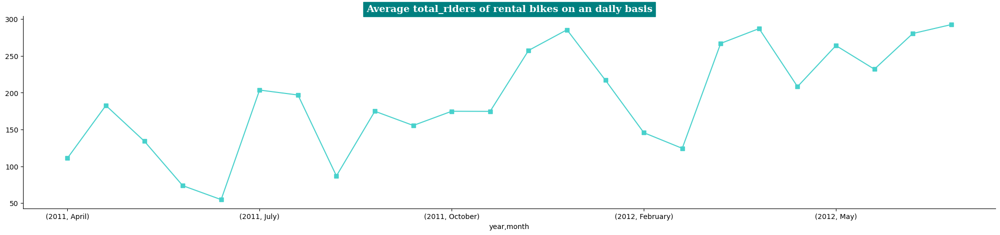

In [111]:
plt.figure(figsize = (25,5))
plt.title("Average total_riders of rental bikes on an daily basis"
          ,fontsize=14,fontfamily='serif',fontweight='bold',backgroundcolor='teal',color='w')
yd.groupby(['year','month'])['total_riders'].mean().plot(kind = 'line', marker = 's',color=cp[1])
sns.despine()
plt.show()

#### 🏷️Insights:

- These patterns indicate that there is a distinct fluctuation in total_riders throughout the day, with low counts during early morning hours, a sudden increase in the morning, a peak count in the afternoon, and a gradual decline in the evening and nighttime.

- These patterns indicate that there is a distinct fluctuation in count throughout the month,yearwise but gradually increasing the count of total_riders

In [17]:
num_cols = yd.iloc[:,5:12]
num_cols

,temp,atemp,humidity,windspeed,casual,registered,total_riders
0,9.84,14.395,81,0.0000,3,13,16
1,9.02,13.635,80,0.0000,8,32,40
2,9.02,13.635,80,0.0000,5,27,32
3,9.84,14.395,75,0.0000,3,10,13
4,9.84,14.395,75,0.0000,0,1,1
...,...,...,...,...,...,...,...
10881,15.58,19.695,50,26.0027,7,329,336
10882,14.76,17.425,57,15.0013,10,231,241
10883,13.94,15.910,61,15.0013,4,164,168
10884,13.94,17.425,61,6.0032,12,117,129


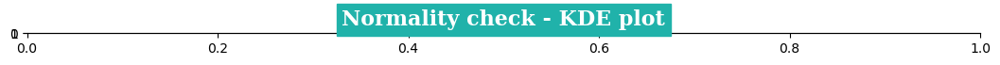

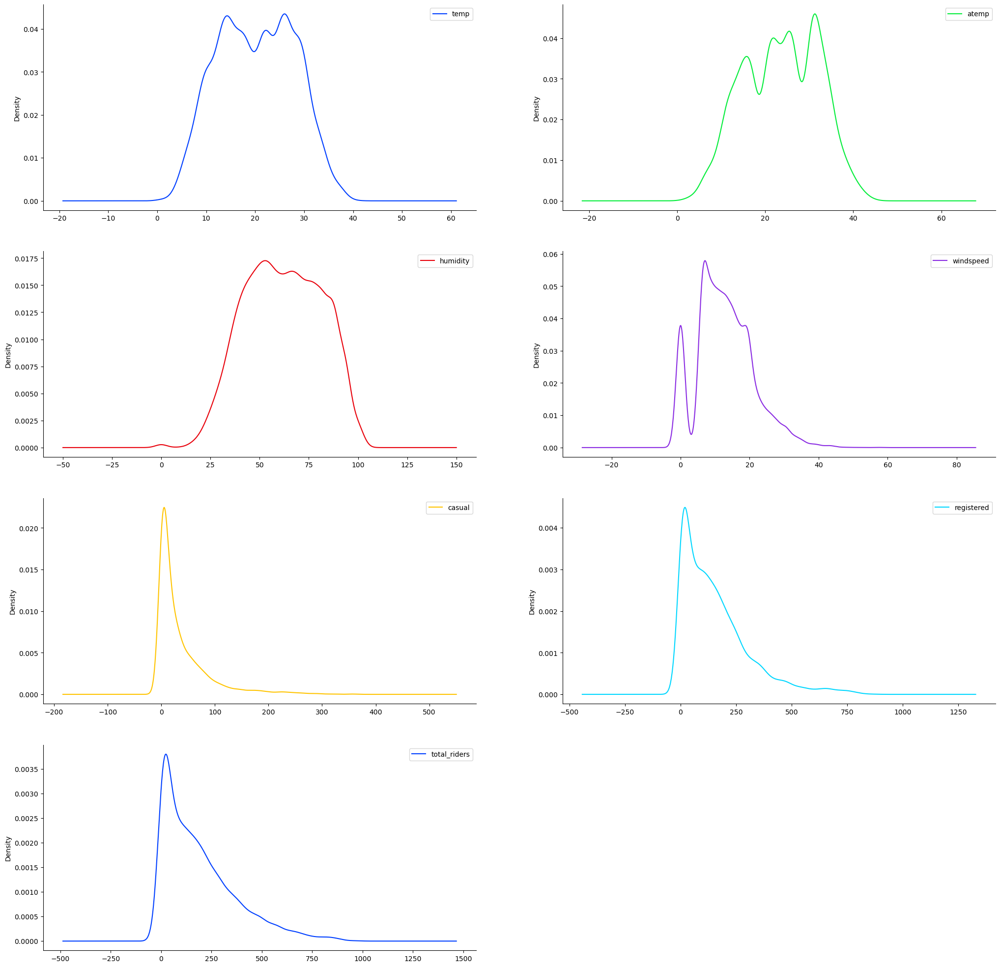

In [105]:
plt.figure(figsize=(13,0))
plt.title('Normality check - KDE plot',fontsize=16,fontfamily='serif',fontweight='bold',backgroundcolor='lightseagreen',color='w')
plt.rcParams['figure.figsize'] = [25, 25]
num_cols.plot(kind='density', subplots=True, layout=(4,2), sharex=False)
sns.despine()
plt.show()

### 🏷️Insights
> **Observations on distributions of Continous variables**
* We can see that the variables - Casual, Registered and Count are skewed to the right.
* By looking at the distribution for windspeed, we can see that it follows a binomial distribution. Because there were days when there were 0 windspeed and on the other days there was low - moderate windspeed.
* The Temp, Atemp and Humidity follows (somewhat) a Normal distribution. Because most of their data points are centered around the mean however we will still try to test this hypothesis by using Shapiro.

### SHAPIRO-Wilks Test

In [95]:
yd.columns

Index(['datetime', 'season', 'holiday', 'workingday', 'weather', 'temp',
       'atemp', 'humidity', 'windspeed', 'casual', 'registered',
       'total_riders', 'year', 'month', 'hour'],
      dtype='object')

In [101]:
for i in list(yd.columns[5:-2]):

    print()
    test_statistic, p_value = shapiro(yd[i])
    print(f'Normality Testing for {i} :')
    print("-"*30)

    print(f"The test-statistic for {i} is {test_statistic} with p_value {p_value}")

    if p_value > 0.05:
        print("Hence at 95% confidence level, we fail to reject null hypothesis")
        print(f"Hence we can say that {i} is normally distributed population")

    else:
        print("Hence at 95% confidence level, we reject null hypothesis")
        print(f"Hence we can say that {i} is not normally distributed population")

    print()
    print("-"*100)
    


Normality Testing for temp :
------------------------------
The test-statistic for temp is 0.9804227352142334 with p_value 4.577117001754969e-36
Hence at 95% confidence level, we reject null hypothesis
Hence we can say that temp is not normally distributed population

----------------------------------------------------------------------------------------------------

Normality Testing for atemp :
------------------------------
The test-statistic for atemp is 0.9815532565116882 with p_value 3.35599504562436e-35
Hence at 95% confidence level, we reject null hypothesis
Hence we can say that atemp is not normally distributed population

----------------------------------------------------------------------------------------------------

Normality Testing for humidity :
------------------------------
The test-statistic for humidity is 0.9822683930397034 with p_value 1.244270413072488e-34
Hence at 95% confidence level, we reject null hypothesis
Hence we can say that humidity is not normall

In [14]:
cp = ['teal' , 'mediumturquoise' , 'aqua' , 'powderblue' , 'cyan','teal' , 'mediumturquoise' , 'aqua' , 'powderblue' , 'cyan']

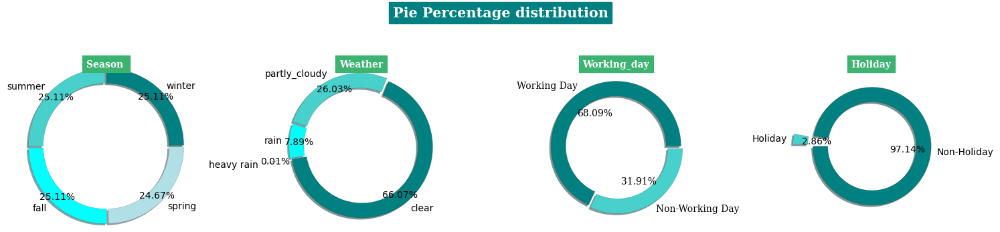

In [43]:
plt.figure(figsize=(15,4))
plt.suptitle('Pie Percentage distribution',fontsize=15,fontfamily='serif',fontweight='bold',backgroundcolor=cp[0],color='w')

plt.subplot(141)
plt.pie(yd['season'].value_counts(), labels=yd['season'].value_counts().index, colors=cp,
       counterclock=True , explode=(0.02,0.02,0.02,0.02) , autopct='%.2f%%', pctdistance=0.905,
       textprops={'color':'k','fontsize':10} , shadow=True, radius=1.3,
       wedgeprops=dict(edgecolor='k',linewidth=0.1,width=0.25))
plt.title('Season ',fontsize=10,fontfamily='serif',fontweight='bold',backgroundcolor='mediumseagreen',color='w')

plt.subplot(142)
plt.pie(yd['weather'].value_counts(), labels=yd['weather'].value_counts().index,
       startangle=190 , explode=(0.02,0.04,0.02,0.45) , autopct='%.2f%%',pctdistance=0.858,
       colors=cp , textprops={'color':'k','fontsize':10} , shadow=True,radius=1.2,
        wedgeprops=dict(edgecolor='k',linewidth=0.1,antialiased=True,width=0.25))
plt.title('Weather',fontsize=10,fontfamily='serif',fontweight='bold',backgroundcolor='mediumseagreen',color='w')

plt.subplot(143)
yd_workingday = np.round(yd['workingday'].value_counts(normalize = True) * 100, 2)
plt.pie(x = yd_workingday, explode = [0, 0.05], labels = ['Working Day', 'Non-Working Day'],colors=cp,
        autopct = '%.2f%%', textprops = {'fontsize' : 10,'fontfamily' : 'serif','fontweight' : 500},
       wedgeprops=dict(edgecolor='k',linewidth=0.1,width=0.25),radius=1.1, shadow=True)
plt.title('Working_day',fontsize=10,fontfamily='serif',fontweight='bold',backgroundcolor='mediumseagreen',color='w')

plt.subplot(144)
df_holiday = np.round(yd['holiday'].value_counts(normalize = True) * 100, 2)
plt.pie(df_holiday, labels=['Non-Holiday', 'Holiday'],
       startangle=180 , explode=(0.02,0.32) , autopct='%.2f%%',
       colors=cp , textprops={'color':'k','fontsize':10} , shadow=True, radius=1,
       wedgeprops=dict(edgecolor='k',linewidth=0.1,antialiased=True,width=0.25))
plt.title('Holiday',fontsize=10,fontfamily='serif',fontweight='bold',backgroundcolor='mediumseagreen',color='w')
plt.tight_layout()
plt.show()

In [35]:
yd.columns

Index(['datetime', 'season', 'holiday', 'workingday', 'weather', 'temp',
       'atemp', 'humidity', 'windspeed', 'casual', 'registered',
       'total_riders', 'year', 'month', 'hour', 'day'],
      dtype='object')

In [39]:
yd['day'].unique()

array(['Saturday', 'Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday',
       'Friday'], dtype=object)

,day,total_riders
0,Friday,197.844343
1,Monday,190.390716
2,Saturday,196.665404
3,Sunday,180.839772
4,Thursday,197.296201
5,Tuesday,189.723847
6,Wednesday,188.411348


[]

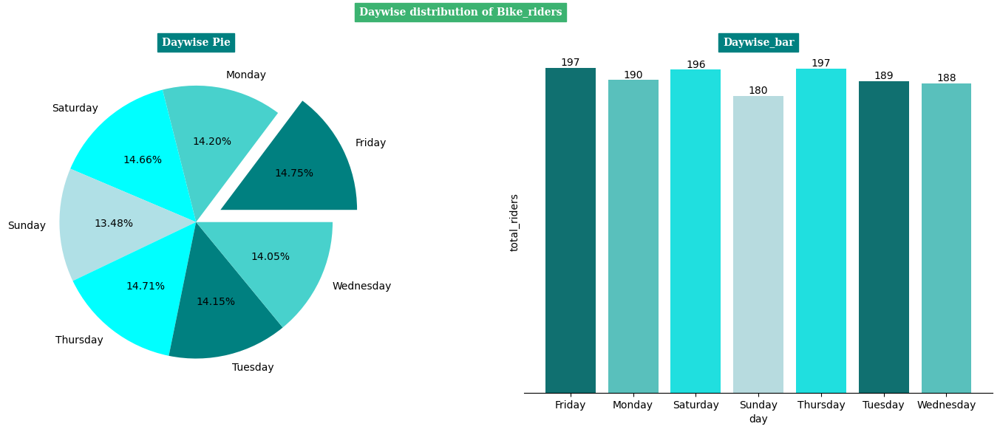

In [63]:
day_cnt_riders=yd.groupby('day')['total_riders'].mean().to_frame().reset_index()
display(day_cnt_riders)


plt.figure(figsize=(18,6))
plt.suptitle('Daywise distribution of Bike_riders',fontsize=10,fontfamily='serif',fontweight='bold',
             backgroundcolor='mediumseagreen',color='w')

plt.subplot(121)
plt.pie(data=day_cnt_riders, x=day_cnt_riders['total_riders'], colors=cp,labels=day_cnt_riders['day'], 
        explode=(0.2,0,0,0,0,0,0), autopct='%0.2f%%')
plt.title('Daywise Pie',fontsize=10,fontfamily='serif',fontweight='bold',backgroundcolor='teal',color='w')

plt.subplot(122)
a=sns.barplot(data=day_cnt_riders,y=day_cnt_riders['total_riders'],x=day_cnt_riders['day'],palette=cp)
a.bar_label(a.containers[0], label_type='edge',fmt='%d')
plt.title('Daywise_bar',fontsize=10,fontfamily='serif',fontweight='bold',backgroundcolor='teal',color='w')
plt.yticks([])

sns.despine(left=True)
plt.plot()

,month,total_riders
0,June,242.031798
1,July,235.325658
2,August,234.118421
3,September,233.805281
4,October,227.699232
5,May,219.459430
6,November,193.677278
7,April,184.160616
8,December,175.614035
9,March,148.169811


[]

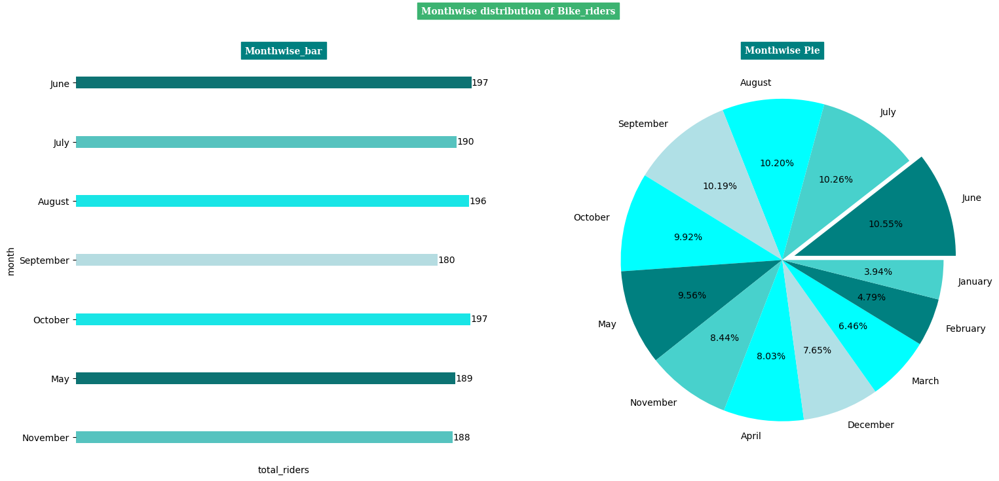

In [84]:
monthwise_riders = yd.groupby('month')['total_riders'].mean().sort_values(ascending=False).to_frame().reset_index()
display(monthwise_riders)

plt.figure(figsize=(18,8))
plt.suptitle('Monthwise distribution of Bike_riders',fontsize=10,fontfamily='serif',fontweight='bold',
             backgroundcolor='mediumseagreen',color='w')

plt.subplot(122)
plt.pie(data=monthwise_riders, x=monthwise_riders['total_riders'], colors=cp,labels=monthwise_riders['month'], 
        explode=(0.08,0,0,0,0,0,0,0,0,0,0,0), autopct='%0.2f%%')
plt.title('Monthwise Pie',fontsize=10,fontfamily='serif',fontweight='bold',backgroundcolor='teal',color='w')

plt.subplot(121)
a=sns.barplot(data=monthwise_riders,x=day_cnt_riders['total_riders'],y=monthwise_riders['month'],palette=cp,width=0.2,saturation=0.8)
a.bar_label(a.containers[0], label_type='edge',fmt='%d')
plt.title('Monthwise_bar',fontsize=10,fontfamily='serif',fontweight='bold',backgroundcolor='teal',color='w')
plt.ylim()
plt.xticks([])

sns.despine(bottom=True,left=True)
plt.plot()

In [19]:
cat_cols = []
for _ in yd.columns:
    if yd[_].dtype=='category':
        cat_cols.append(_)
cat_cols

['season', 'holiday', 'workingday', 'weather']

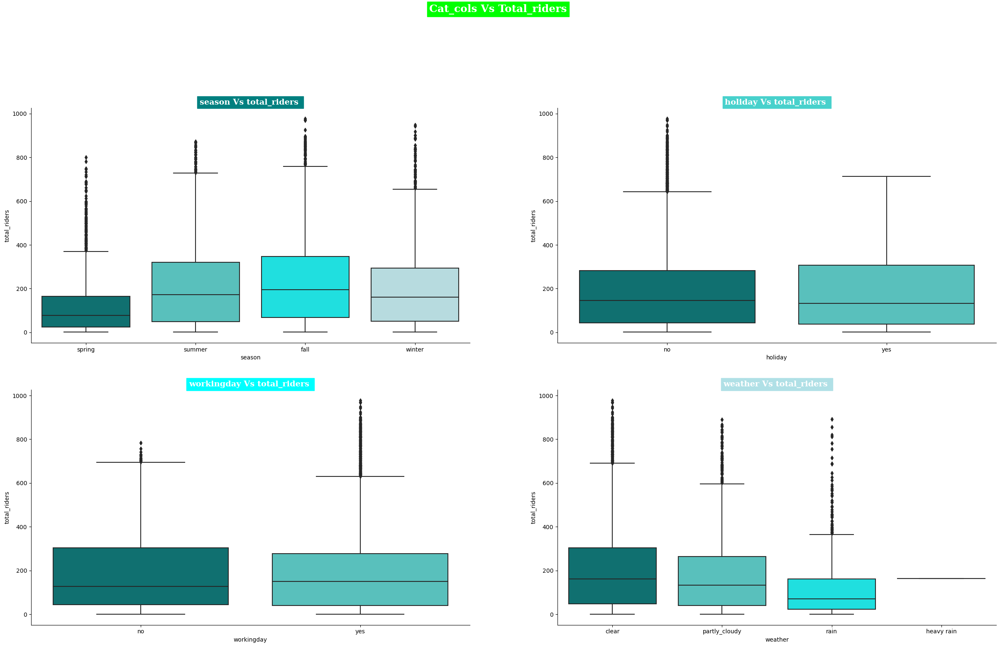

In [116]:
plt.figure(figsize = (30,25))
plt.style.use('seaborn-v0_8-bright')
plt.suptitle(f'Cat_cols Vs Total_riders',fontsize=18,fontfamily='serif',
             fontweight='bold',backgroundcolor='lime',color='w')

for i in range(len(cat_cols)):
    plt.subplot(3,2,i+1)
    sns.boxplot(data = yd, x = cat_cols[i], y='total_riders', palette = cp)
    sns.despine()
    plt.title(f'{cat_cols[i]} Vs total_riders ',fontsize=14,fontfamily='serif',fontweight='bold',backgroundcolor=cp[i],color='w')

In [111]:
yd.sample()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,total_riders,year,month,hour,day
5713,2012-01-13 05:00:00,spring,no,yes,partly_cloudy,12.3,12.12,70,36.9974,0,21,21,2012,January,5,Friday


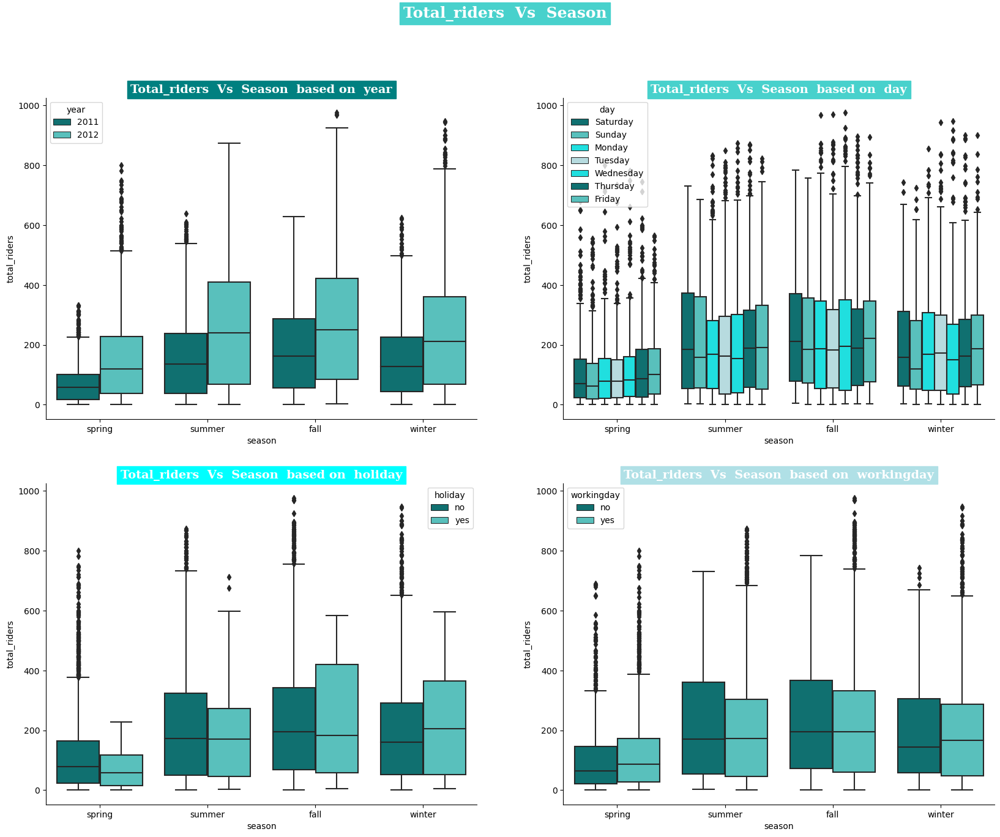

In [118]:
cols = ['year','day','holiday','workingday']
plt.figure(figsize = (20,15))
plt.style.use('seaborn-v0_8-bright')
plt.suptitle(f'Total_riders  Vs  Season', fontsize = 18,fontfamily='serif',fontweight='bold',backgroundcolor=cp[1],color='w')
for i in range(len(cat_cols)):
    plt.subplot(2,2,i+1)
    sns.boxplot(data = yd, x = 'season', y= 'total_riders',hue = cols[i], palette=cp)
    sns.despine()
    plt.title(f'Total_riders  Vs  Season  based on  {cols[i]}', fontsize = 14,fontfamily='serif',fontweight='bold'
              ,backgroundcolor=cp[i],color='w')

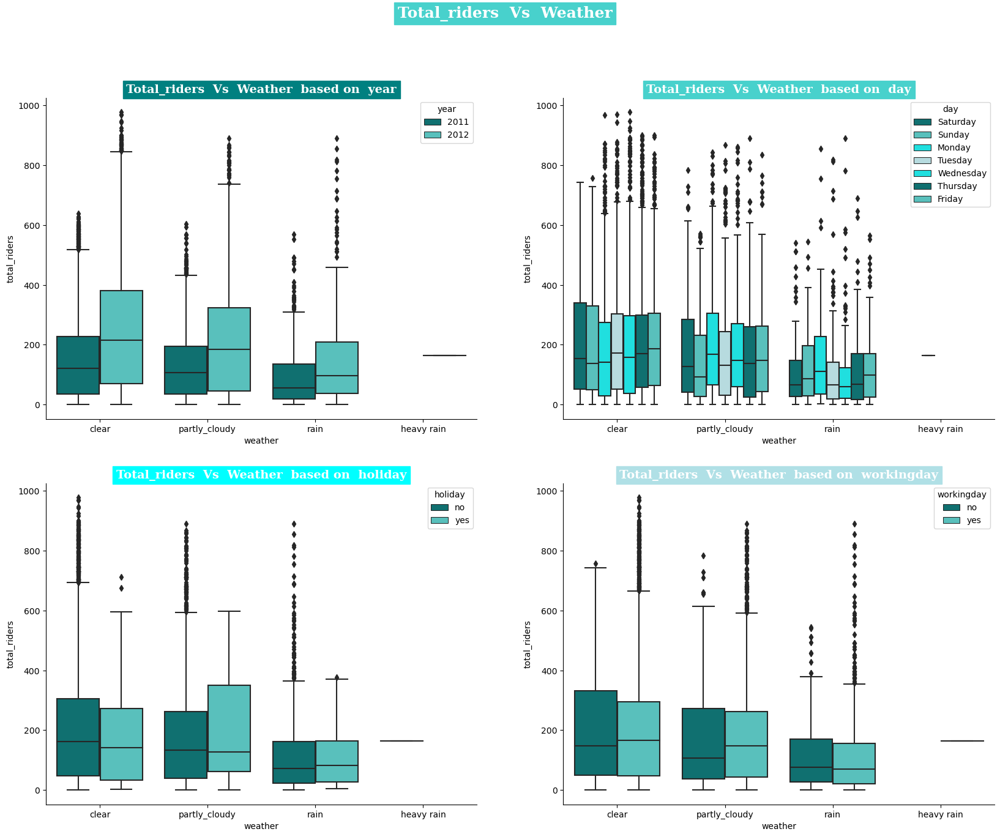

In [119]:
cols = ['year','day','holiday','workingday']
plt.figure(figsize = (20,15))
plt.style.use('seaborn-v0_8-bright')
plt.suptitle(f'Total_riders  Vs  Weather', fontsize = 18,fontfamily='serif',fontweight='bold',backgroundcolor=cp[1],color='w')
for i in range(len(cat_cols)):
    plt.subplot(2,2,i+1)
    sns.boxplot(data = yd, x = 'weather', y= 'total_riders',hue = cols[i], palette=cp)
    sns.despine()
    plt.title(f'Total_riders  Vs  Weather  based on  {cols[i]}', fontsize = 14,fontfamily='serif',fontweight='bold'
              ,backgroundcolor=cp[i],color='w')

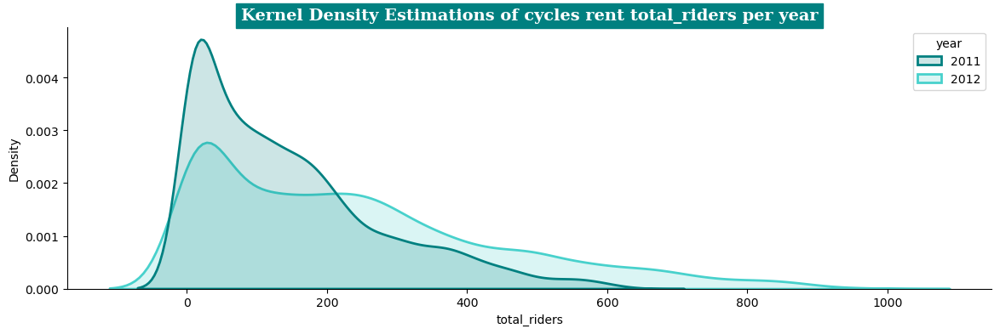

In [169]:
plt.figure(figsize = (14,4))
sns.kdeplot(data=yd, x="total_riders", hue="year", fill=True, common_norm=False,  palette=cp, alpha=.2, linewidth=2)
plt.title("Kernel Density Estimations of cycles rent total_riders per year",fontsize = 14,fontfamily='serif',fontweight='bold'
              ,backgroundcolor=cp[i],color='w')
sns.despine()
plt.show()

In [21]:
df_num_cols = yd.select_dtypes(include=np.number)
df_num_cols.columns

Index(['temp', 'atemp', 'humidity', 'windspeed', 'casual', 'registered',
       'total_riders', 'year', 'hour'],
      dtype='object')

### 🔳🔍Outlier detection:

#### IQR:

In [22]:
numeric_cols = num_cols.columns.to_list()
numeric_cols

['temp',
 'atemp',
 'humidity',
 'windspeed',
 'casual',
 'registered',
 'total_riders']


Outlier detection of temp
..............................
Minimum: 0.82
Maximum: 41.0
Initial Range (with outlier) : 40.18
Q1: 13.94
Q2: 20.5
Q3: 26.24
IQR: 12.299999999999999
Final Range (without outlier) : 49.199999999999996
Lower outliers are: []
Upper outliers are: []
Lower Outlier Percentage is 0.0%
Upper Outlier Percentage is 0.0%
Overall Outlier Percentage is 0.0%
unique Outlier points towards left of boxplot : 0
unique Outlier points towards right of boxplot : 0



,Statistic,Value
0,count,10886.00000
1,mean,20.23086
2,std,7.79159
3,min,0.82000
4,25%,13.94000
5,50%,20.50000
6,75%,26.24000
7,max,41.00000


-------------------------------------------------------------------------------------------------------------------------------

Outlier detection of atemp
..............................
Minimum: 0.76
Maximum: 45.455
Initial Range (with outlier) : 44.695
Q1: 16.665
Q2: 24.24
Q3: 31.06
IQR: 14.395
Final Range (without outlier) : 57.580000000000005
Lower outliers are: []
Upper outliers are: []
Lower Outlier Percentage is 0.0%
Upper Outlier Percentage is 0.0%
Overall Outlier Percentage is 0.0%
unique Outlier points towards left of boxplot : 0
unique Outlier points towards right of boxplot : 0



,Statistic,Value
0,count,10886.000000
1,mean,23.655084
2,std,8.474601
3,min,0.760000
4,25%,16.665000
5,50%,24.240000
6,75%,31.060000
7,max,45.455000


-------------------------------------------------------------------------------------------------------------------------------

Outlier detection of humidity
..............................
Minimum: 0
Maximum: 100
Initial Range (with outlier) : 100
Q1: 47.0
Q2: 62.0
Q3: 77.0
IQR: 30.0
Final Range (without outlier) : 120.0
Lower outliers are: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Upper outliers are: []
Lower Outlier Percentage is 0.2%
Upper Outlier Percentage is 0.0%
Overall Outlier Percentage is 0.2%
unique Outlier points towards left of boxplot : 1 and they are {0}
unique Outlier points towards right of boxplot : 0



,Statistic,Value
0,count,10886.000000
1,mean,61.886460
2,std,19.245033
3,min,0.000000
4,25%,47.000000
5,50%,62.000000
6,75%,77.000000
7,max,100.000000


-------------------------------------------------------------------------------------------------------------------------------

Outlier detection of windspeed
..............................
Minimum: 0.0
Maximum: 56.9969
Initial Range (with outlier) : 56.9969
Q1: 7.0015
Q2: 12.998
Q3: 16.9979
IQR: 9.996400000000001
Final Range (without outlier) : 39.985600000000005
Lower outliers are: []
Upper outliers are: [32.9975, 36.9974, 35.0008, 35.0008, 39.0007, 35.0008, 35.0008, 36.9974, 32.9975, 36.9974, 35.0008, 32.9975, 32.9975, 36.9974, 32.9975, 35.0008, 39.0007, 35.0008, 32.9975, 43.9989, 40.9973, 40.9973, 32.9975, 35.0008, 43.9989, 32.9975, 51.9987, 46.0022, 35.0008, 39.0007, 32.9975, 32.9975, 35.0008, 39.0007, 43.9989, 39.0007, 39.0007, 32.9975, 40.9973, 43.9989, 50.0021, 43.0006, 40.9973, 35.0008, 36.9974, 32.9975, 32.9975, 35.0008, 36.9974, 35.0008, 32.9975, 32.9975, 40.9973, 39.0007, 35.0008, 39.0007, 32.9975, 32.9975, 32.9975, 32.9975, 32.9975, 36.9974, 35.0008, 40.9973, 32.9975, 36.

,Statistic,Value
0,count,10886.000000
1,mean,12.799395
2,std,8.164537
3,min,0.000000
4,25%,7.001500
5,50%,12.998000
6,75%,16.997900
7,max,56.996900


-------------------------------------------------------------------------------------------------------------------------------

Outlier detection of casual
..............................
Minimum: 0
Maximum: 367
Initial Range (with outlier) : 367
Q1: 4.0
Q2: 17.0
Q3: 49.0
IQR: 45.0
Final Range (without outlier) : 180.0
Lower outliers are: []
Upper outliers are: [144, 149, 124, 126, 174, 168, 170, 175, 138, 139, 166, 219, 240, 174, 147, 148, 128, 121, 148, 156, 135, 119, 167, 181, 170, 179, 161, 143, 123, 132, 129, 196, 143, 148, 119, 138, 142, 139, 166, 126, 128, 122, 120, 120, 195, 183, 206, 158, 137, 120, 150, 188, 193, 180, 168, 142, 127, 121, 123, 154, 161, 161, 138, 126, 124, 150, 148, 142, 169, 147, 131, 120, 131, 176, 142, 134, 162, 135, 138, 153, 193, 210, 118, 141, 141, 149, 124, 146, 121, 159, 144, 142, 178, 177, 168, 206, 179, 193, 156, 136, 131, 215, 198, 248, 225, 194, 195, 181, 142, 166, 177, 237, 242, 235, 224, 236, 240, 222, 170, 195, 195, 145, 167, 158, 182, 171, 160, 

,Statistic,Value
0,count,10886.000000
1,mean,36.021955
2,std,49.960477
3,min,0.000000
4,25%,4.000000
5,50%,17.000000
6,75%,49.000000
7,max,367.000000


-------------------------------------------------------------------------------------------------------------------------------

Outlier detection of registered
..............................
Minimum: 0
Maximum: 886
Initial Range (with outlier) : 886
Q1: 36.0
Q2: 118.0
Q3: 222.0
IQR: 186.0
Final Range (without outlier) : 744.0
Lower outliers are: []
Upper outliers are: [539, 532, 540, 521, 516, 529, 510, 555, 527, 517, 517, 514, 513, 525, 516, 506, 567, 515, 515, 507, 512, 503, 530, 525, 536, 505, 534, 540, 553, 512, 523, 505, 508, 514, 522, 508, 510, 504, 508, 516, 579, 551, 533, 554, 554, 509, 573, 545, 545, 547, 557, 623, 571, 614, 638, 628, 642, 647, 602, 634, 648, 534, 563, 615, 681, 553, 601, 543, 577, 634, 661, 653, 645, 646, 610, 677, 618, 595, 565, 586, 670, 656, 626, 581, 527, 546, 604, 596, 547, 539, 621, 564, 549, 601, 589, 631, 673, 670, 551, 651, 663, 677, 516, 538, 616, 662, 640, 659, 770, 608, 617, 642, 584, 547, 564, 608, 667, 602, 605, 640, 641, 594, 629, 603, 648, 66

,Statistic,Value
0,count,10886.000000
1,mean,155.552177
2,std,151.039033
3,min,0.000000
4,25%,36.000000
5,50%,118.000000
6,75%,222.000000
7,max,886.000000


-------------------------------------------------------------------------------------------------------------------------------

Outlier detection of total_riders
..............................
Minimum: 1
Maximum: 977
Initial Range (with outlier) : 976
Q1: 42.0
Q2: 145.0
Q3: 284.0
IQR: 242.0
Final Range (without outlier) : 968.0
Lower outliers are: []
Upper outliers are: [712, 676, 734, 662, 782, 749, 713, 746, 651, 686, 690, 679, 685, 648, 721, 801, 729, 757, 800, 684, 744, 759, 822, 698, 655, 692, 744, 704, 656, 738, 671, 678, 678, 660, 658, 681, 712, 676, 673, 781, 775, 677, 748, 776, 681, 743, 666, 729, 813, 704, 706, 769, 680, 717, 710, 705, 732, 770, 779, 659, 678, 733, 650, 873, 846, 852, 868, 745, 812, 669, 704, 730, 672, 694, 668, 679, 702, 684, 686, 678, 662, 665, 834, 822, 710, 850, 790, 668, 724, 782, 681, 869, 813, 700, 793, 723, 651, 800, 831, 681, 653, 713, 857, 744, 671, 719, 867, 823, 653, 823, 693, 723, 673, 811, 795, 747, 730, 722, 689, 849, 872, 649, 872, 819, 674, 

,Statistic,Value
0,count,10886.000000
1,mean,191.574132
2,std,181.144454
3,min,1.000000
4,25%,42.000000
5,50%,145.000000
6,75%,284.000000
7,max,977.000000


-------------------------------------------------------------------------------------------------------------------------------


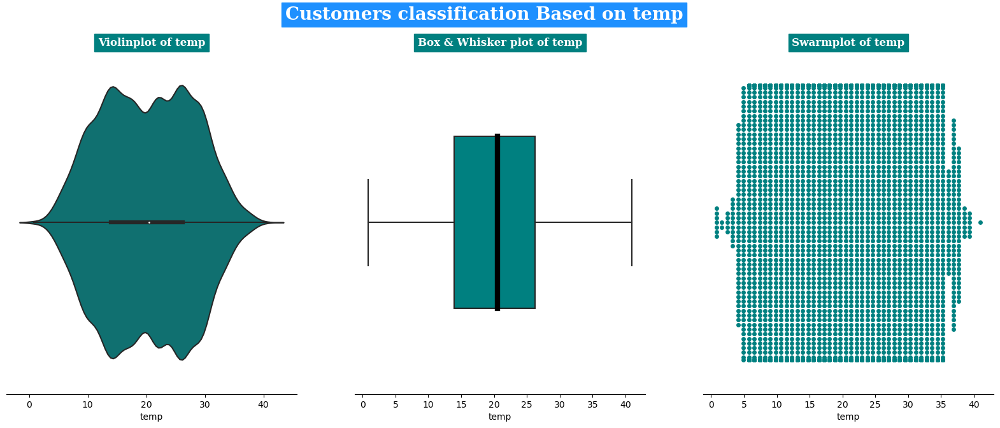

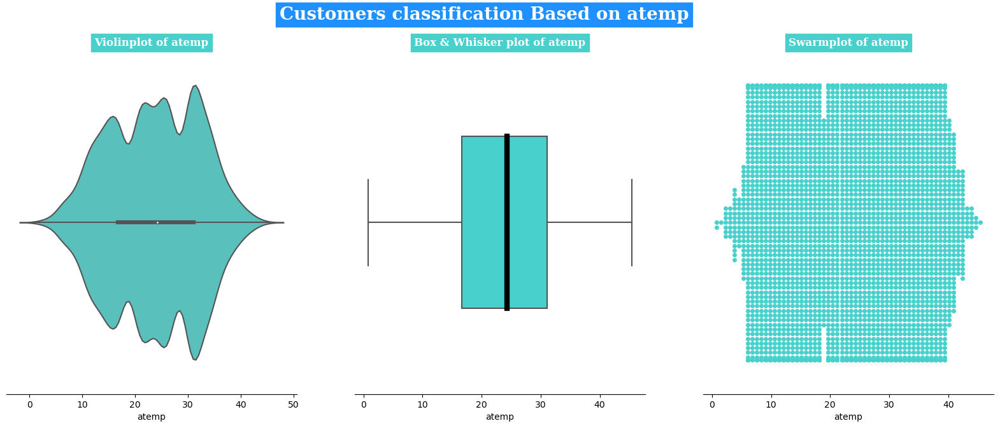

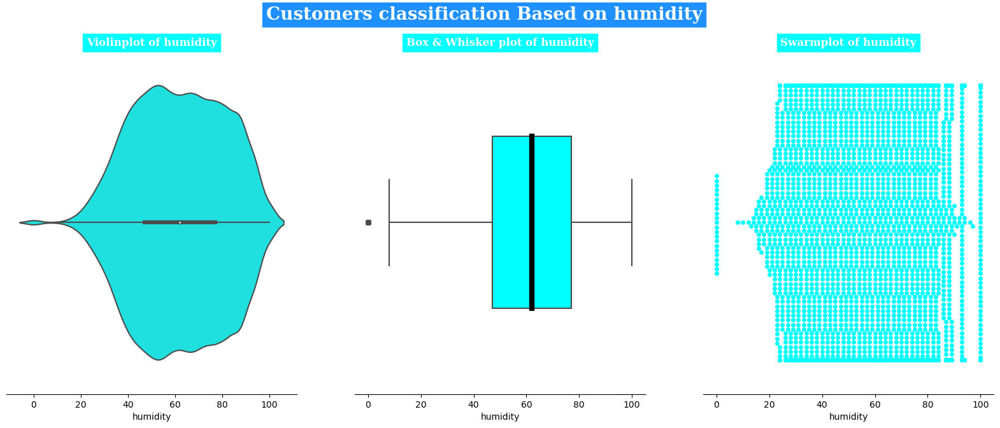

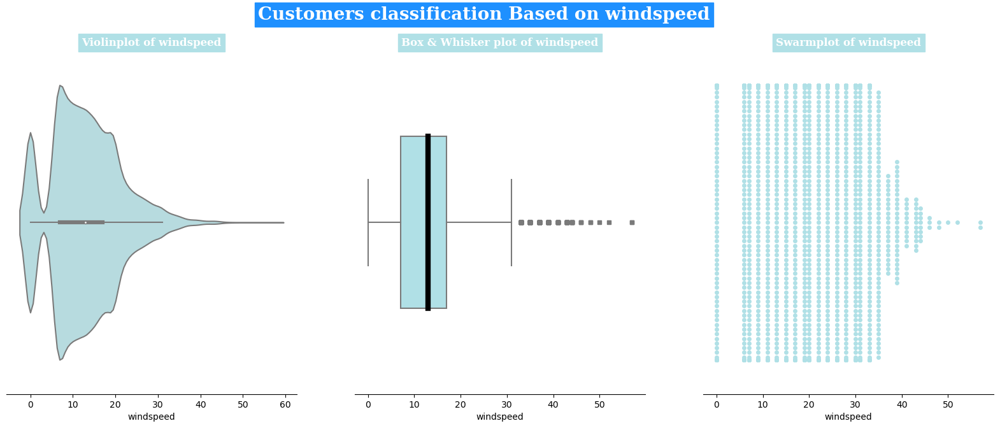

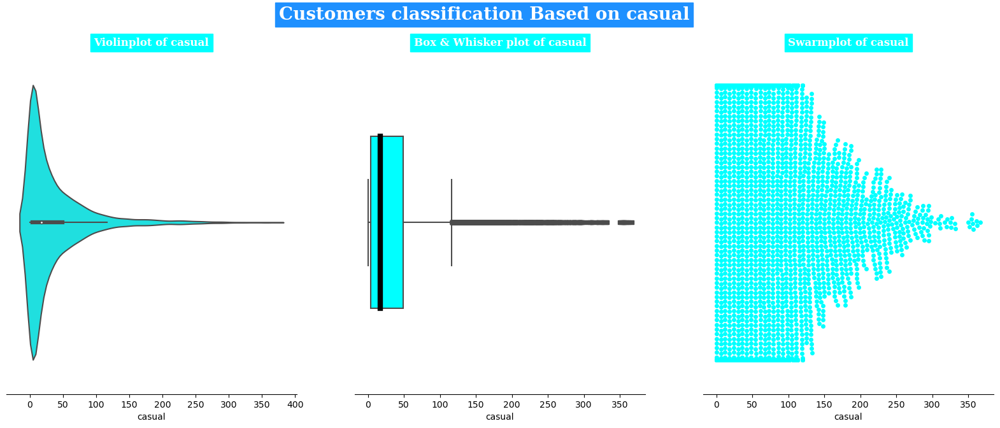

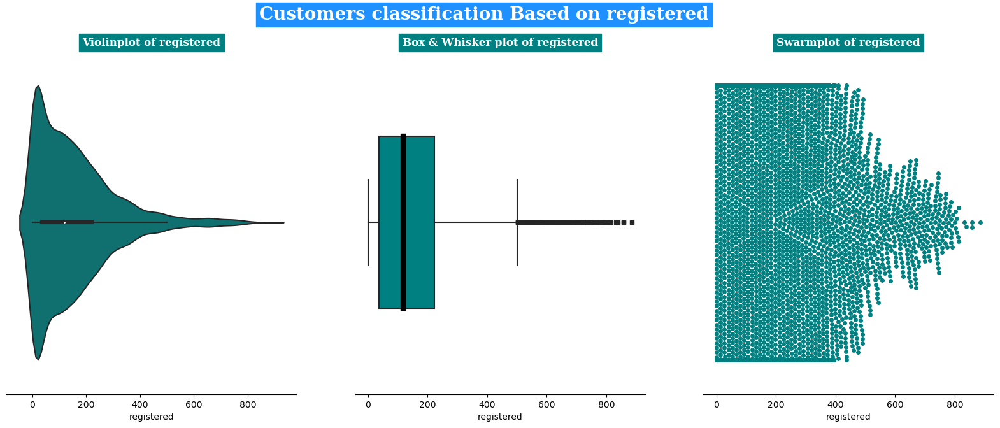

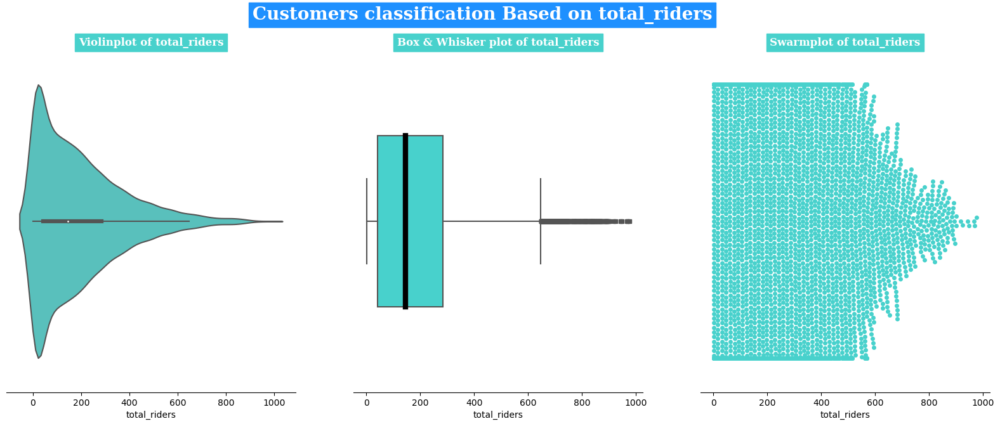

In [70]:
for i in range(len(numeric_cols)):
    data = yd[numeric_cols[i]].tolist()
    mini = np.min(data)
    Q1 = np.percentile(data, 25)
    Q2 = np.median(data)
    Q3 = np.percentile(data, 75)
    maxi = np.max(data)
    IQR = Q3 - Q1

    lo = Q1 - (1.5 * IQR)
    ho = Q3 + (1.5 * IQR)

    lower_outliers=[]
    upper_outliers=[]
    for k in data:
        if k < lo:
            lower_outliers.append(k)
            
        elif k > ho:
            upper_outliers.append(k)
            
    uo_pct = round((len(upper_outliers)*100/yd.shape[0]),2)
    lo_pct = round((len(lower_outliers)*100/yd.shape[0]),2)
    
    print()
    print(f"Outlier detection of {numeric_cols[i]}")
    print('.'*30)
    print("Minimum:", mini)
    print("Maximum:", maxi)
    print(f'Initial Range (with outlier) : {(maxi-mini)}')
    print("Q1:", Q1)
    print("Q2:", Q2)
    print("Q3:", Q3)
    print("IQR:",IQR)
    print(f'Final Range (without outlier) : {(ho-lo)}')
    print("Lower outliers are:", lower_outliers)
    print("Upper outliers are:", upper_outliers)
    print(f'Lower Outlier Percentage is {lo_pct}%')
    print(f'Upper Outlier Percentage is {uo_pct}%')
    print(f'Overall Outlier Percentage is {(lo_pct+uo_pct)}%')
      
    if len(set(lower_outliers)):
        print(f'unique Outlier points towards left of boxplot : {len(set(lower_outliers))} and they are {(set(lower_outliers))}')
    else:
        print(f'unique Outlier points towards left of boxplot : {len(set(lower_outliers))}')
    if len(set(upper_outliers)):
        print(f'unique Outlier points towards right of boxplot : {len(set(upper_outliers))} and they are {(set(upper_outliers))}')
    else:
        print(f'unique Outlier points towards right of boxplot : {len(set(upper_outliers))}')
    print()
    
    
    
    plt.figure(figsize=(20,7))
    plt.style.use('default')
    plt.style.use('seaborn-v0_8-bright')
    plt.suptitle(f'Customers classification Based on {numeric_cols[i]}',fontfamily='serif',fontweight='bold',fontsize=20,
              backgroundcolor='dodgerblue',color='w')

    plt.subplot(131)
    sns.violinplot(yd,x=yd[numeric_cols[i]],color=cp[i])
    plt.title(f'Violinplot of {numeric_cols[i]}',fontfamily='serif',fontweight='bold',fontsize=12,
              loc='center',backgroundcolor=cp[i],color='w')
    plt.yticks([])

    plt.subplot(132)
    bxp = sns.boxplot(yd,x=yd[numeric_cols[i]],color=cp[i],width=0.5,saturation=97,flierprops={"marker":"s"},
                      medianprops={"color": "k", "linewidth": 6})#,boxprops={"facecolor": (.3, .5, .7, .5)})
    plt.title(f'Box & Whisker plot of {numeric_cols[i]}',fontfamily='serif',fontweight='bold',fontsize=12,
              loc='center',backgroundcolor=cp[i],color='w')
    sns.despine(left=True)
    plt.yticks([])
    
    plt.subplot(133)
    sns.swarmplot(yd,x=yd[numeric_cols[i]],color=cp[i])
    plt.title(f'Swarmplot of {numeric_cols[i]}',fontfamily='serif',fontweight='bold',fontsize=12,
              loc='center',backgroundcolor=cp[i],color='w')
    sns.despine(left=True)
    plt.yticks([])
    
    tabular_data = yd[numeric_cols[i]].describe().reset_index()
    tabular_data.columns = ['Statistic', 'Value']
    display(tabular_data)
    
    print('-'*127)

### Method-2

In [76]:
df_num_cols

,temp,atemp,humidity,windspeed,casual,registered,total_riders,year,hour
0,9.84,14.395,81,0.0000,3,13,16,2011,0
1,9.02,13.635,80,0.0000,8,32,40,2011,1
2,9.02,13.635,80,0.0000,5,27,32,2011,2
3,9.84,14.395,75,0.0000,3,10,13,2011,3
4,9.84,14.395,75,0.0000,0,1,1,2011,4
...,...,...,...,...,...,...,...,...,...
10881,15.58,19.695,50,26.0027,7,329,336,2012,19
10882,14.76,17.425,57,15.0013,10,231,241,2012,20
10883,13.94,15.910,61,15.0013,4,164,168,2012,21
10884,13.94,17.425,61,6.0032,12,117,129,2012,22


In [72]:
# obtain the first quartile
Q1 = df_num_cols.quantile(0.25)

# obtain the third quartile
Q3 = df_num_cols.quantile(0.75)

# obtain the IQR
IQR = Q3 - Q1

# print the IQR
print(IQR)

temp             12.3000
atemp            14.3950
humidity         30.0000
windspeed         9.9964
casual           45.0000
registered      186.0000
total_riders    242.0000
year              1.0000
hour             12.0000
dtype: float64


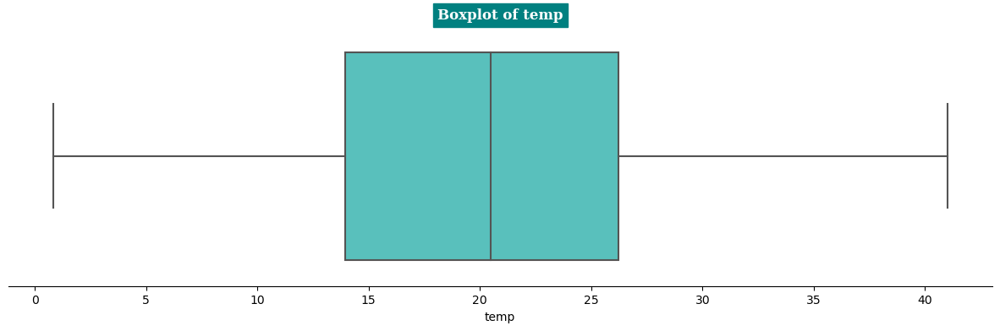

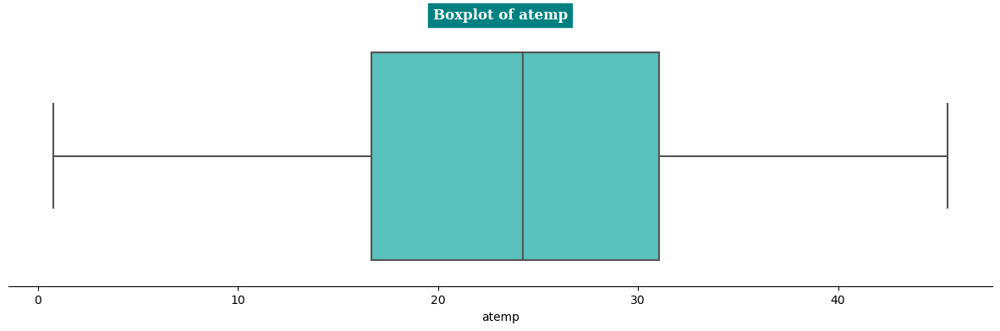

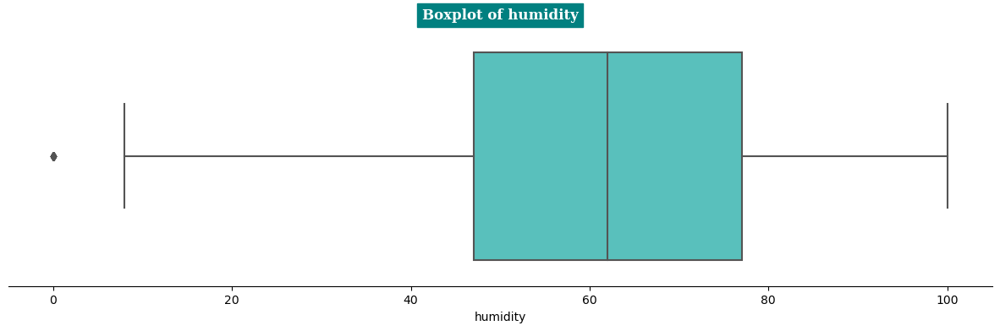

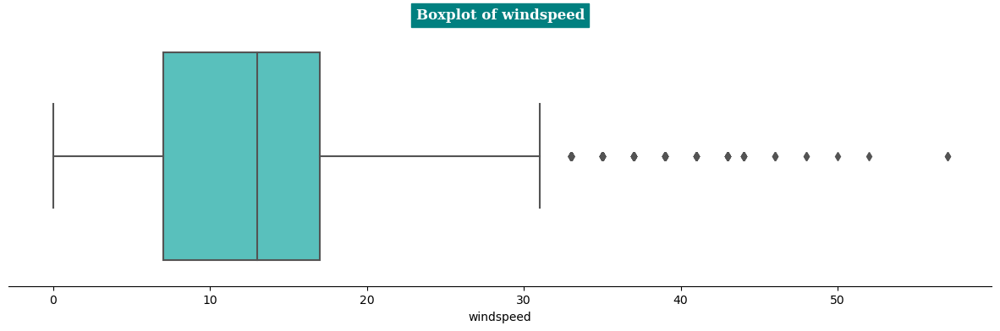

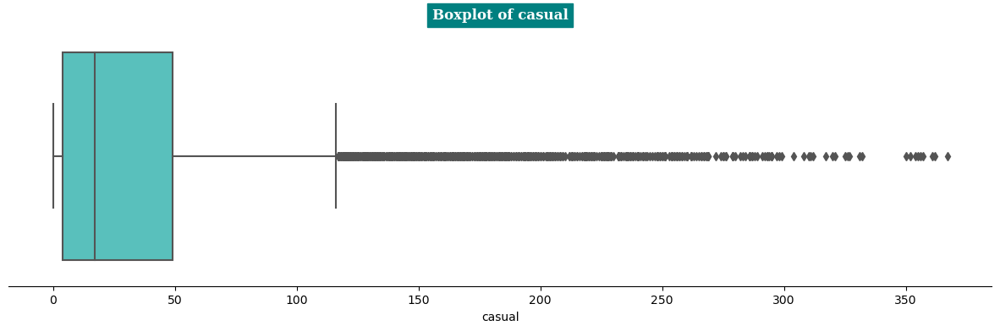

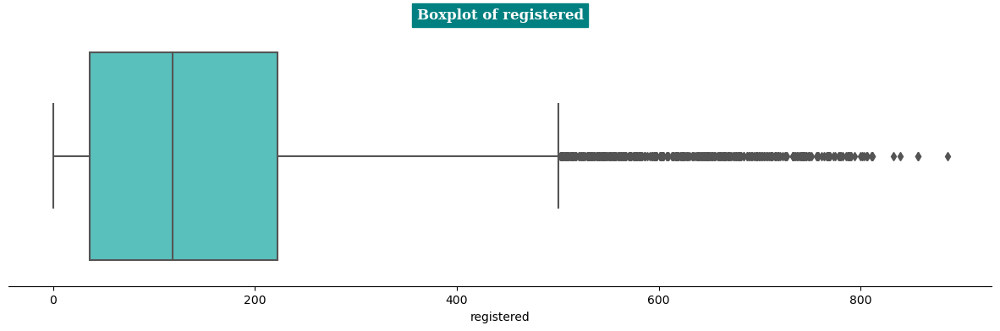

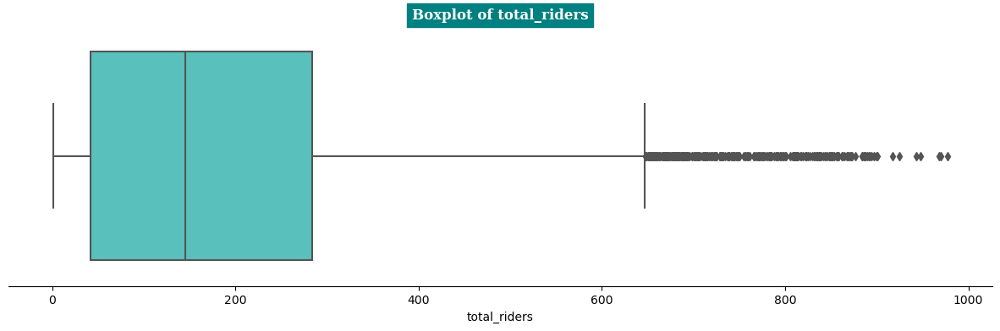

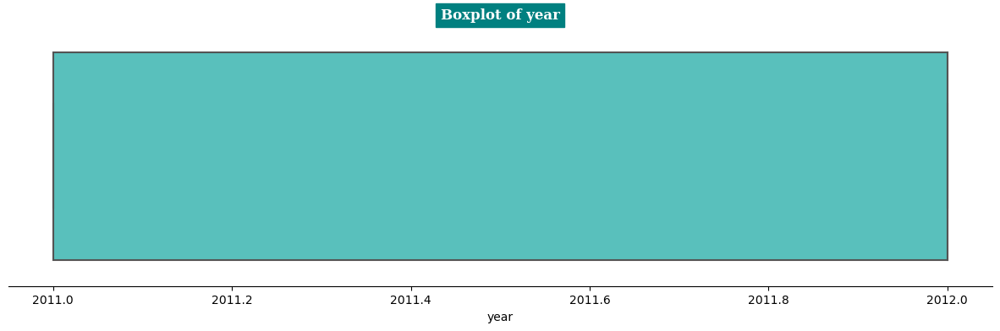

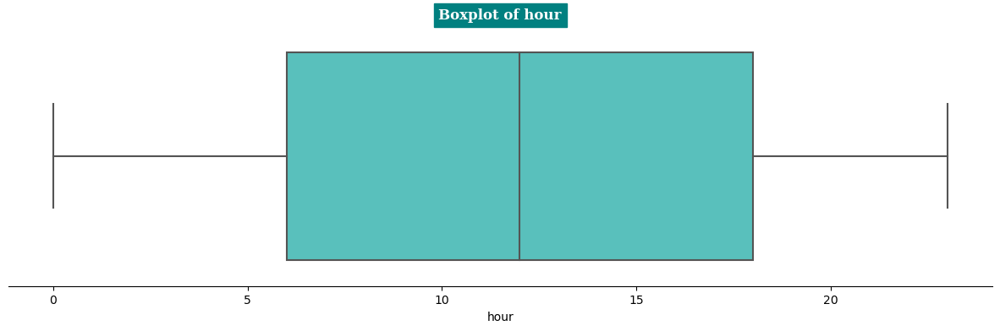

In [81]:
for col in enumerate(df_num_cols):
    plt.figure(figsize=(15,4))
    sns.boxplot(x=col[1], data=df_num_cols,color=cp[1])
    sns.despine(left=True)
    plt.yticks([])
    plt.title(f'Boxplot of {col[1]}',fontfamily='serif',fontweight='bold',fontsize=12,backgroundcolor=cp[0],color='w')
    plt.show()

In [82]:
df_iqr=df_num_cols[~((df_num_cols< (Q1-1.5*IQR))|(df_num_cols > (Q3 + 1.5*IQR))).any(axis=1)]
df_iqr

,temp,atemp,humidity,windspeed,casual,registered,total_riders,year,hour
0,9.84,14.395,81,0.0000,3,13,16,2011,0
1,9.02,13.635,80,0.0000,8,32,40,2011,1
2,9.02,13.635,80,0.0000,5,27,32,2011,2
3,9.84,14.395,75,0.0000,3,10,13,2011,3
4,9.84,14.395,75,0.0000,0,1,1,2011,4
...,...,...,...,...,...,...,...,...,...
10881,15.58,19.695,50,26.0027,7,329,336,2012,19
10882,14.76,17.425,57,15.0013,10,231,241,2012,20
10883,13.94,15.910,61,15.0013,4,164,168,2012,21
10884,13.94,17.425,61,6.0032,12,117,129,2012,22


### ❇️Outlier Removal 

In [140]:
data = yd['total_riders']
display(data.to_frame())
Q1 = np.percentile(data, 25)
Q3 = np.percentile(data, 75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

clipped_data = np.clip(data, lower_bound, upper_bound)
display(filtered_data.to_frame())

filtered_data = data[(data >= lower_bound) & (data <= upper_bound)]
display(filtered_data.to_frame())

# print("Original data:", data)
# print("Clipped data:", clipped_data)


,total_riders
0,16
1,40
2,32
3,13
4,1
...,...
10881,336
10882,241
10883,168
10884,129


,total_riders
0,16
1,40
2,32
3,13
4,1
...,...
10881,336
10882,241
10883,168
10884,129


,total_riders
0,16
1,40
2,32
3,13
4,1
...,...
10881,336
10882,241
10883,168
10884,129


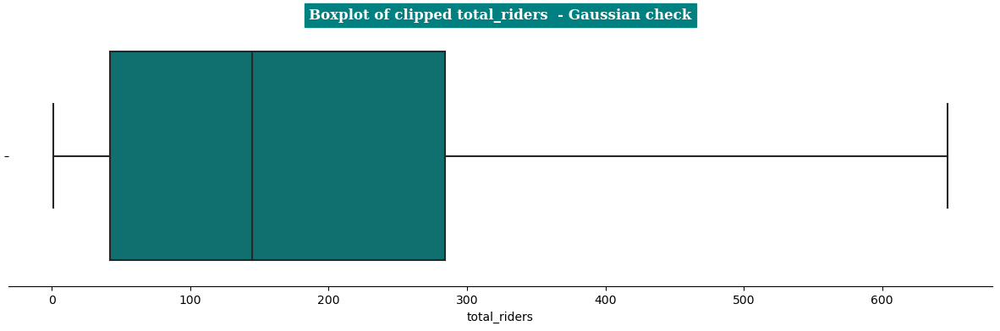

In [146]:
plt.figure(figsize=(15,4))
sns.boxplot(x=clipped_data,color='teal')
sns.despine(left=True)
plt.title(f'Boxplot of clipped total_riders  - Gaussian check',fontfamily='serif',
          fontweight='bold',fontsize=12,backgroundcolor=cp[0],color='w')
plt.show()

### ⚡Zscore Method of outlier detection - used only if data is gaussian

In [23]:
odz_cols = df_num_cols.iloc[:,4:7]
odz_cols

,casual,registered,total_riders
0,3,13,16
1,8,32,40
2,5,27,32
3,3,10,13
4,0,1,1
...,...,...,...
10881,7,329,336
10882,10,231,241
10883,4,164,168
10884,12,117,129


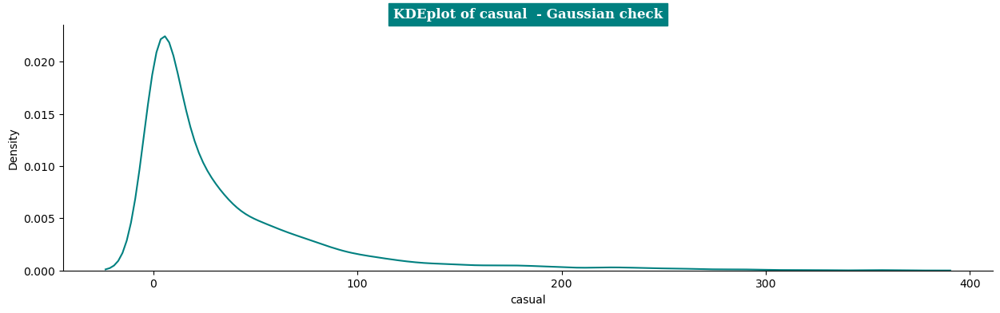

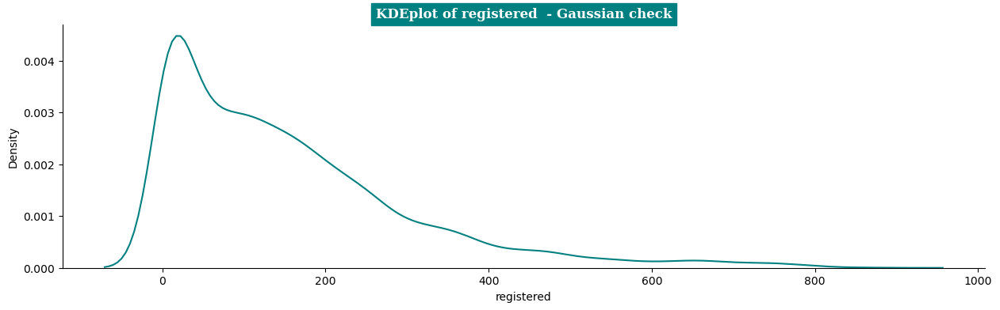

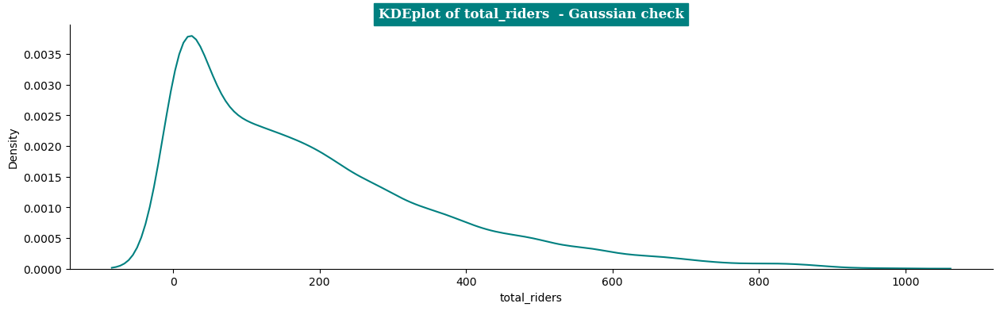

In [121]:
for k in enumerate(odz_cols):
    
    plt.figure(figsize=(15,4))
    sns.kdeplot(odz_cols,x=k[1],color='teal')
    sns.despine()
    plt.title(f'KDEplot of {k[1]}  - Gaussian check',fontfamily='serif',fontweight='bold',fontsize=12,backgroundcolor=cp[0],color='w')
    plt.show()

#### Since right skewed we will take boxcox transformation and then try to find out the outliers

Best lambda of casual = 0.2459054880137843


array([1.26176369, 2.71480556, 1.97474279, ..., 1.65224204, 3.42573339,
       1.65224204])

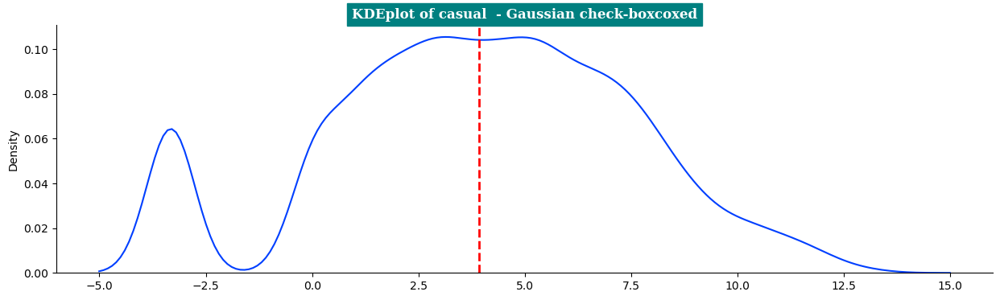

Best lambda of registered = 0.3134521077514775


array([ 3.93836793,  6.26393537,  5.77363717, ..., 12.58863393,
       11.00379794,  9.60352783])

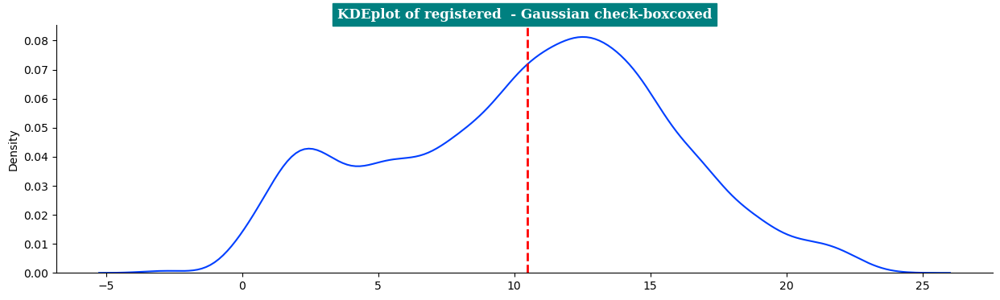

Best lambda of total_riders = 0.3156576641683747


array([ 4.43320701,  6.98256169,  6.29220566, ..., 12.79890375,
       11.52156273,  9.85096458])

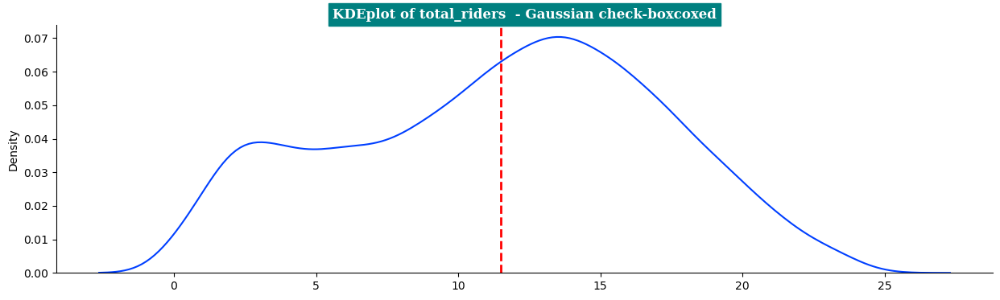

In [101]:
for k in odz_cols:
    transformed_data , best_lambda = boxcox(odz_cols[k]+0.001)
    print(f"Best lambda of {k} = {best_lambda}")
    display(transformed_data)
    plt.figure(figsize=(15,4))
    sns.kdeplot(transformed_data)
    sns.despine()
    plt.axvline(transformed_data.mean(), color='r', linestyle='--',linewidth=2)
    plt.title(f'KDEplot of {k}  - Gaussian check-boxcoxed',fontfamily='serif',fontweight='bold',fontsize=12,backgroundcolor=cp[0],color='w')
    plt.show()
    

#### ***Because of the presence of zero values we could use a boxcox transformation here with small value addition....***
#### ***We can also use standardisation or normalisation from scikit preprocessing. Let's try standard scale or minmax scaler.***

In [133]:
for k in odz_cols:
    print(f" The minimum value of {k}:",odz_cols[k].min(),"\n",
      "The maximum value of {k}:", odz_cols[k].max())

 The minimum value of casual: 0 
 The maximum value of {k}: 367
 The minimum value of registered: 0 
 The maximum value of {k}: 886
 The minimum value of total_riders: 1 
 The maximum value of {k}: 977


0       -0.660992
1       -0.560908
2       -0.620958
3       -0.660992
4       -0.721042
           ...   
10881   -0.580925
10882   -0.520875
10883   -0.640975
10884   -0.480841
10885   -0.640975
Name: casual, Length: 10886, dtype: float64

,casual
0,3
1,8
2,5
3,3
4,0
...,...
10881,7
10882,10
10883,4
10884,12


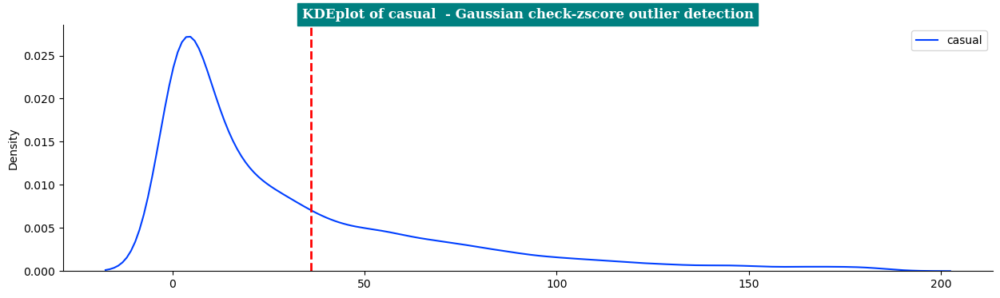

0       -0.943854
1       -0.818052
2       -0.851158
3       -0.963717
4       -1.023307
           ...   
10881    1.148417
10882    0.499548
10883    0.055934
10884   -0.255258
10885   -0.473755
Name: registered, Length: 10886, dtype: float64

,registered
0,13
1,32
2,27
3,10
4,1
...,...
10881,329
10882,231
10883,164
10884,117


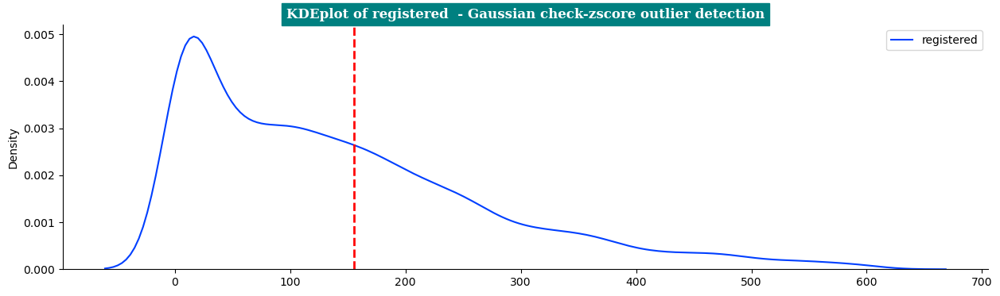

0       -0.969294
1       -0.836797
2       -0.880962
3       -0.985856
4       -1.052104
           ...   
10881    0.797333
10882    0.272866
10883   -0.130146
10884   -0.345454
10885   -0.571803
Name: total_riders, Length: 10886, dtype: float64

,total_riders
0,16
1,40
2,32
3,13
4,1
...,...
10881,336
10882,241
10883,168
10884,129


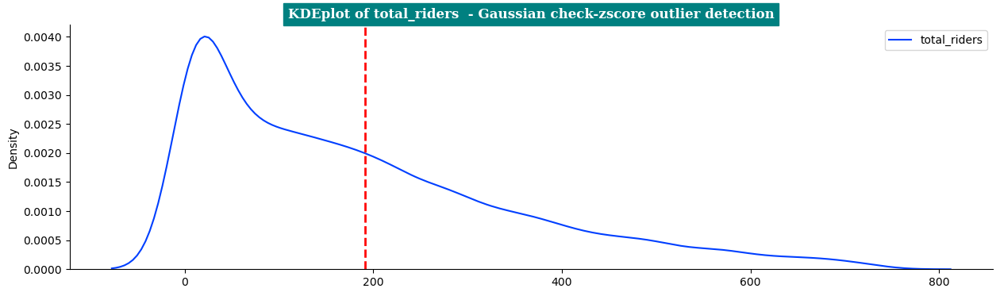

In [100]:
for k in odz_cols:
    z_val = zscore(odz_cols[k])
    display(z_val)
    df_zscore = odz_cols[k][~((z_val < -3) | (z_val > 3))].to_frame()
    display(df_zscore)
    plt.figure(figsize=(15,4))
    sns.kdeplot(data=df_zscore,color='teal')
    sns.despine()
    plt.axvline(odz_cols[k].mean(), color='r', linestyle='--',linewidth=2)
    plt.title(f'KDEplot of {k}  - Gaussian check-zscore outlier detection',fontfamily='serif',fontweight='bold'
              ,fontsize=12,backgroundcolor=cp[0],color='w')
    plt.show()

In [86]:
new_df = odz_cols.copy()

In [135]:
for k in new_df:
    standard_scale = StandardScaler()
    new_df[k] = standard_scale.fit_transform(new_df[[k]])
    print(" The minimum value of {k}:",new_df[k].min(),"\n",
          "The maximum value of {k}:", new_df[k].max())

 The minimum value of {k}: -0.7210421496731394 
 The maximum value of {k}: 6.625101899627329
 The minimum value of {k}: -1.0299279532173793 
 The maximum value of {k}: 4.836374811004244
 The minimum value of {k}: -1.0521044484722468 
 The maximum value of {k}: 4.3361081667641255


In [139]:
for k in new_df:
    minmax_scale = MinMaxScaler()
    new_df[k] = minmax_scale.fit_transform(new_df[[k]])
    print(" The minimum value of {k}:",new_df[k].min(),"\n",
          "The maximum value of {k}:", new_df[k].max())

 The minimum value of {k}: 0.0 
 The maximum value of {k}: 1.0
 The minimum value of {k}: 0.0 
 The maximum value of {k}: 0.9999999999999999
 The minimum value of {k}: 0.0 
 The maximum value of {k}: 1.0


In [140]:
new_df

,casual,registered,total_riders
0,0.008174,0.014673,0.015369
1,0.021798,0.036117,0.039959
2,0.013624,0.030474,0.031762
3,0.008174,0.011287,0.012295
4,0.000000,0.001129,0.000000
...,...,...,...
10881,0.019074,0.371332,0.343238
10882,0.027248,0.260722,0.245902
10883,0.010899,0.185102,0.171107
10884,0.032698,0.132054,0.131148


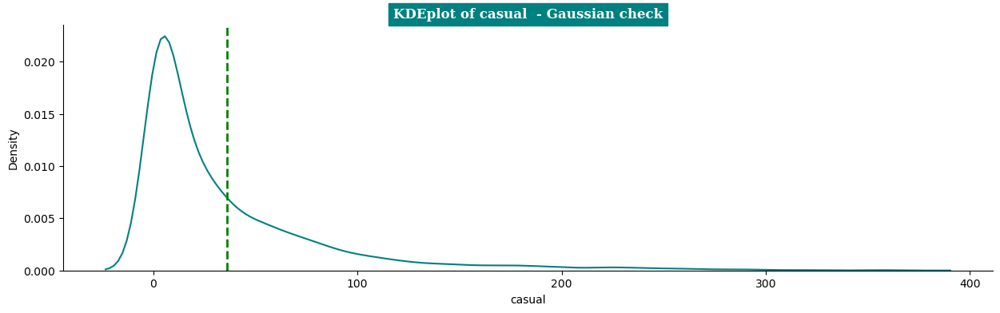

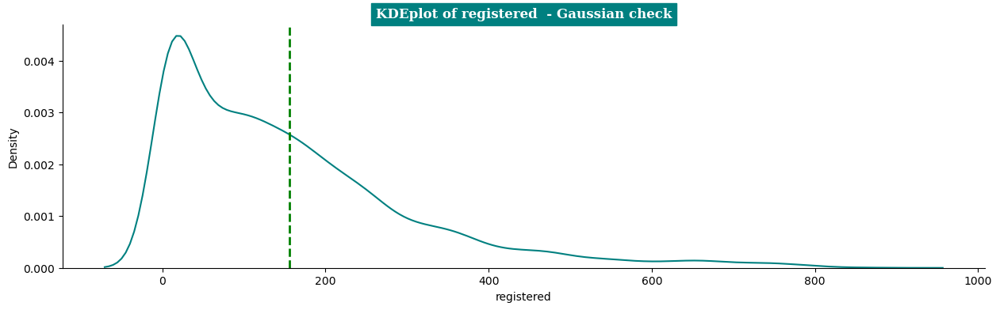

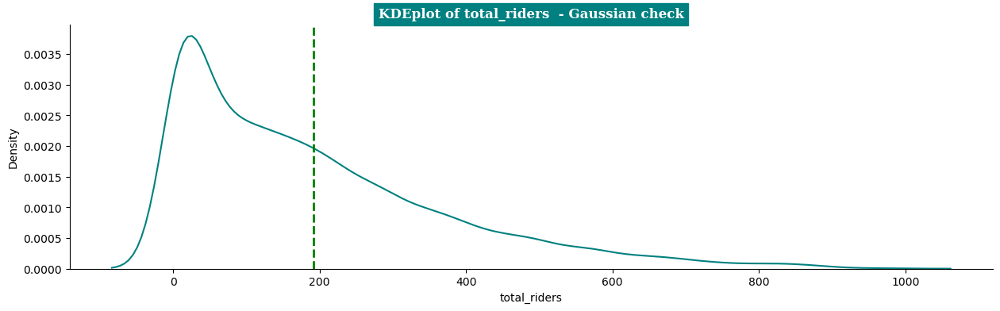

In [96]:
for k in enumerate(new_df):
    
    plt.figure(figsize=(15,4))
    sns.kdeplot(new_df,x=k[1],color='teal')
    plt.axvline(new_df[k[1]].mean(), color='g', linestyle='--',linewidth=2)
    sns.despine()
    plt.title(f'KDEplot of {k[1]}  - Gaussian check',fontfamily='serif',fontweight='bold',fontsize=12,backgroundcolor=cp[0],color='w')
    plt.show()

,casual
0,3
1,8
2,5
3,3
4,0
...,...
10881,7
10882,10
10883,4
10884,12


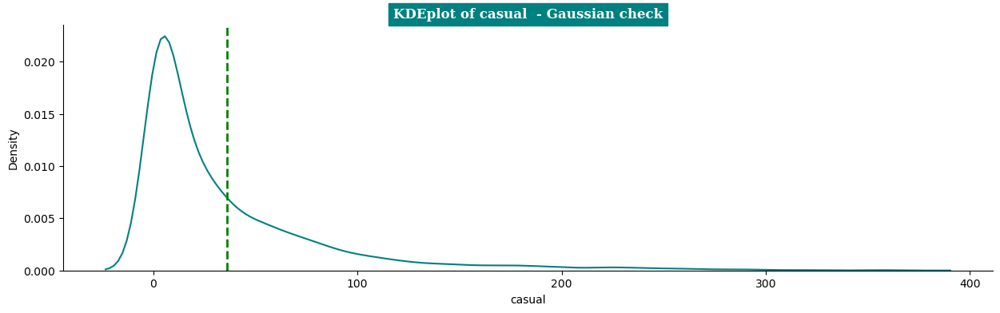

,registered
0,13
1,32
2,27
3,10
4,1
...,...
10881,329
10882,231
10883,164
10884,117


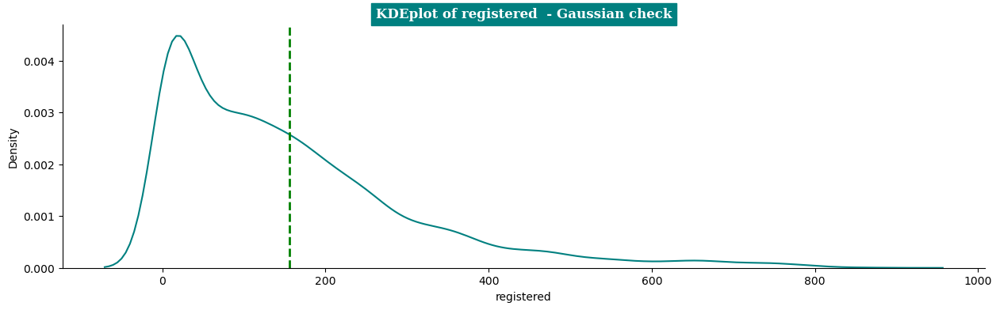

,total_riders
0,16
1,40
2,32
3,13
4,1
...,...
10881,336
10882,241
10883,168
10884,129


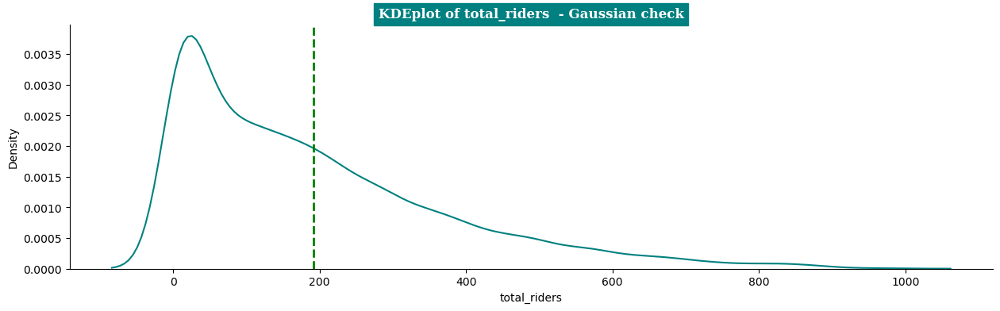

In [99]:
for k in new_df:
    z_val = zscore(new_df[k])
    df_zscore = new_df[k][~((z_val < -3) | (z_val > 3))].to_frame()
    display(df_zscore)
    
    plt.figure(figsize=(15,4))
    sns.kdeplot(new_df,x=k,color='teal')
    sns.despine()
    plt.axvline(new_df[k].mean(), color='g', linestyle='--',linewidth=2)
    plt.title(f'KDEplot of {k}  - Gaussian check',fontfamily='serif',fontweight='bold',fontsize=12,backgroundcolor=cp[0],color='w')
    plt.show()

#### ✴️Understanding:

* Understanding is that standardisation may change the plot as the mean and the variance and standard deviations are changed, But while doing MinMax Scalar we are just scaling the Axis and the plot remains the same. Also, Boxcox transformation gives you only the approximate normally distributed It doesn't mean the data is exactly normally distributed, It also has the impact of outliers. 

* Another observation is that the outliers found in this Z score may or may not be the same as the iqr method. So it is always advisable to use iqr method and clip the data if necessary. Try to do an analysis with the original data and the clipped data and observe the changes.

> Even after bootstrapping the data, the plot is right skewed only ..



----------

### 🤝Testing correlations between the variables:

In [146]:
num_cols

,temp,atemp,humidity,windspeed,casual,registered,total_riders
0,9.84,14.395,81,0.0000,3,13,16
1,9.02,13.635,80,0.0000,8,32,40
2,9.02,13.635,80,0.0000,5,27,32
3,9.84,14.395,75,0.0000,3,10,13
4,9.84,14.395,75,0.0000,0,1,1
...,...,...,...,...,...,...,...
10881,15.58,19.695,50,26.0027,7,329,336
10882,14.76,17.425,57,15.0013,10,231,241
10883,13.94,15.910,61,15.0013,4,164,168
10884,13.94,17.425,61,6.0032,12,117,129


> **Null Hypothesis** ---  Two numeric columns are **independent** of each other.

> **Alternate Hypothesis** --- Two numeric columns are **dependent** on each other.
    
    - The correration coefficient gives the strength of relationship.
    - The range of spearman corrcoef is [-1,1].
    
#### Here's some of the datas are not normally distributed,So in order to capture the nonlinear properties, we will consider these spearman correlation.

In [148]:
for col in num_cols:
    print(f'Testing Correlation between {col} and Total_riders ')
    #np.corrcoef(yd[col].rank(), yd['total_riders'].rank())[0,1]   -- can use this as well
    pearson_coefficient,p_val = pearsonr(yd[col],yd['total_riders'])
    spearman_coefficient,p_val = spearmanr(yd[col],yd['total_riders'])
    pc = pearson_coefficient
    sc = spearman_coefficient
    if sc>0 :
        if sc>0.5:
            print('There is Strong Positive correlation between total_riders and', col,"- pearson-corrcoef: ",np.round(pc,2))
            print('There is Strong Positive correlation between total_riders and', col,"- spearman-corrcoef: ",np.round(sc,2))
        else:    
            print('There is Weak Positive correlation between total_riders and', col,"- pearson-corrcoef: ",np.round(pc,2))
            print('There is weak Positive correlation between total_riders and', col,"- spearman-corrcoef: ",np.round(sc,2))
    if sc == 0:
        print('There is No correlation between total_riders and', col,"- pearson-corrcoef: ",np.round(pc,2))
        print('There is No correlation between total_riders and', col,"- spearman-corrcoef: ",np.round(sc,2))
    if sc< 0:
        if sc<0.5:
            print('There is Strong Negative correlation between total_riders and', col,"- pearson-corrcoef: ",np.round(pc,2))
            print('There is Strong Negative correlation between total_riders and', col,"- spearman-corrcoef: ",np.round(sc,2))
        else:
            print('There is Weak Positive correlation between total_riders and', col,"- pearson-corrcoef: ",np.round(pc,2))
            print('There is weak Positive correlation between total_riders and', col,"- spearman-corrcoef: ",np.round(sc,2))
    print()
    print('-'*100)
    print()

Testing Correlation between temp and Total_riders 
There is Weak Positive correlation between total_riders and temp - pearson-corrcoef:  0.39
There is weak Positive correlation between total_riders and temp - spearman-corrcoef:  0.41

----------------------------------------------------------------------------------------------------

Testing Correlation between atemp and Total_riders 
There is Weak Positive correlation between total_riders and atemp - pearson-corrcoef:  0.39
There is weak Positive correlation between total_riders and atemp - spearman-corrcoef:  0.41

----------------------------------------------------------------------------------------------------

Testing Correlation between humidity and Total_riders 
There is Strong Negative correlation between total_riders and humidity - pearson-corrcoef:  -0.32
There is Strong Negative correlation between total_riders and humidity - spearman-corrcoef:  -0.35

----------------------------------------------------------------------

,temp,atemp,humidity,windspeed,casual,registered,total_riders,year,hour
temp,1.000000,0.984948,-0.064949,-0.017852,0.467097,0.318571,0.394454,0.061226,0.145430
atemp,0.984948,1.000000,-0.043536,-0.057473,0.462067,0.314635,0.389784,0.058540,0.140343
humidity,-0.064949,-0.043536,1.000000,-0.318607,-0.348187,-0.265458,-0.317371,-0.078606,-0.278011
windspeed,-0.017852,-0.057473,-0.318607,1.000000,0.092276,0.091052,0.101369,-0.015221,0.146631
casual,0.467097,0.462067,-0.348187,0.092276,1.000000,0.497250,0.690414,0.145241,0.302045
registered,0.318571,0.314635,-0.265458,0.091052,0.497250,1.000000,0.970948,0.264265,0.380540
total_riders,0.394454,0.389784,-0.317371,0.101369,0.690414,0.970948,1.000000,0.260403,0.400601
year,0.061226,0.058540,-0.078606,-0.015221,0.145241,0.264265,0.260403,1.000000,-0.004234
hour,0.145430,0.140343,-0.278011,0.146631,0.302045,0.380540,0.400601,-0.004234,1.000000


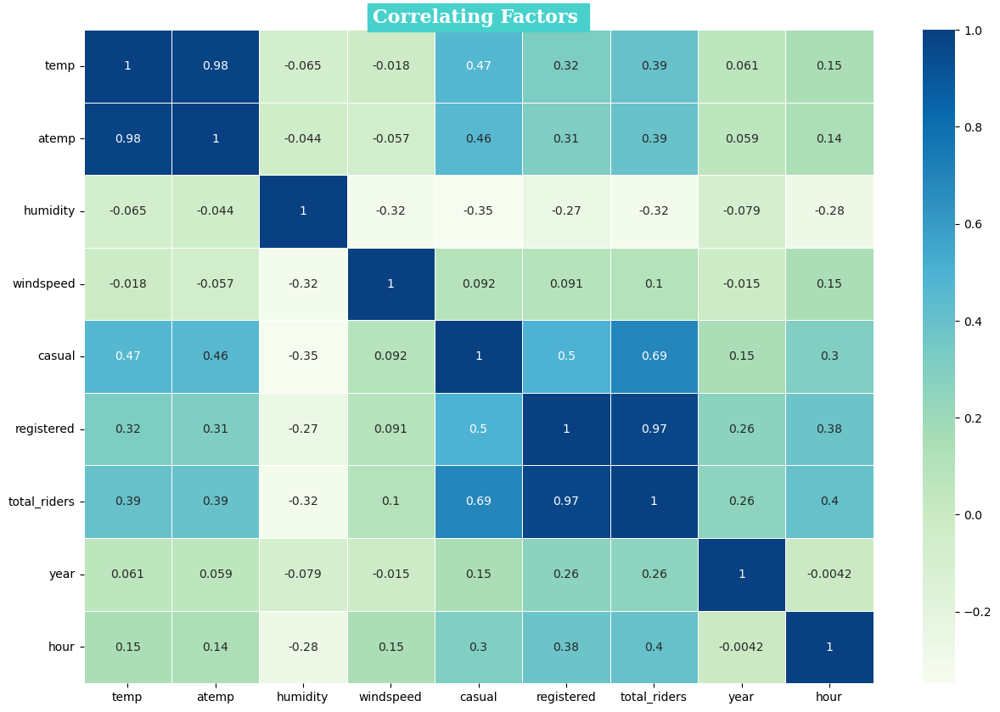

In [183]:
corr_df =  yd.corr(numeric_only=True)
display(corr_df)
plt.figure(figsize=(15,10))
sns.heatmap(yd.corr(numeric_only=True), annot=True, linewidth=.5,cmap='GnBu')
plt.yticks(rotation=0)
plt.title('Correlating Factors ',fontfamily='serif',fontweight='bold',fontsize=16,backgroundcolor=cp[1],color='w')
plt.show()

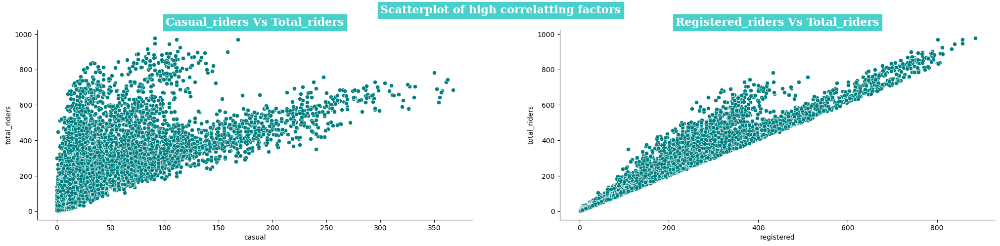

In [196]:
plt.figure(figsize=(25,5))
plt.suptitle('Scatterplot of high correlatting factors',fontfamily='serif',fontweight='bold',
             fontsize=16,backgroundcolor=cp[1],color='w')

plt.subplot(121)
sns.scatterplot(data=yd, x='casual', y='total_riders',color=cp[0])
plt.title('Casual_riders Vs Total_riders',fontfamily='serif',fontweight='bold',fontsize=16,backgroundcolor=cp[1],color='w')

plt.subplot(122)
sns.scatterplot(data=yd, x='registered', y='total_riders',color=cp[0])
plt.title("")
plt.title('Registered_riders Vs Total_riders',fontfamily='serif',fontweight='bold',fontsize=16,backgroundcolor=cp[1],color='w')

sns.despine()
plt.show()

#### 🏷️Insights
* We can conclude that registered users contribute more towards total_riders as there is a high correlation between them.
* We can also see high correlation between temp and atemp features.
* This scatterplot confirms that there is a high correlation between registered customers and total yulu bike riders.

<Figure size 1400x600 with 0 Axes>

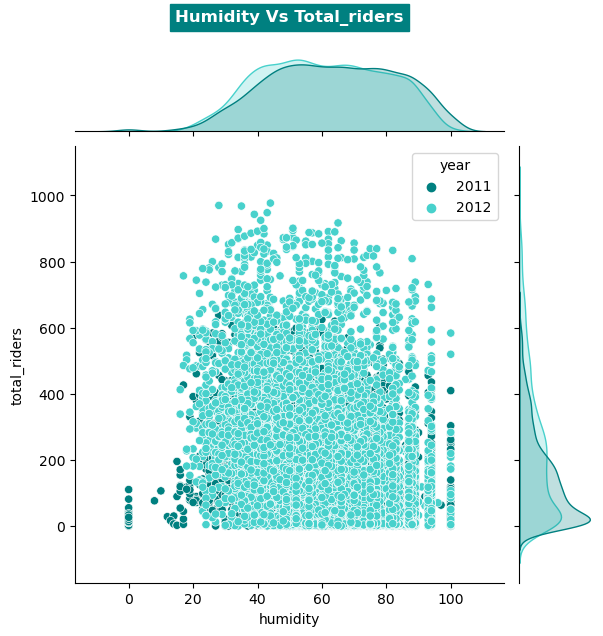

In [173]:
plt.figure(figsize = (14,6))
sns.jointplot(x=yd['humidity'], y=yd['total_riders'],hue=yd['year'],kind="scatter", palette=cp)
plt.title("Humidity Vs Total_riders", loc = "center",pad= 90,fontweight="bold",backgroundcolor='teal',color='w')
plt.show()

<Figure size 1400x600 with 0 Axes>

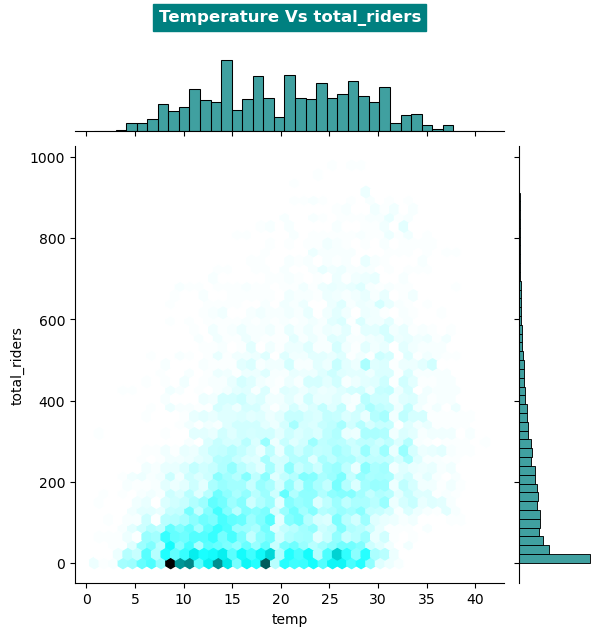

In [177]:
plt.figure(figsize = (14,6))
sns.jointplot(x=yd['temp'], y=yd['total_riders'], kind="hex", color='teal')
plt.title("Temperature Vs total_riders", loc = "center",pad= 90,fontweight="bold",backgroundcolor='teal',color='w')
plt.show()

<Figure size 1400x600 with 0 Axes>

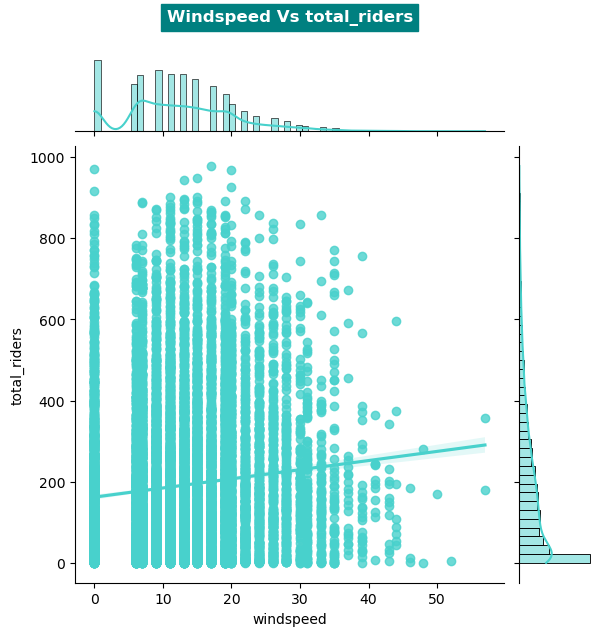

In [180]:
plt.figure(figsize = (14,6))
sns.jointplot(x=yd['windspeed'], y=yd['total_riders'], kind="reg",color=cp[1])
plt.title("Windspeed Vs total_riders", loc = "center",pad= 90,fontweight="bold",backgroundcolor='teal',color='w')
plt.show()

In [184]:
cat_cols

['season', 'holiday', 'workingday', 'weather']

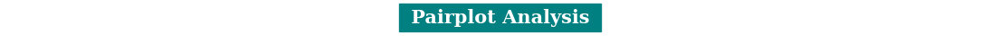

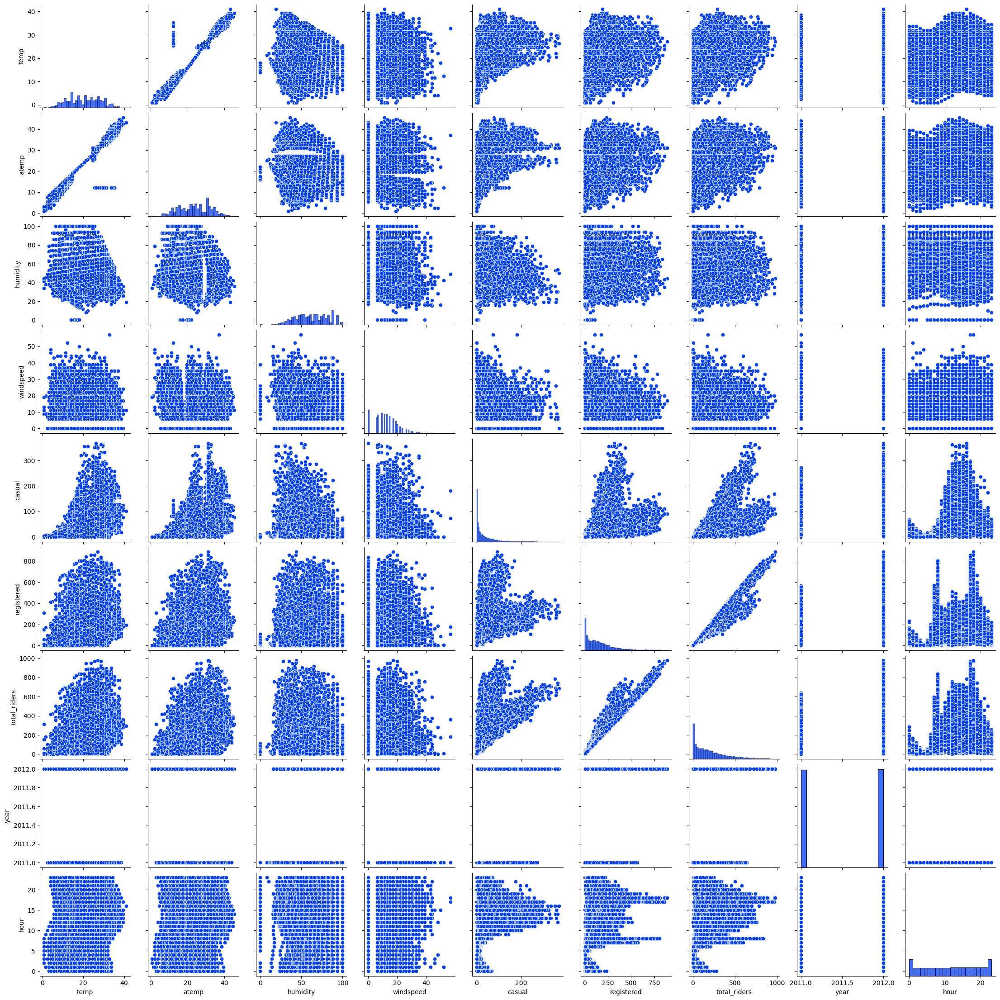

In [184]:
plt.figure(figsize=(14,0.05))
plt.axis('off')
plt.title(f' Pairplot Analysis ',fontfamily='serif',fontweight='bold',fontsize=15,backgroundcolor='teal',color='w')
sns.pairplot(data=yd,palette=cp)
plt.show()

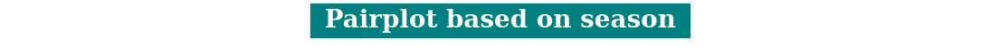

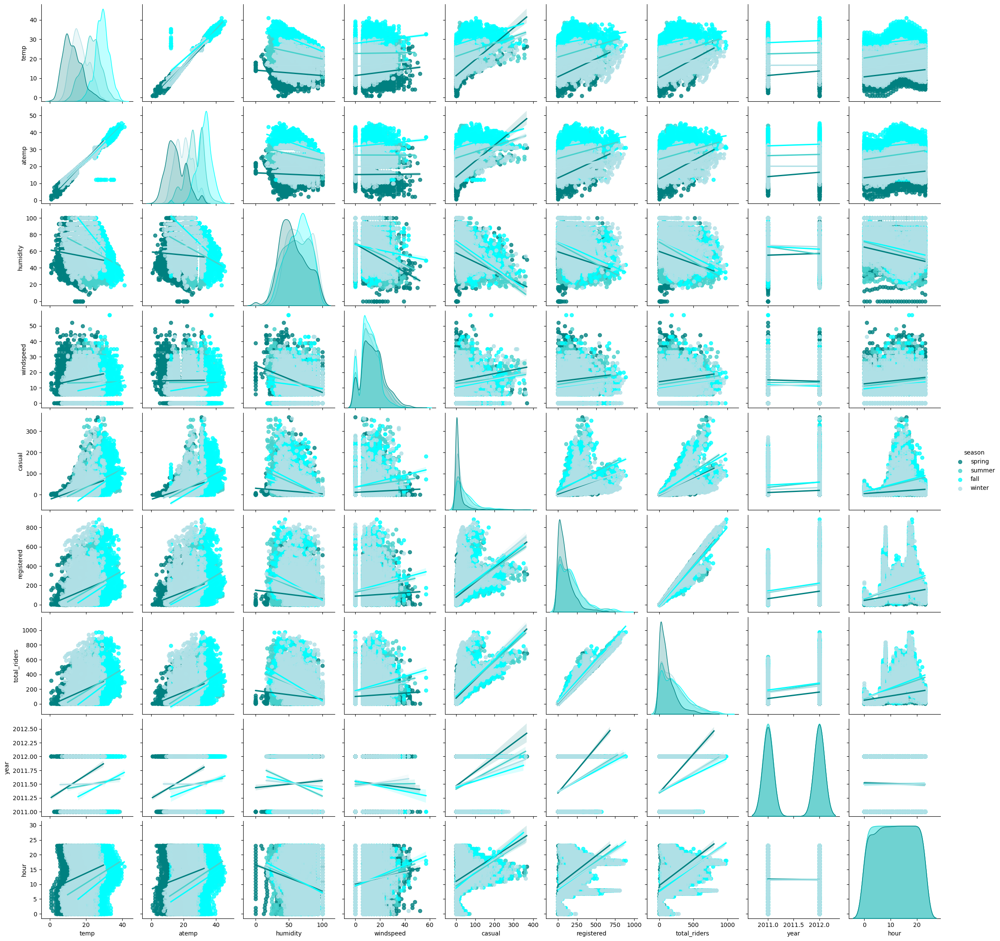

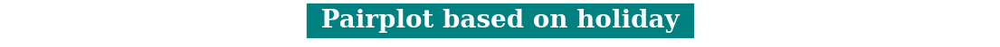

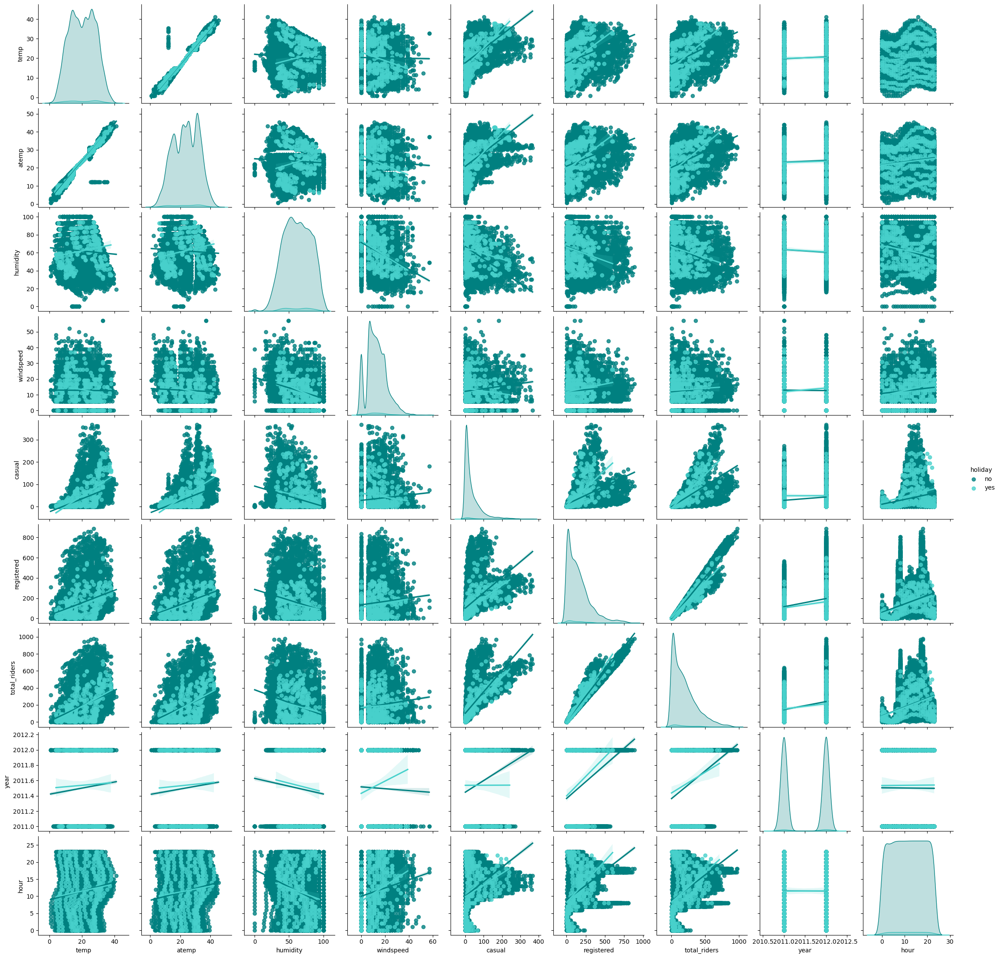

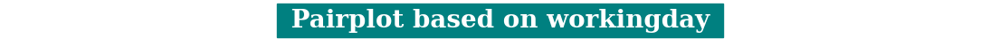

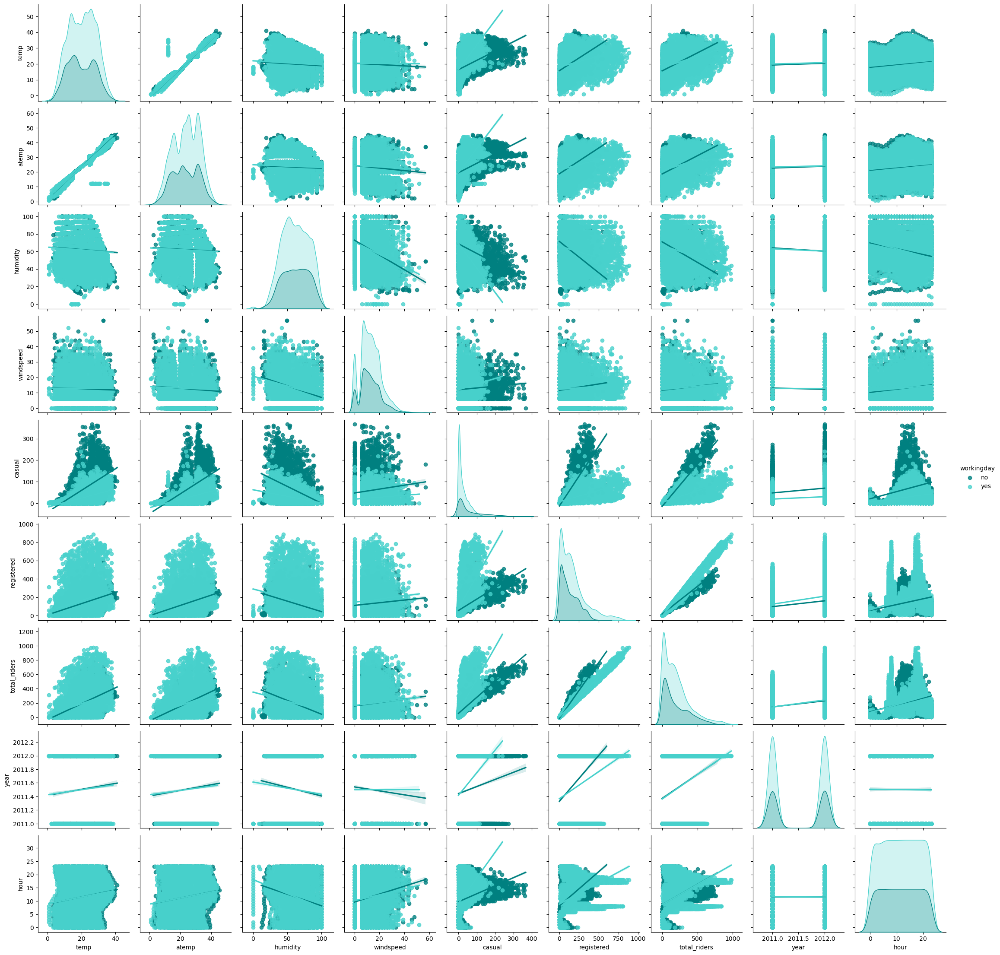

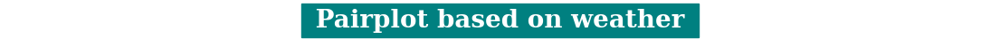

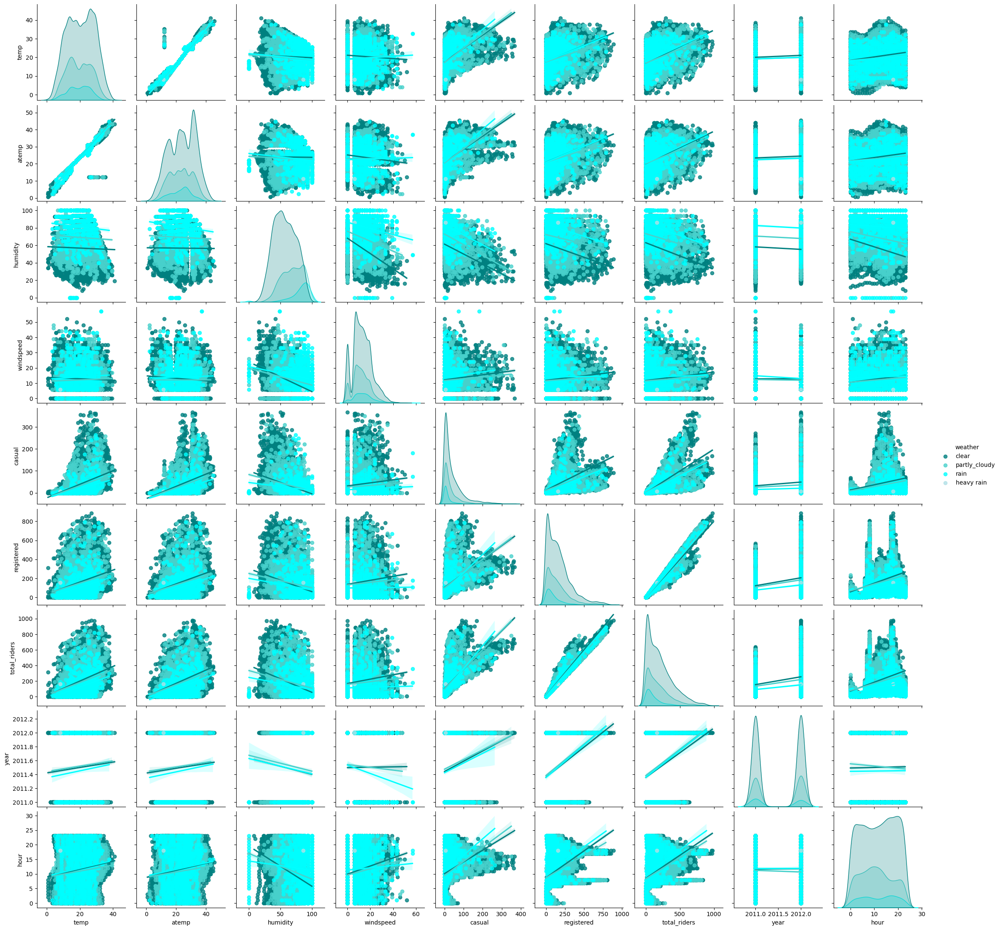

In [187]:
for i in range(len(cat_cols)):
    plt.figure(figsize=(14,0.05))
    plt.axis('off')
    plt.title(f' Pairplot based on {cat_cols[i]} ',fontfamily='serif',fontweight='bold',fontsize=20,backgroundcolor='teal',color='w')
    sns.pairplot(yd,hue=cat_cols[i],kind='reg',palette=cp)
    plt.show()
    print()

# Hypothesis Testing

### 🔖 Check if Working Day has an effect on the number of electric bikes rented on Weekdays and Weekends ?

2- Sample T-Test to check if Working Day has an effect on the number of electric cycles rented.

Assumptions of T-Test

1. The sample size should be less than 30.
2. The population variance is unknown.
3. The population mean and standard deviation are finite.
4. The means of the two populations being compared should follow normal distributions.
5. If using Student's original definition of the t-test, the two populations being compared should have the same variance. If the sample sizes in the two groups being compared are equal, Student's original t-test is highly robust to the presence of unequal variances.

***STEP-1*** : Set up Null Hypothesis

---

  > **Null Hypothesis ( Ho )** - No.of bikes rented on working days and non working days are same.  
        $H_{o}$: $μ_{workingday}$ = $μ_{non-workingday}$

  > **Alternate Hypothesis ( Ha )** - No.of bikes rented on working days and non working days are different.  
        $H_{a}$: $μ_{workingday}$ != $μ_{non-workingday}$

***STEP-2*** : Checking for basic assumpitons for the hypothesis

---
> Normality checks
* Distribution check using **QQ Plot**

* Distribution check using **prob Plot**

* Confirmation by **Shapiro-wilks Test**

* Homogeneity of Variances using **Levene's test**

***STEP-3***: Define Test statistics; Distribution of T under Ho.

---
- We know that the test statistic while performing a T-Test follows Tdistribution.  

    - If data follows normal distribution we go with **ttest_ind**
    - Else we will go with **Mannwhitney_u test** (Non - Parametric test)


***STEP-4***: Decide the kind of test.

---


* We will be performing **Two tailed t-test for indpependent variables**

***STEP-5***: Compute the p-value and fix value of alpha.

---
* we will be computing the t-stat value using the ttest function using scipy.stats.
* We set our ***alpha to be 0.05 (i.e) confidence level = 95%***

***STEP-6***: Compare p-value and alpha.

---

* Based on p-value, we will accept or reject H0.


  >   **p-val > alpha** : Accept Ho  
    
  >   **p-val < alpha** : Reject Ho


T-Test Independent 👇

In [186]:
yd.groupby('workingday')['total_riders'].describe()

,count,mean,std,min,25%,50%,75%,max
workingday,,,,,,,,
no,3474.0,188.506621,173.724015,1.0,44.0,128.0,304.0,783.0
yes,7412.0,193.011873,184.513659,1.0,41.0,151.0,277.0,977.0


In [62]:
workingday_yes = yd[yd['workingday']== 'yes']['total_riders']
workingday_no = yd[yd['workingday']== 'no']['total_riders']

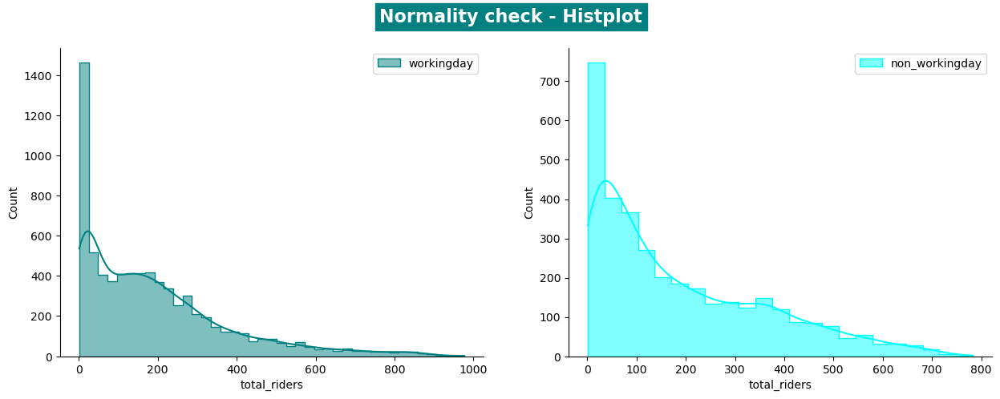

In [202]:
plt.figure(figsize = (15, 5))
plt.suptitle("Normality check - Histplot",fontsize=16,fontweight="bold",backgroundcolor='teal',color='w')
plt.subplot(121)
sns.histplot(workingday_yes, element = 'step', color =cp[0], kde = True, label = 'workingday')
plt.legend()
plt.subplot(122)
sns.histplot(workingday_no,element = 'step', color = cp[2], kde = True, label = 'non_workingday')
plt.legend()
sns.despine()
plt.show()

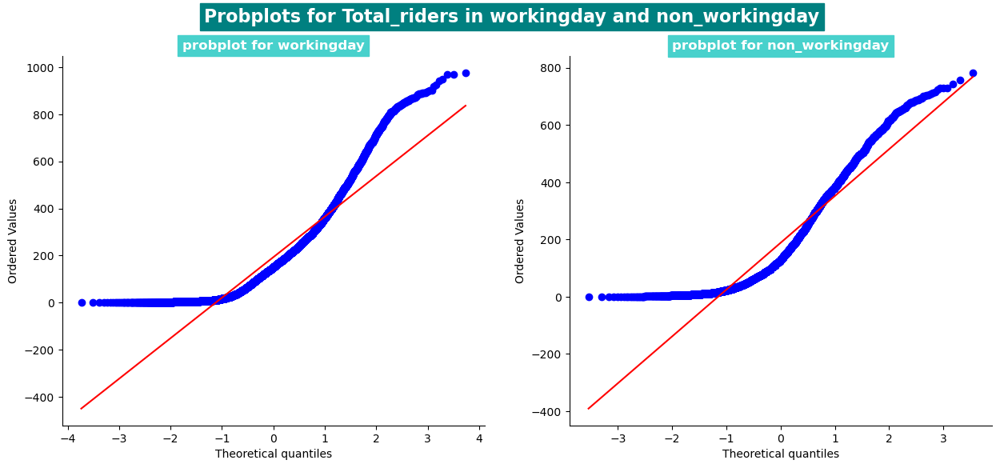

In [206]:
plt.figure(figsize = (15, 6))
plt.subplot(121)
plt.suptitle('Probplots for Total_riders in workingday and non_workingday',fontsize=16,fontweight="bold",backgroundcolor='teal',color='w')
probplot(workingday_yes, plot = plt, dist = 'norm')
plt.title('probplot for workingday',fontsize=12,fontweight="bold",backgroundcolor=cp[1],color='w')
plt.subplot(122)
probplot(workingday_no, plot = plt, dist = 'norm')
plt.title('probplot for non_workingday',fontsize=12,fontweight="bold",backgroundcolor=cp[1],color='w')
sns.despine()
plt.show()

## can also do qqplot

 - It can be inferred from the above plot that the distributions do not follow normal distribution.

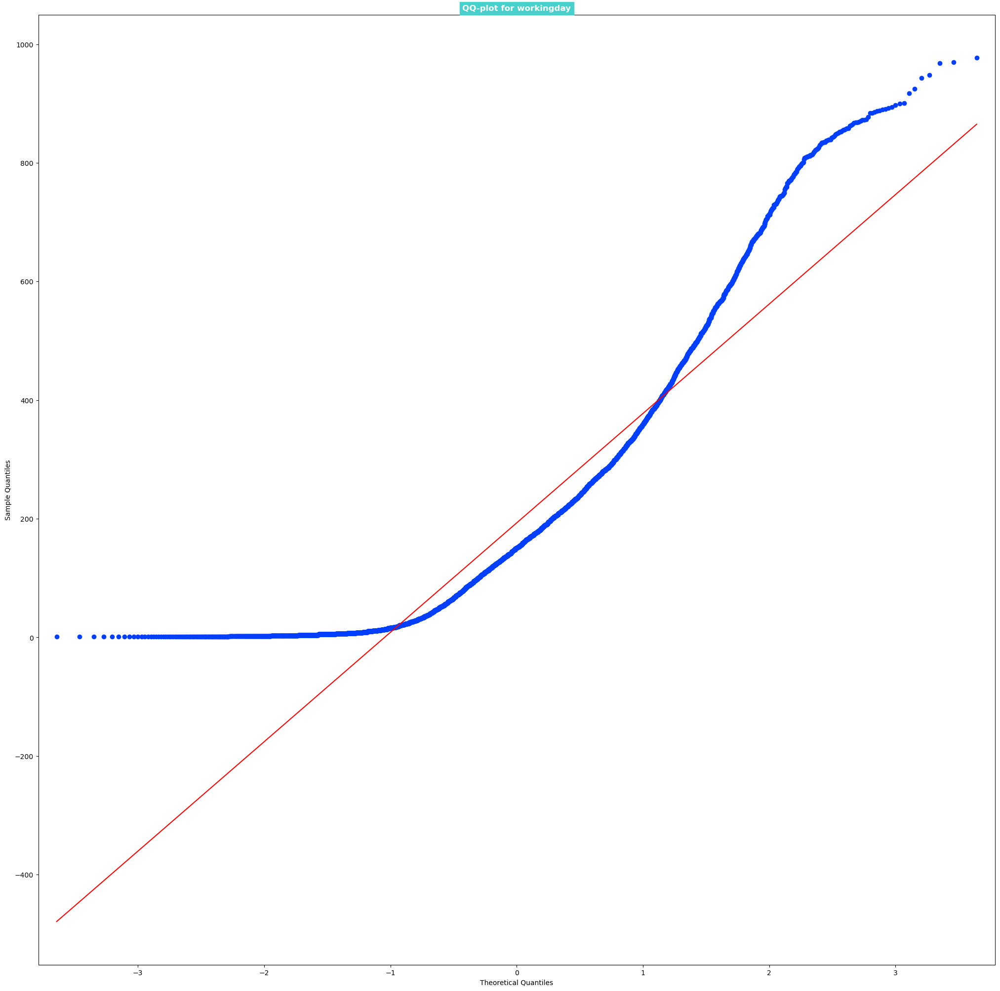

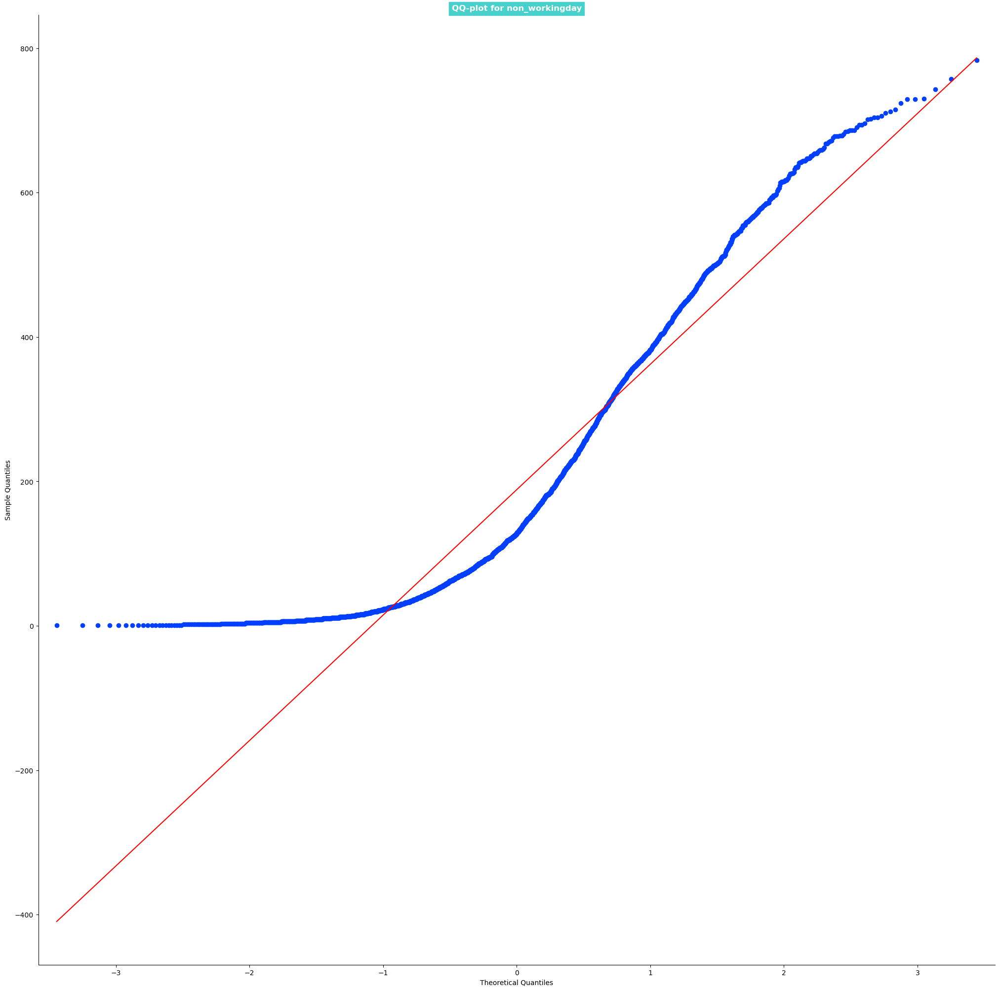

In [221]:
sm.qqplot(workingday_yes,line='s')
plt.title('QQ-plot for workingday',fontsize=12,fontweight="bold",backgroundcolor=cp[1],color='w')

sm.qqplot(workingday_no,line='s')
plt.title('QQ-plot for non_workingday',fontsize=12,fontweight="bold",backgroundcolor=cp[1],color='w')

sns.despine()
plt.show()

### Shapiro test for workingday

> ***Null Hypothesis*** -- Ho -- Data is Gaussian

> ***Alternate Hypothesis*** -- Ha -- Data is not Gaussian

In [225]:
shapiro_stat , p_val = shapiro(workingday_yes)
print(f"shapiro_stat : {shapiro_stat} , p_value : {p_val}") 

if p_val < 0.05:
    print('Data does not follow normal distribution')
else:
    print('Data follows a normal distribution')

shapiro_stat : 0.8702582120895386 , p_value : 0.0
Data does not follow normal distribution


In [226]:
shapiro_stat , p_val = shapiro(workingday_no)
print(f"shapiro_stat : {shapiro_stat} , p_value : {p_val}") 

if p_val < 0.05:
    print('Data does not follow normal distribution')
else:
    print('Data follows a normal distribution')

shapiro_stat : 0.8852126598358154 , p_value : 4.203895392974451e-45
Data does not follow normal distribution


### Levene test for variance

> ***Null Hypothesis(Ho)*** - Homogenous Variance .. Both Datas has similar variance

> ***Alternate Hypothesis(HA)*** - Non Homogenous Variance .. Both Datas has different variance

In [63]:
levene_stat, p_value = levene(workingday_yes,workingday_no)

print('Levene_stat : ', levene_stat)
print('p-value : ', p_value)

if p_value < 0.05:
    print('The samples do not have  Homogenous Variance -- has different variance')
else:
    print('The samples have Homogenous Variance -- has similar variance') 

Levene_stat :  0.004972848886504472
p-value :  0.9437823280916695
The samples have Homogenous Variance -- has similar variance


#### Since the samples are not normally distributed, T-Test cannot be applied here, we can perform its non parametric equivalent test i.e., `Mann-Whitney U rank test` for two independent samples. But we will try to compare both tests....

### Ttest_ind

In [233]:
# Test statistics : Ttest for two independent samples

test_stat, p_value = ttest_ind(workingday_yes,workingday_no)

print(f'ttest_stat : ',test_stat)
print('P-value :',p_value)

if p_value < 0.05:
    print("Reject Null Hypothesis")
    print('No.of bikes rented is not same for working and non-working days')
else:
    print("Failed to Reject Null Hypothesis - Accept Ho")
    print('No.of bikes rented is same for working and non-working days')

ttest_stat :  1.2096277376026694
P-value : 0.22644804226361348
Failed to Reject Null Hypothesis - Accept Ho
No.of bikes rented is same for working and non-working days


## Non-Parametric test

### MannWhitney u Rank test

In [232]:
# Test statistics : Mann-Whitney U rank test for two independent samples

test_stat, p_value = mannwhitneyu(workingday_yes,workingday_no)

print(f'Mannwhitneyu_stat : ',test_stat)
print('P-value :',p_value)

if p_value < 0.05:
    print("Reject Null Hypothesis")
    print('No.of bikes rented is not same for working and non-working days')
else:
    print("Failed to Reject Null Hypothesis - Accept Ho")
    print('No.of bikes rented is same for working and non-working days')

Mannwhitneyu_stat :  12868495.5
P-value : 0.9679139953914079
Failed to Reject Null Hypothesis - Accept Ho
No.of bikes rented is same for working and non-working days


#### 🏷️Insights: 

> In Both ***ttest_ind*** & in ***MannWhitney-u-Rank*** test we find that `"Mean No.of bikes rented is same for working and non-working days"`


month            January  February  March  April    May   June   July  August  \
year workingday                                                                 
2011 no             7019      7324  10348  18516  20360  29537  37253   16049   
     yes           16533     25520  28387  32001  59353  60239  55595   67247   
2012 no            19293     16484  30246  39029  35083  44537  35446   37545   
     yes           37039     49785  64520  77856  85351  86420  86323   92675   

month            September  October  November  December  
year workingday                                          
2011 no              31951    31642     22390     18202  
     yes             47153    47880     48499     42981  
2012 no              48234    30701     40200     27483  
     yes             85191    97211     65351     71494

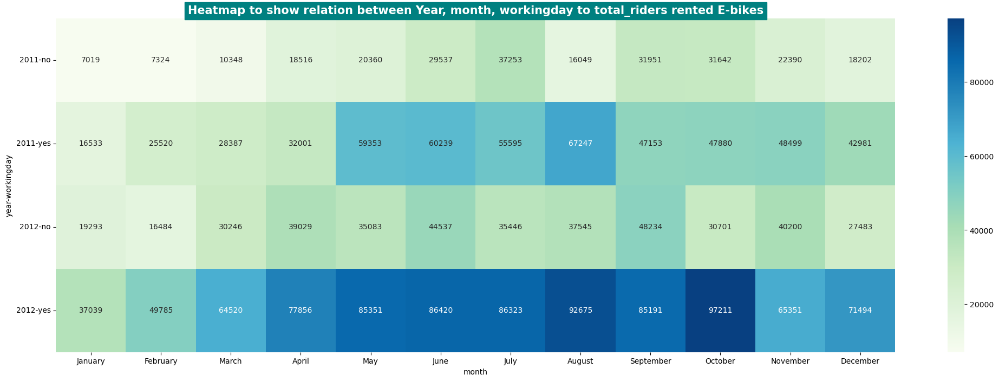

In [133]:
ymwd=yd.groupby(['year','month','workingday'])['total_riders'].sum()
data= ymwd.unstack(level=[1])
data.replace(np.nan,0, inplace=True)
display(data)
plt.figure(figsize=(25,8))
sns.heatmap(data, annot=True, fmt='.6g',cmap='GnBu')
plt.title('Heatmap to show relation between Year, month, workingday to total_riders rented E-bikes',
          fontsize=15,fontweight="bold",backgroundcolor=cp[0],color='w')
plt.yticks(rotation=0)
plt.show()

-----
### 🔖 Check if Weather is dependent on the season

***STEP-1*** : Set up Null Hypothesis

---
> **Null Hypothesis ( Ho )** - weather is independent of season

> **Alternate Hypothesis ( Ha )** -weather is dependent of seasons.

***STEP-2***: Checking for basic assumptions for the hypothesis (Non-Parametric Test)

---
1. The data in the cells should be **frequencies**, or **counts** of cases.
2. The levels (or categories) of the variables are **mutually exclusive**. That is, a particular subject fits into one and only one level of each of the variables. 
3. There are 2 variables, and both are measured as **categories**.
4. The **value of the cell expecteds should be 5 or more**in at least 80% of the cells, and no cell should have an expected of less than one (3).


***STEP-3***: Define Test statistics; Distribution of T under H0.

---
The test statistic for a Chi- square test . Under Ho, the test statistic should follow **Chi-Square Distribution**.

***STEP-4***: Decide the kind of test.

---
Here we will perform the chisquare Test of independence (i.e) chi2_contingency

***STEP-5***: Compute the p-value and fix value of alpha.

---
we will be computing the chi square-test p-value using the chi 2 function using scipy.stats. We set our **alpha to be 0.05**

***STEP-6***: Compare p-value and alpha.

---

Based on p-value, we will accept or reject H0.

1. **p-val > alpha** : Accept H0
2. **p-val < alpha** : Reject H0

The **Chi-square statistic is a non-parametric** (distribution free) tool designed to analyze group differences when the dependent variable is measured at a nominal level. Like all non-parametric statistics, the Chi-square is robust with respect to the distribution of the data. Specifically, it does not require equality of variances among the study groups or homoscedasticity in the data.

In [235]:
ws = pd.crosstab(yd['weather'],yd['season'])
ws

season,fall,spring,summer,winter
weather,,,,
clear,1930,1759,1801,1702
heavy rain,0,1,0,0
partly_cloudy,604,715,708,807
rain,199,211,224,225


In [240]:
obs_value = np.array([ws.iloc[0][0:4].values ,ws.iloc[2][0:4].values ,ws.iloc[3][0:4].values])
obs_value

array([[1930, 1759, 1801, 1702],
       [ 604,  715,  708,  807],
       [ 199,  211,  224,  225]], dtype=int64)

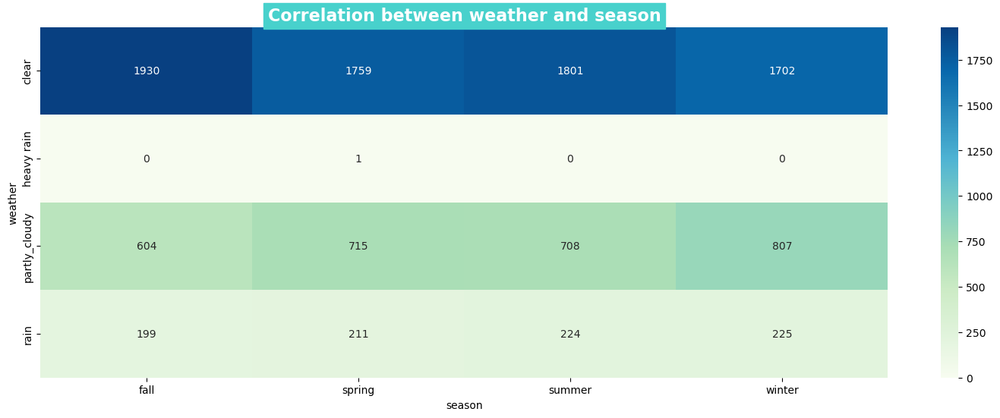

In [238]:
plt.figure(figsize=(18,6))
sns.heatmap(ws, annot=True, fmt='.6g',cmap='GnBu')
plt.title('Correlation between weather and season',fontsize=16,fontweight="bold",backgroundcolor=cp[1],color='w')
plt.show()

In [242]:
chi_stat , p_value , dof , expected = chi2_contingency(obs_value)

print("chi_stat : ",chi_stat)
print("p_value : ",p_value)
print("dof : ",dof)
print("expected : ",expected)

alpha = 0.05
if p_value< alpha:
    print("Reject Ho")
    print("Weather is dependent on season")
else:
    print("Fail to Reject Ho")
    print("Weather is independent on season")

chi_stat :  46.101457310732485
p_value :  2.8260014509929403e-08
dof :  6
expected :  [[1805.76352779 1774.04869086 1805.76352779 1806.42425356]
 [ 711.55920992  699.06201194  711.55920992  711.81956821]
 [ 215.67726229  211.8892972   215.67726229  215.75617823]]
Reject Ho
Weather is dependent on season


#### 🏷️Insights:

> This chisquare test of independence confirms that **`Weather is dependent on Various seasons.`**

----

### 🔖check if No.of bikes rented is similar or different in different weather

In [9]:
yd.weather.value_counts()

weather
clear            7192
partly_cloudy    2834
rain              859
heavy rain          1
Name: count, dtype: int64

The one-way ANOVA compares the means between the groups you are interested in and determines whether any of those means are statistically significantly different from each other. 

Specifically, it tests the null hypothesis (H0):

***µ1 = µ2 = µ3 = ..... = µk***


where, µ = group mean and k = number of groups. 

If, however, the one-way ANOVA returns a statistically significant result, we accept the alternative hypothesis (HA), which is that there are at least two group means that are statistically significantly different from each other.

***STEP-1*** : Set up Null Hypothesis

---
> **Null Hypothesis(Ho)** - The mean of bikes rented is same for across weather conditions. 

(We wont be considering 'HeavyRain' as there in only 1 data point and we cannot perform a ANOVA test with a single data point for a group.)

> **Alternate Hypothesis(Ha)** - The mean number of bikes rented is different across at least two weather conditions.

***STEP-2*** : Checking for basic assumptions for the hypothesis

---
Normality check using **QQ Plot**. If the distribution is not normal, use **BOX-COX transform** to transform it to normal distribution.

Homogeneity of Variances using **Levene's test**

Each observations are **independent**.

***STEP-3***: Define **Test statistics**; Distribution of T under H0.

---
The test statistic for a One-Way ANOVA is denoted as F. For an independent variable with k groups, the F statistic evaluates whether the group means are significantly different.

**F=MSR/MSE**

Under H0, the test statistic should follow **F-Distribution**.

***STEP-4***: Decide the kind of test.

---
We will be performing **right tailed t-test** becuz of the data right skewness

***STEP-5***: Compute the **p-value** and fix value of alpha.

---
we will be computing the anova-test p-value using the f_oneway function using scipy.stats. We set our **alpha to be 0.05**

***STEP-6***: Compare p-value and alpha.

---
Based on p-value, we will accept or reject H0. 
* **p-val > alpha** : Accept H0 
* **p-val < alpha** : Reject H0

In [41]:
clear = yd[yd['weather']=='clear']['total_riders']
partly_cloudy = yd[yd['weather']=='partly_cloudy']['total_riders']
rain = yd[yd['weather']=='rain']['total_riders']
heavyrain = yd[yd['weather']=='heavy rain']['total_riders']

#### Normality Check:
Plot checks:

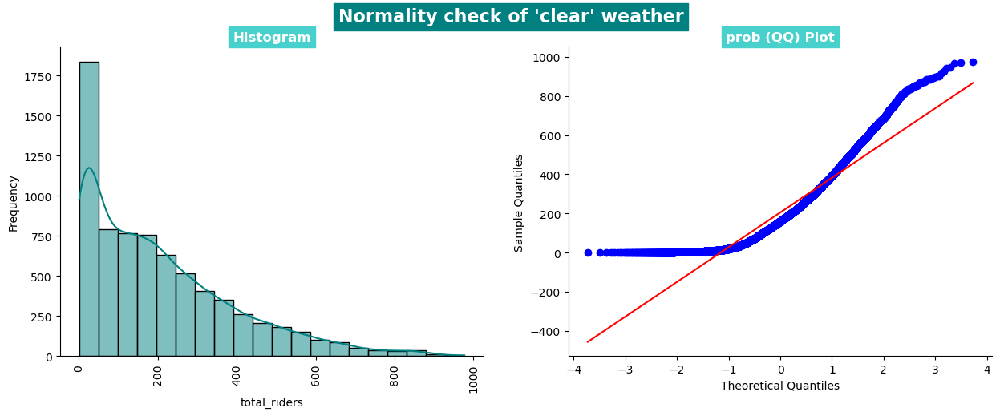

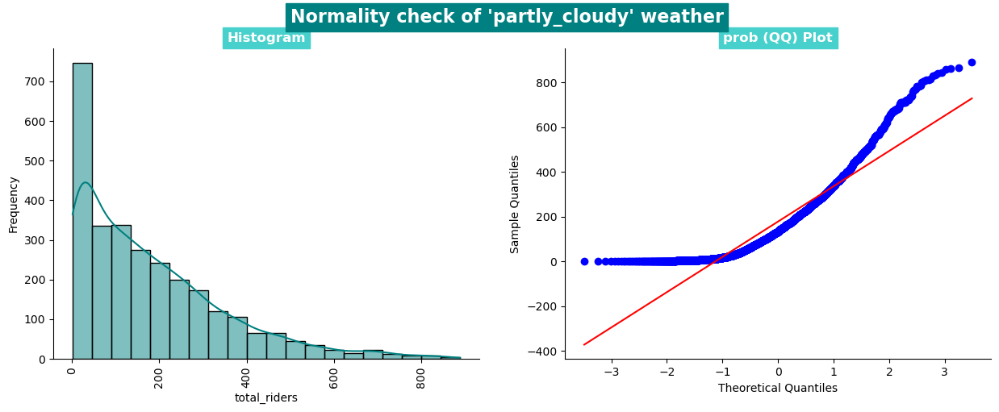

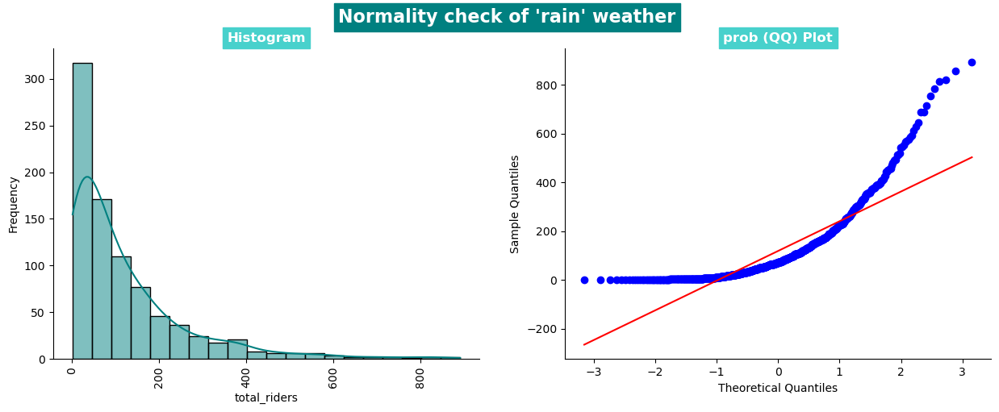

In [53]:
weather_cols = {'clear':clear, 'partly_cloudy':partly_cloudy, 'rain':rain}

for col_name,data in weather_cols.items():
    plt.figure(figsize=(15,5))
    plt.suptitle(f'Normality check of \'{col_name}\' weather',fontsize=16,fontweight="bold",backgroundcolor=cp[0],color='w')
    
    plt.subplot(121)
    sns.histplot(data, bins=20,kde=True,color='teal')
    plt.ylabel('Frequency')
    plt.title(f'Histogram',fontsize=12,fontweight="bold",backgroundcolor=cp[1],color='w')
    plt.xticks(rotation=90)

    plt.subplot(122)
    probplot(data, dist='norm', plot=plt)
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Sample Quantiles')
    plt.title(f'prob (QQ) Plot',fontsize=12,fontweight="bold",backgroundcolor=cp[1],color='w')
    
    sns.despine()
    plt.show()

We already know 'Total_riders' is not a normal (gaussian) distribution. It **doesnt also satisfy the QQ - Plots.**

But to perform ANOVA, we need our groups to be gaussian distributed. So, we will perform **BOX-COX transform** to change the distribution of these groups to normal.

lets try ***BOX-COX Transform***

In [54]:
boxcoxed_clear , best_lambda = boxcox(clear)
boxcoxed_partly_cloudy , best_lambda = boxcox(partly_cloudy)
boxcoxed_rain , best_lambda = boxcox(rain)

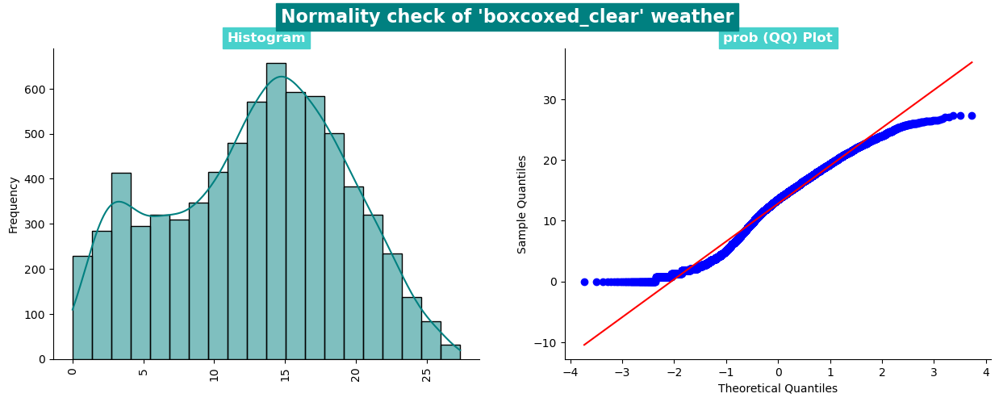

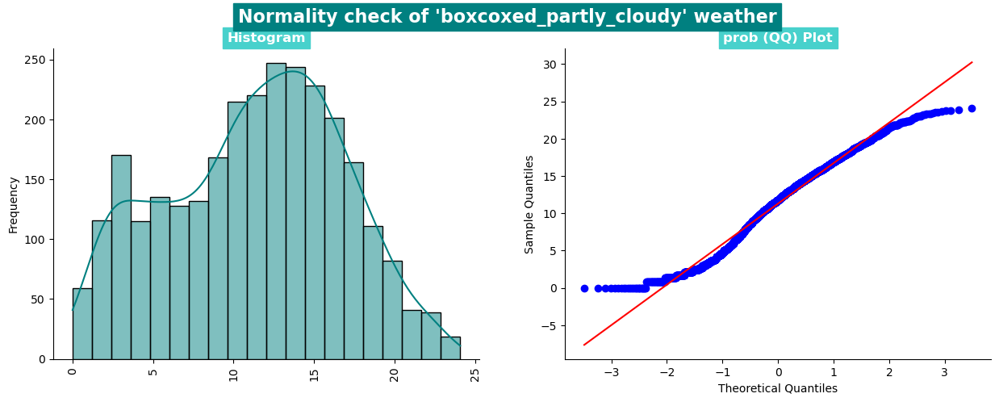

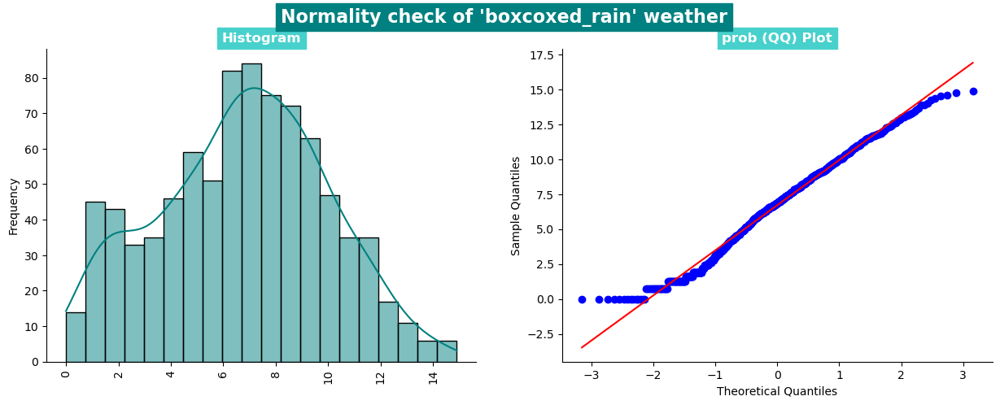

In [55]:
weather_cols = {'boxcoxed_clear':boxcoxed_clear, 'boxcoxed_partly_cloudy':boxcoxed_partly_cloudy, 'boxcoxed_rain':boxcoxed_rain}

for col_name,data in weather_cols.items():
    plt.figure(figsize=(15,5))
    plt.suptitle(f'Normality check of \'{col_name}\' weather',fontsize=16,fontweight="bold",backgroundcolor=cp[0],color='w')
    
    plt.subplot(121)
    sns.histplot(data, bins=20,kde=True,color='teal')
    plt.ylabel('Frequency')
    plt.title(f'Histogram',fontsize=12,fontweight="bold",backgroundcolor=cp[1],color='w')
    plt.xticks(rotation=90)

    plt.subplot(122)
    probplot(data, dist='norm', plot=plt)
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Sample Quantiles')
    plt.title(f'prob (QQ) Plot',fontsize=12,fontweight="bold",backgroundcolor=cp[1],color='w')
    
    sns.despine()
    plt.show()

### Shapiro-Wilk Test:

In [60]:
weather_cols = {'clear':clear, 'partly_cloudy':partly_cloudy, 'rain':rain}

for col_name,data in weather_cols.items():
    shapiro_stat , p_val = shapiro(data)
    print(f"shapiro_stat : {shapiro_stat} , p_value : {p_val}") 

    if p_val < 0.05:
        print(f'Data {col_name} is not Gaussian distribution')
        print()
    else:
        print(f'Data {col_name} is Gaussian distribution')
        print()
    print('-'*125)

shapiro_stat : 0.8909230828285217 , p_value : 0.0
Data clear is not Gaussian distribution

-----------------------------------------------------------------------------------------------------------------------------
shapiro_stat : 0.8767687082290649 , p_value : 9.781063280987223e-43
Data partly_cloudy is not Gaussian distribution

-----------------------------------------------------------------------------------------------------------------------------
shapiro_stat : 0.7674332857131958 , p_value : 3.876090133422781e-33
Data rain is not Gaussian distribution

-----------------------------------------------------------------------------------------------------------------------------


In [59]:
weather_cols = {'boxcoxed_clear':boxcoxed_clear, 'boxcoxed_partly_cloudy':boxcoxed_partly_cloudy, 'boxcoxed_rain':boxcoxed_rain}

for col_name,data in weather_cols.items():
    shapiro_stat , p_val = shapiro(data)
    print(f"shapiro_stat : {shapiro_stat} , p_value : {p_val}") 

    if p_val < 0.05:
        print(f'Data {col_name} is not Gaussian distribution')
        print()
    else:
        print(f'Data {col_name} is Gaussian distribution')
        print()
    print('-'*125)

shapiro_stat : 0.9771609306335449 , p_value : 2.061217589223373e-32
Data boxcoxed_clear is not Gaussian distribution

-----------------------------------------------------------------------------------------------------------------------------
shapiro_stat : 0.9802151918411255 , p_value : 1.9216098393369846e-19
Data boxcoxed_partly_cloudy is not Gaussian distribution

-----------------------------------------------------------------------------------------------------------------------------
shapiro_stat : 0.9877902269363403 , p_value : 1.4133181593933841e-06
Data boxcoxed_rain is not Gaussian distribution

-----------------------------------------------------------------------------------------------------------------------------


#### Both **original data and the Boxcoxed data** doesn't follow the *normal distribution*, so We cannot perform **Anova**. We will have to go with the `Kruskel-Walis H Test`. But, we will try to do Anova as well as Kruskal test and try to compare the difference.

### Levene test for variance

> ***Null Hypothesis(Ho)*** - Homogenous Variance .. Both Datas has similar variance

> ***Alternate Hypothesis(HA)*** - Non Homogenous Variance .. Both Datas has different variance

In [85]:
levene_stat, p_value = levene(clear,partly_cloudy,rain)

print('Levene_stat : ', levene_stat)
print('p-value : ', p_value)

if p_value < 0.05:
    print('The samples do not have  Homogenous Variance -- has different variance')
else:
    print('The samples have Homogenous Variance -- has similar variance') 

Levene_stat :  81.67574924435011
p-value :  6.198278710731511e-36
The samples do not have  Homogenous Variance -- has different variance


### KRUSKAL_WALIS H TEST

In [66]:
alpha = 0.05
test_stat, p_value = kruskal(clear,partly_cloudy,rain)  
print('Test Statistic =', test_stat)
print('p value =', p_value)

if p_value < alpha:
    print('Reject Null Hypothesis')
    print("The mean number of bikes rented is different across at weather conditions")
else:
    print('Failed to reject Null Hypothesis')
    print("The mean of bikes rented is same for across weather conditions.")

Test Statistic = 204.95566833068537
p value = 3.122066178659941e-45
Reject Null Hypothesis
The mean number of bikes rented is different across at weather conditions


### ANOVA

In [68]:
test = ols('total_riders ~ C(weather)',data=yd).fit()
sm.stats.anova_lm(test,typ=2)

,sum_sq,df,F,PR(>F)
C(weather),6.338070e+06,3.0,65.530241,5.482069e-42
Residual,3.508348e+08,10882.0,NaN,NaN


In [69]:
test_stat, p_value = f_oneway(clear,partly_cloudy,rain)  
print('Test Statistic =', test_stat)
print('p value =', p_value)

Test Statistic = 98.28356881946706
p value = 4.976448509904196e-43


In [119]:
month_order = ['January', 'February', 'March', 'April', 'May',
               'June', 'July', 'August', 'September', 
               'October', 'November', 'December']
yd['month']= pd.Categorical(yd['month'],categories=month_order, ordered=True)

year        2011                                   2012                       \
weather    clear partly_cloudy  rain heavy rain   clear partly_cloudy   rain   
month                                                                          
January    15882          6936   734          0   43195         11008   1965   
February   24210          7442  1192          0   42586         18156   5527   
March      26351         11643   741          0   70785         21221   2760   
April      29609         17112  3796          0   96327         17980   2578   
May        51408         21220  7085          0   79046         35325   6063   
June       66244         19109  4423          0  103716         23431   3810   
July       80452         10699  1697          0   90302         26057   5410   
August     64061         14032  5203          0   90499         33524   6197   
September  45949         26914  6241          0   98853         28160   6412   
October    54212         17514  7796          0   79356         37311  11245   
November   53311         14819  2759          0   73685         29434   2432   
December   43125         16170  1888          0   52899         41943   4135   

year                  
weather   heavy rain  
month                 
January          164  
February           0  
March              0  
April              0  
May                0  
June               0  
July               0  
August             0  
September          0  
October            0  
November           0  
December           0

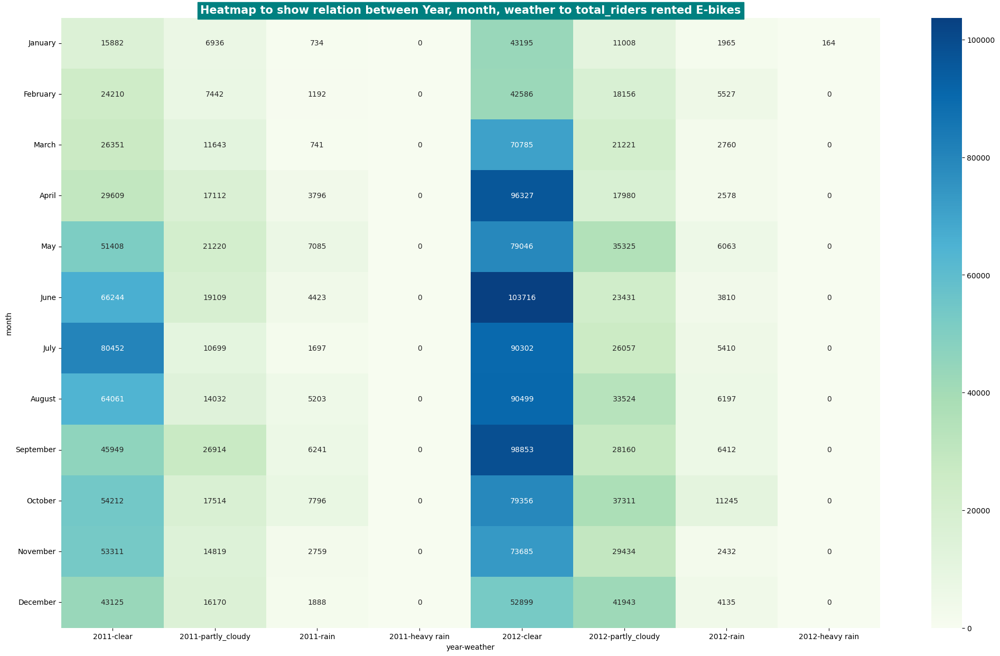

In [121]:
ymw=yd.groupby(['year','month','weather'])['total_riders'].sum()
data= ymw.unstack(level=[0,2])
data.replace(np.nan,0, inplace=True)
display(data)
plt.figure(figsize=(25,15))
sns.heatmap(data, annot=True, fmt='.6g',cmap='GnBu')
plt.title('Heatmap to show relation between Year, month, weather to total_riders rented E-bikes',
          fontsize=15,fontweight="bold",backgroundcolor=cp[0],color='w')
plt.yticks(rotation=0)
plt.show()

#### 🏷️Insights:

> From both the ***Krukal-walis test & ANOVA test*** , we can confirm that `The mean number of E-bikes rented differs across various weather conditions.`

-----

### 🔖check if No.of bikes rented is similar or different in different Seasons

In [74]:
yd.season.unique()

['spring', 'summer', 'fall', 'winter']
Categories (4, object): ['spring', 'summer', 'fall', 'winter']

In [76]:
yd.groupby('season')['total_riders'].describe()

,count,mean,std,min,25%,50%,75%,max
season,,,,,,,,
spring,2686.0,116.343261,125.273974,1.0,24.0,78.0,164.0,801.0
summer,2733.0,215.251372,192.007843,1.0,49.0,172.0,321.0,873.0
fall,2733.0,234.417124,197.151001,1.0,68.0,195.0,347.0,977.0
winter,2734.0,198.988296,177.622409,1.0,51.0,161.0,294.0,948.0


The one-way ANOVA compares the means between the groups you are interested in and determines whether any of those means are statistically significantly different from each other. 

***STEP-1*** : Set up Null Hypothesis

---
> **Null Hypothesis(Ho)** - The mean of bikes rented is same for across various Seasons. 

> **Alternate Hypothesis(Ha)** - The mean number of bikes rented is different for across various seasons.

***STEP-2*** : Checking for basic assumptions for the hypothesis

---
Normality check using **QQ Plot**. If the distribution is not normal, use **BOX-COX transform** to transform it to normal distribution.

Homogeneity of Variances using **Levene's test**

Each observations are **independent**.

***STEP-3***: Define **Test statistics**; Distribution of T under H0.

---
The test statistic for a One-Way ANOVA is denoted as F. For an independent variable with k groups, the F statistic evaluates whether the group means are significantly different.

**F=MSR/MSE**

Under H0, the test statistic should follow **F-Distribution**.

***STEP-4***: Decide the kind of test.

---
We will be performing **right tailed t-test** becuz of the data right skewness

***STEP-5***: Compute the **p-value** and fix value of alpha.

---
we will be computing the anova-test p-value using the f_oneway function using scipy.stats. We set our **alpha to be 0.05**

***STEP-6***: Compare p-value and alpha.

---
Based on p-value, we will accept or reject H0. 
* **p-val > alpha** : Accept H0 
* **p-val < alpha** : Reject H0

In [77]:
summer = yd[yd['season']=='summer']['total_riders']
winter = yd[yd['season']=='winter']['total_riders']
fall = yd[yd['season']=='fall']['total_riders']
spring = yd[yd['season']=='spring']['total_riders']

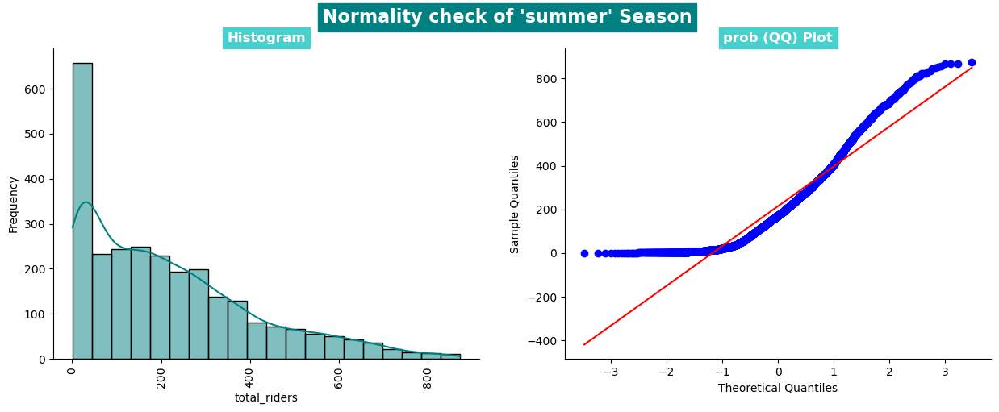

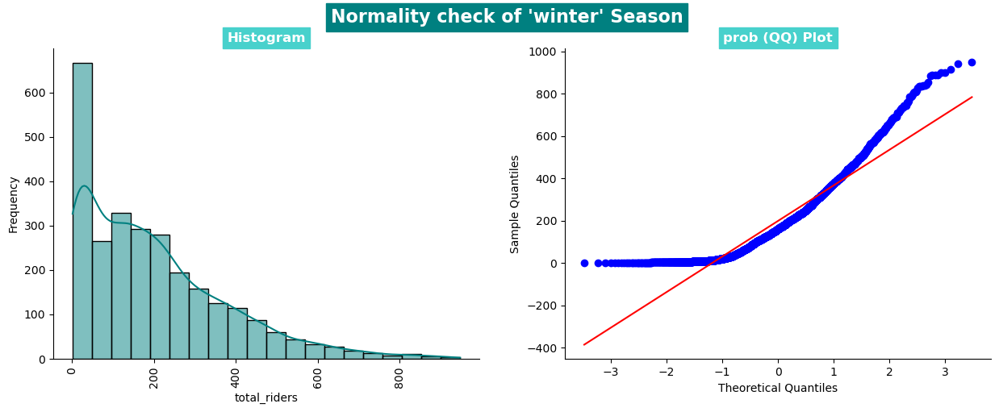

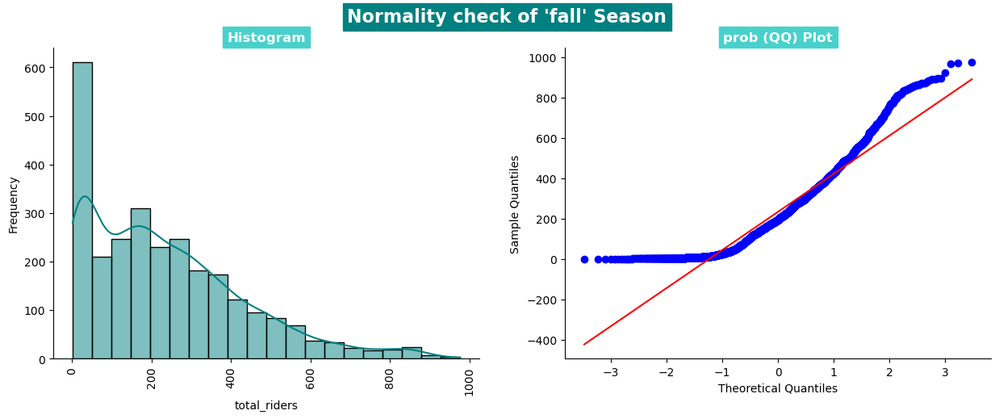

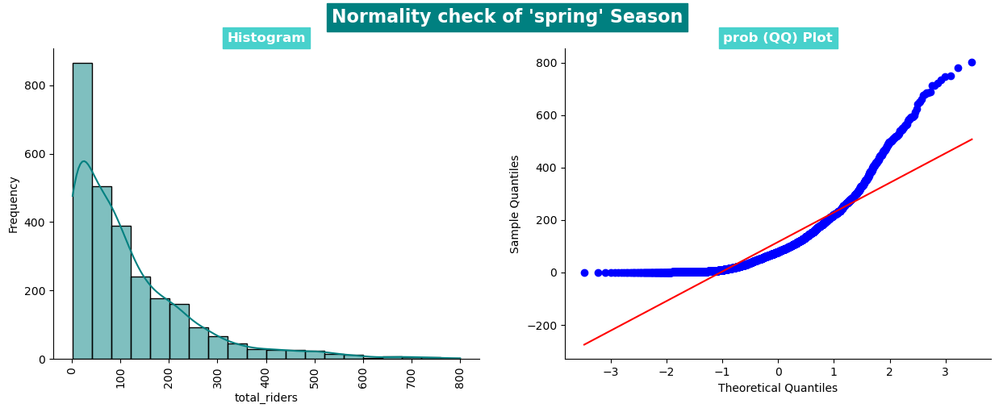

In [78]:
season_cols = {'summer':summer , 'winter':winter , 'fall':fall, 'spring':spring}

for col_name,data in season_cols.items():
    plt.figure(figsize=(15,5))
    plt.suptitle(f'Normality check of \'{col_name}\' Season',fontsize=16,fontweight="bold",backgroundcolor=cp[0],color='w')
    
    plt.subplot(121)
    sns.histplot(data, bins=20,kde=True,color='teal')
    plt.ylabel('Frequency')
    plt.title(f'Histogram',fontsize=12,fontweight="bold",backgroundcolor=cp[1],color='w')
    plt.xticks(rotation=90)

    plt.subplot(122)
    probplot(data, dist='norm', plot=plt)
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Sample Quantiles')
    plt.title(f'prob (QQ) Plot',fontsize=12,fontweight="bold",backgroundcolor=cp[1],color='w')
    
    sns.despine()
    plt.show()

We already know 'Total_riders' is not a normal (gaussian) distribution. It **doesnt also satisfy the QQ - Plots.**

But to perform ANOVA, we need our groups to be gaussian distributed. So, we will perform **BOX-COX transform** to change the distribution of these groups to normal.

lets try ***BOX-COX Transformation***

In [80]:
boxcoxed_summer , best_lambda = boxcox(summer)
boxcoxed_winter , best_lambda = boxcox(winter)
boxcoxed_fall , best_lambda = boxcox(fall)
boxcoxed_spring , best_lambda = boxcox(spring)

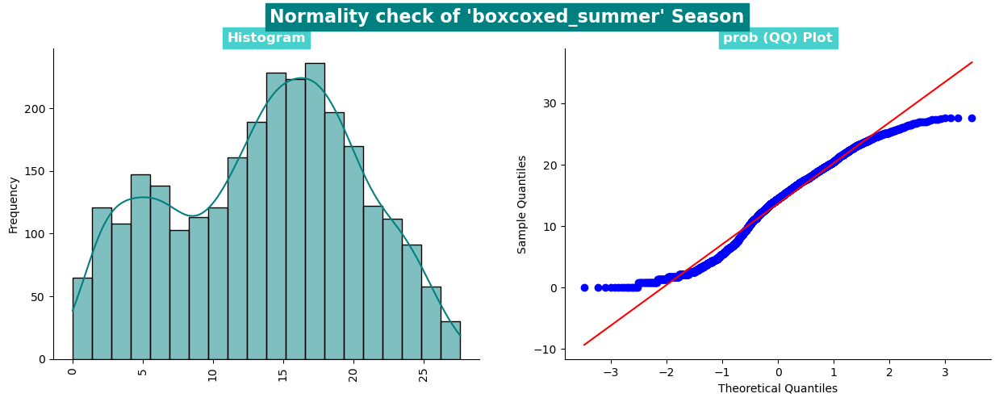

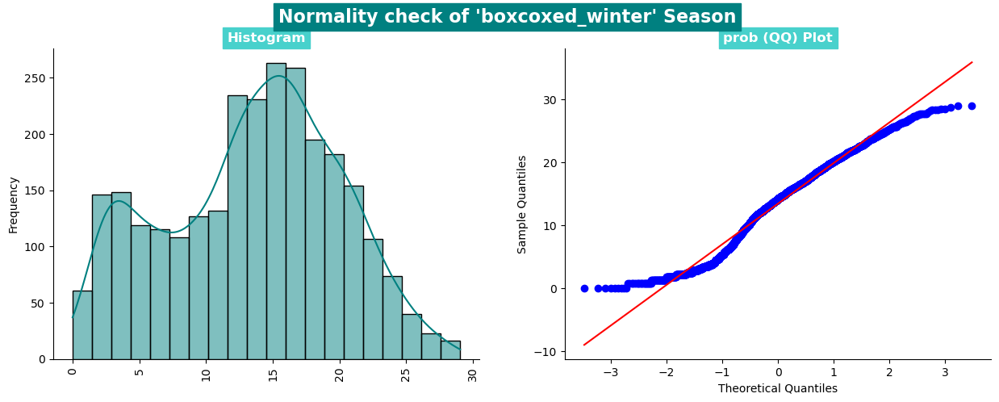

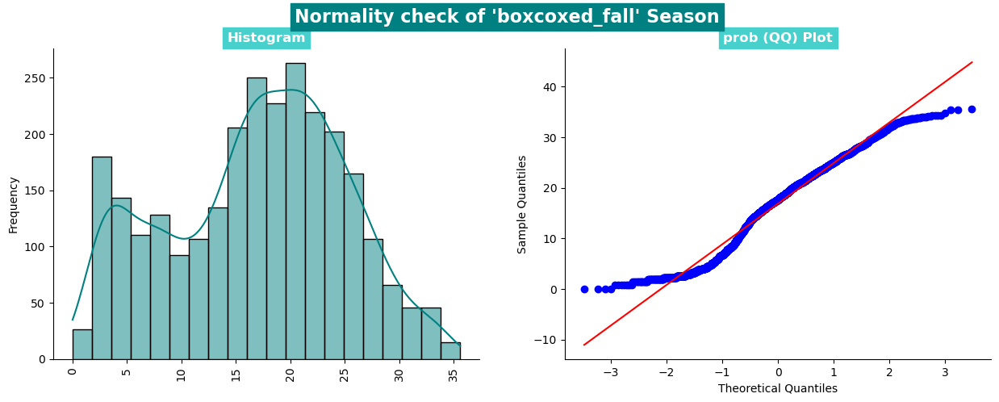

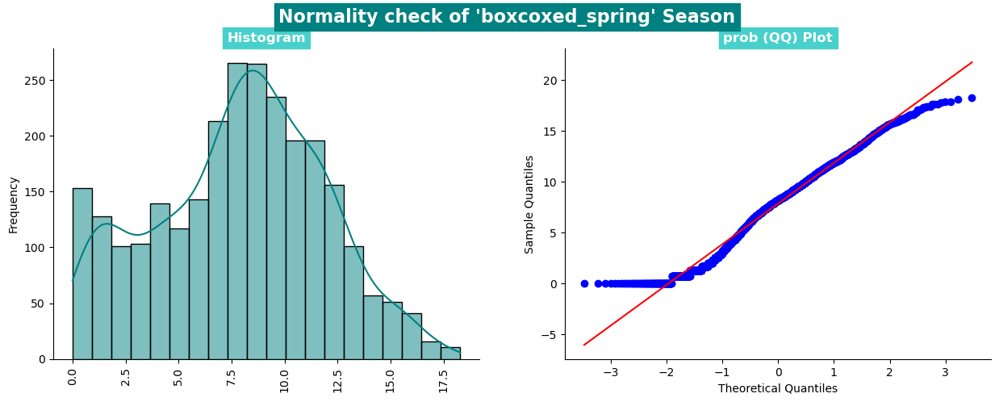

In [83]:
season_cols = {'boxcoxed_summer':boxcoxed_summer, 'boxcoxed_winter':boxcoxed_winter, 
                'boxcoxed_fall':boxcoxed_fall, 'boxcoxed_spring':boxcoxed_spring}

for col_name,data in season_cols.items():
    plt.figure(figsize=(15,5))
    plt.suptitle(f'Normality check of \'{col_name}\' Season',fontsize=16,fontweight="bold",backgroundcolor=cp[0],color='w')
    
    plt.subplot(121)
    sns.histplot(data, bins=20,kde=True,color='teal')
    plt.ylabel('Frequency')
    plt.title(f'Histogram',fontsize=12,fontweight="bold",backgroundcolor=cp[1],color='w')
    plt.xticks(rotation=90)

    plt.subplot(122)
    probplot(data, dist='norm', plot=plt)
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Sample Quantiles')
    plt.title(f'prob (QQ) Plot',fontsize=12,fontweight="bold",backgroundcolor=cp[1],color='w')
    
    sns.despine()
    plt.show()

### Shapiro-Wilk Test:

In [82]:
season_cols = {'summer':summer , 'winter':winter , 'fall':fall, 'spring':spring}

for col_name,data in season_cols.items():
    shapiro_stat , p_val = shapiro(data)
    print(f"shapiro_stat : {shapiro_stat} , p_value : {p_val}") 

    if p_val < 0.05:
        print(f'Data {col_name} is not Gaussian distribution')
        print()
    else:
        print(f'Data {col_name} is Gaussian distribution')
        print()
    print('-'*125)

shapiro_stat : 0.900481641292572 , p_value : 6.039093315091269e-39
Data summer is not Gaussian distribution

-----------------------------------------------------------------------------------------------------------------------------
shapiro_stat : 0.8954644799232483 , p_value : 1.1301682309549298e-39
Data winter is not Gaussian distribution

-----------------------------------------------------------------------------------------------------------------------------
shapiro_stat : 0.9148160815238953 , p_value : 1.043458045587339e-36
Data fall is not Gaussian distribution

-----------------------------------------------------------------------------------------------------------------------------
shapiro_stat : 0.8087388873100281 , p_value : 0.0
Data spring is not Gaussian distribution

-----------------------------------------------------------------------------------------------------------------------------


In [84]:
season_cols = {'boxcoxed_summer':boxcoxed_summer, 'boxcoxed_winter':boxcoxed_winter, 
                'boxcoxed_fall':boxcoxed_fall, 'boxcoxed_spring':boxcoxed_spring}
for col_name,data in season_cols.items():
    shapiro_stat , p_val = shapiro(data)
    print(f"shapiro_stat : {shapiro_stat} , p_value : {p_val}") 

    if p_val < 0.05:
        print(f'Data {col_name} is not Gaussian distribution')
        print()
    else:
        print(f'Data {col_name} is Gaussian distribution')
        print()
    print('-'*125)

shapiro_stat : 0.9730892181396484 , p_value : 2.7910560207702335e-22
Data boxcoxed_summer is not Gaussian distribution

-----------------------------------------------------------------------------------------------------------------------------
shapiro_stat : 0.9763026833534241 , p_value : 6.342709865441161e-21
Data boxcoxed_winter is not Gaussian distribution

-----------------------------------------------------------------------------------------------------------------------------
shapiro_stat : 0.9733710289001465 , p_value : 3.6319999210910884e-22
Data boxcoxed_fall is not Gaussian distribution

-----------------------------------------------------------------------------------------------------------------------------
shapiro_stat : 0.9828581213951111 , p_value : 1.7082116755999925e-17
Data boxcoxed_spring is not Gaussian distribution

-----------------------------------------------------------------------------------------------------------------------------


#### Both **original data and the Boxcoxed data** doesn't follow the *normal distribution*, so We cannot perform **Anova**. We will have to go with the `Kruskel-Walis H Test`. But, we will try to do Anova as well as Kruskal test and try to compare the difference.

### Levene test for variance

> ***Null Hypothesis(Ho)*** - Homogenous Variance .. Both Datas has similar variance

> ***Alternate Hypothesis(HA)*** - Non Homogenous Variance .. Both Datas has different variance

In [86]:
levene_stat, p_value = levene(summer,winter,fall,spring)

print('Levene_stat : ', levene_stat)
print('p-value : ', p_value)

if p_value < 0.05:
    print('The samples do not have  Homogenous Variance -- has different variance')
else:
    print('The samples have Homogenous Variance -- has similar variance') 

Levene_stat :  187.7706624026276
p-value :  1.0147116860043298e-118
The samples do not have  Homogenous Variance -- has different variance


#### KRUSKAL_WALIS H TEST

In [92]:
alpha = 0.05
test_stat, p_value = kruskal(summer,winter,fall,spring)  
print('Test Statistic =', test_stat)
print('p value =', p_value)

if p_value < alpha:
    print('Reject Null Hypothesis')
    print("The mean number of bikes rented is different across seasons")
else:
    print('Failed to reject Null Hypothesis')
    print("The mean of bikes rented is same for across seasons.")

Test Statistic = 699.6668548181915
p value = 2.4790083726176776e-151
Reject Null Hypothesis
The mean number of bikes rented is different across seasons


### ANOVA

In [88]:
test = ols('total_riders ~ C(season)',data=yd).fit()
sm.stats.anova_lm(test,typ=2)

,sum_sq,df,F,PR(>F)
C(season),2.190083e+07,3.0,236.946711,6.164843e-149
Residual,3.352721e+08,10882.0,NaN,NaN


In [91]:
test_stat, p_value = f_oneway(summer,winter,fall,spring)  
print('Test Statistic =', test_stat)
print('p value =', p_value)

if p_value < 0.05:
    print('Reject Null Hypothesis')
    print("The mean number of bikes rented is different across seasons")
else:
    print('Failed to reject Null Hypothesis')
    print("The mean of bikes rented is same for across seasons")

Test Statistic = 236.94671081032104
p value = 6.164843386499654e-149
Reject Null Hypothesis
The mean number of bikes rented is different across seasons


season,spring,summer,fall,winter
year,,,,
2011,95131,220006,255248,211594
2012,217367,368276,385414,332440


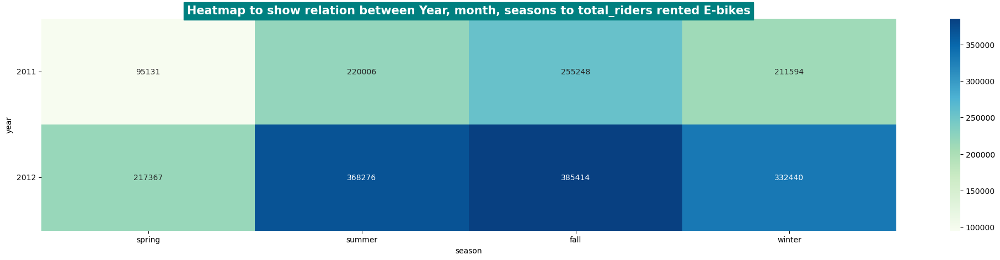

In [128]:
yms=yd.groupby(['year','season'])['total_riders'].sum()
data= yms.unstack(level=[1])
data.replace(np.nan,0, inplace=True)
display(data)
plt.figure(figsize=(25,5))
sns.heatmap(data, annot=True, fmt='.6g',cmap='GnBu')
plt.title('Heatmap to show relation between Year, month, seasons to total_riders rented E-bikes',
          fontsize=15,fontweight="bold",backgroundcolor=cp[0],color='w')
plt.yticks(rotation=0)
plt.show()

#### 🏷️Insights:

> From both the ***Krukal-walis test & ANOVA test*** , we can confirm that `The mean number of E-bikes rented differs across various Seasons.`

-----

## 🤔💭<span style="color:skyblue"><strong>Buisness Insights</strong></span>💭🤔

> <span style="color:teal"><strong>Seasonal Patterns</strong></span>
- Maximum bike rentals occur during summer, while the minimum is observed in winter.

> <span style="color:teal"><strong>Conditions Impact</strong></span>
- Clear weather is associated with the highest bike rental counts, whereas rentals sharply decrease in rain, thunderstorm, snow, or fog.
- Humidity, windspeed, temperature and weather are correlated with season and impacts the count of cycles rented.

> <span style="color:teal"><strong>Temperature Influence</strong></span>
- Lower temperatures correspond to lower bike rentals, and demand rises with increasing temperatures.

> <span style="color:teal"><strong>Time-of-Day Trends</strong></span>
- Bike rentals peak during the day, decline through the night, indicating a pattern fluctuation.
 
> <span style="color:teal"><strong>Holiday and Working Day Dynamics</strong></span>
- Less rentals on holidays and weekends, with a demand increase on non-working days. However, the overall count on working and non-holiday days are similar.

> <span style="color:teal"><strong>User Type Behavior</strong></span>
- Casual riders dominate on weekends, while registered users are more active on working days.

> <span style="color:teal"><strong>Yearly Growth and User Composition</strong></span>
* The hourly rental count shows impressive annual growth from 2011 to 2012.  
* Approximately 19% of users are casual, and 81% are registered.

> <span style="color:teal"><strong>Monthly and Daily Usage Patterns</strong></span>
- Notable seasonal patterns, with peak demand in spring and summer, and a decline in fall and winter.
- January to March sees the lowest rental counts, and a distinctive daily trend shows peak usage during the afternoon.

> <span style="color:teal"><strong>Weather Impact on Usage</strong></span>
- Clear and partly_cloudy weather correlates with higher rental counts, while extreme weather conditions have limited data representation.

> <span style="color:teal"><strong>Correlations</strong></span>
- Temperature and feeling temperature exhibit a strong positive correlation.
- Registered Users and Total_riders exhibit a strong positive correlation as well.
- Limited correlation observed between weather-related factors and bike rental counts.

> <span style="color:teal"><strong>Statistical Significance</strong></span>
- ANOVA tests confirm statistically significant impacts of seasons and weather on bike rentals.
- Working days vs. holidays have limited impact according to a 2-sample t-test.
- ChiSquare confirms that the Weather is dependent on the Seasons.


---

## ✴️⚡<span style="color:lime"><strong>Business Recommendations</strong></span>⚡✴️

> <span style="color:skyblue"><strong>Strategic Seasonal Marketing</strong></span>
* Leverage seasonal patterns by implementing targeted marketing during peak seasons (spring and summer).
* Introduce seasonal incentives and exclusive packages to drive higher demand.

> <span style="color:skyblue"><strong>Dynamic Time-based Pricing</strong></span>
* Optimize resource utilization by implementing dynamic time-based pricing.
* Adjust rental rates to encourage bike usage during off-peak hours, enhancing accessibility.

> <span style="color:skyblue"><strong>Enhanced Weather Data Collection</strong></span>
* Collect more data on extreme weather conditions to understand user behavior.
* Consider specialized bike models or safety measures for different weather scenarios.

> <span style="color:skyblue"><strong>Weather-sensitive Promotions</strong></span>
* Launch weather-specific promotional campaigns focusing on clear and partly cloudy conditions.
* Introduce weather-based discounts to attract more users during favorable weather.

> <span style="color:skyblue"><strong>User-Centric Segmentation</strong></span>
* Tailor marketing strategies for registered and casual users.
* Offer loyalty programs and personalized incentives for registered users, highlighting occasional use benefits for casual users.

> <span style="color:skyblue"><strong>Optimized Inventory Management</strong></span>
* Fine-tune inventory levels based on monthly demand patterns.
* Avoid overstocking during low-demand months and ensure sufficient bikes during peak periods.

> <span style="color:skyblue"><strong>Customer Comfort and Convenience</strong></span>
* Provide amenities like umbrellas or rain jackets to enhance customer comfort.
* Elevate the overall biking experience, contributing to positive customer feedback.

> <span style="color:skyblue"><strong>Collaboration with Weather Services</strong></span>
* Partner with weather services for real-time updates in marketing campaigns.
* Showcase ideal biking conditions through app integration, appealing to weather-specific preferences.


> <span style="color:skyblue"><strong>Seasonal Bike Maintenance</strong></span>
* Conduct thorough seasonal bike maintenance to prevent breakdowns.
* Ensure optimal bike performance, enhancing customer satisfaction.

> <span style="color:skyblue"><strong>Customer Feedback and Reviews</strong></span>
* Encourage customer feedback to identify areas for improvement.
* Customize services based on insights, exceeding customer expectations.

> <span style="color:skyblue"><strong>Strategic Social Media Marketings</strong></span>
* Utilize social media platforms for strategic promotions and engagement.
* Share diverse biking experiences, customer testimonials, and run targeted advertising campaigns.

**These recommendations aim to maximize `Yulu`'s market reach, optimize operations, and enhance the overall customer experience. Implementing these strategies will position Yulu as a customer-centric and environmentally-conscious brand in the electric bike rental industry.**

## 🤝 Inshort:
**In summary, the pivotal factors influencing bike rentals are the season and weather, overshadowing the impact of working and non-working days. To optimize operations, emphasis should be placed on expanding bike parking zones during months excluding winter (Nov-Feb). Considering the decline in bike rentals during winter, exploring alternatives like electric car rentals for comfortable cold-weather commuting is recommended.**